# Optimization of the CRM-like Box Beam with Distributed Load

In our [last notebook](20_Two-variables_Optimization_of_the_CRM-like_Box_Beam.ipynb) we performed a structural optimization of the CRM-like box beam employing two design variables. These design variables controlled the wall thickness at the root and at the tip of the box beam, with a prescribed linear variation between the two locations. The optimization with the nonlinear structural stability constraint resulted in a 29% mass reduction with respect to that employing traditional linear buckling constraints.

In this notebook we want to go a step further in complexity and perform the optimization employing an applied load that is not concentrated at the tip, like in our previous cases, but distributed along the length of the box beam. We are going to consider an elliptical load distribution to mimic an aerodynamic load, and we are going to study the influence of three different load introduction methods on the nonlinear structural stability response and on the optimization results.

* [Definition of the CRM-like box beam model](#model-definition)
* [Formulation of the optimization problems](#optimization-problems)
* [Setup of the numerical model](#numerical-setup)
* [Non-follower forces](#non-follower)
    * [Mesh convergence study](#mesh-convergence)
    * [Mesh convergence verification](#mesh-verification)
    * [Linear buckling optimization](#non-follower-load-linear)
    * [Nonlinear structural stability optimization](#non-follower-nonlinear)
* [Follower forces](#follower)
    * [Linear buckling optimization](#follower-linear)
    * [Nonlinear structural stability optimization](#follower-nonlinear)
* [Non-follower forces applied on load reference axis](#lra)
    * [Linear buckling optimization](#lra-linear)
    * [Nonlinear structural stability optimization](#lra-nonlinear)

In [1]:
import matplotlib.pyplot as plt  # package for making plots
import tol_colors as tc  # package for colorblind-friendly colors
import os  # package for file and directory manipulation
from matplotlib.lines import Line2D  # class defining the characters for the marker styles

# Set up matplotlib for interactive plotting and set default plot settings
%matplotlib widget
plt.rc('axes', prop_cycle=plt.cycler('color', list(tc.tol_cset('bright'))))  # set default color cycle to TOL bright
plt.rcParams["figure.dpi"] = 120  # set default dpi of figures

# Set the path to the directory containing the analysis files
ANALYSIS_DIRECTORY_PATH = os.path.join(
    os.getcwd(), "analyses", "21_Optimization_of_the_CRM-like_Box_Beam_with_Distributed_Load")

# Define constant variables related to plotting
FIRST_SUBCASE_ID = 1
SECOND_SUBCASE_ID = 2
Z_COMPONENT_INDEX = 2  # index of z-component in load and displacement array
MARKERS = list(Line2D.markers.keys())[2:]  # list of marker characters
COLORS = plt.rcParams['axes.prop_cycle'].by_key()['color']  # list with default color cycle
UNSTABLE_COLOR = COLORS[1]  # color for unstable segments
GLASS_CEILING_COLOR = COLORS[2]  # green is used for glass ceiling
del COLORS[1:3]  # delete red from list of colors

# Set the environment variable for the directory containing the report files
report_directory_path = os.path.relpath(ANALYSIS_DIRECTORY_PATH, os.getcwd())
os.environ['OPENMDAO_REPORTS_DIR'] = report_directory_path

## Definition of the CRM-like box beam model <a name="model-definition"></a>

***

We recall the geometrical parameters that we derived in [notebook 18](18_Development_and_Nonlinear_Structural_Stability_Analysis_of_a_CRM-like_Box_Beam_Model.ipynb).

In [2]:
import numpy as np  # import numpy library

L = 29.38e3  # [mm] box beam length
W = 3.41e3  # [mm] box beam width
h = 0.77e3  # [mm] box beam height
t0 = h/100  # [mm] initial box beam thickness
stiffeners_height = h/10  # [mm] stiffeners height
no_stiffeners = 2  # number of stiffeners
stiffeners_x_locations = np.linspace(0, W, no_stiffeners + 2)[1:-1]  # [mm] stiffeners x-coordinates
stiffeners_spacing = W/(no_stiffeners + 1)  # [mm] stiffeners spacing
ribs_spacing = stiffeners_spacing*1.4 # [mm] ribs spacing
no_ribs = round(L/ribs_spacing) + 1  # number of ribs
ribs_y_locations = np.linspace(0, L, no_ribs)  # [mm] ribs y-coordinates
print(f"""
Number of stiffeners: {no_stiffeners:d}
Number of ribs: {no_ribs:d}""")  # print number of stiffeners and ribs


Number of stiffeners: 2
Number of ribs: 19


Then we recall the material properties, taken from the paper by [Brooks et al. (2018)](https://arc.aiaa.org/doi/10.2514/1.J056603).

In [3]:
rho = 2780e-12  # density [tons/mm^3]
E = 73.1e3  # Young's modulus [MPa]
nu = 0.3  # Poisson's ratio
SIGMA_Y = 420.  # yield strength [MPa]

## Formulation of the optimization problems <a name="optimization-problems"></a>

***

In this notebook we want to move a step further in the realism of the optimization scenario of the CRM-like box beam and use a distributed load, as opposed to 

We define the linear buckling optimization problem as follows:

$$
    \begin{aligned}
        & \text{minimize} & & m\\
        & \text{by varying} & & t_\mathrm{min} \leq \left[t_\mathrm{root}, t_\mathrm{tip}\right] \leq t_\mathrm{max}\\
        & \text{subject to :} & & g_{BLF,i}=1-BLF_i<0,\; i=1, \dots, N_{BLF}\\
        & & & g_{\sigma, j}=\sigma_k-\sigma_\mathrm{max}<0,\; j=1, \dots, N_e,
    \end{aligned}
$$

where $m$ is the structural mass, $t_\mathrm{root}$ and $t_\mathrm{tip}$ is are the wall thickness at the root and tip rib, respectively, $t_\mathrm{min}$ and $t_\mathrm{max}$ are the thickness bounds, $BLF_i$ is the $i$-th buckling load factor, $\sigma_j$ is the von Mises stress of the $j$-th element and $\sigma_\mathrm{max}$ is the yield strenght of the material.

Instead of imposing the constraints on each buckling load factor and on each element, we are going to aggregate each type of constraint using Kreisselmeier–Steinhauser (KS) functions ([Martins & Ning, 2021](https://www.cambridge.org/highereducation/books/engineering-design-optimization/B1B23D00AF79E45502C4649A0E43135B#contents)), so that we have one single value for the linear buckling constraint and one single value for the stress constraint:

$$g_{KS_{BLF}}=\max_i\left(g_{BLF,i}\right)+\frac{1}{\rho}\ln\left(\sum_{i=1}^{N_i}\exp\left(\rho\left(g_{BLF,i}-\max_i\left(g_{BLF,i}\right)\right)\right)\right),$$
$$g_{KS_\sigma}=\max_j\left(\sigma_j-\sigma_\mathrm{max}\right)+\frac{1}{\rho}\ln\left(\sum_{j=1}^{N_e}\exp\left(\rho\left(\sigma_j-\sigma_\mathrm{max}-\max_j\left(\sigma_j-\sigma_\mathrm{max}\right)\right)\right)\right).$$

We define the optimization problem with nonlinear structural stability constraints as follows:

$$
    \begin{aligned}
        & \text{minimize} & & m\\
        & \text{by varying} & & t_\mathrm{min} \leq \left[t_\mathrm{root}, t_\mathrm{tip}\right] \leq t_\mathrm{max}\\
        & \text{subject to :} & & g_{\sigma, j}=\sigma_k-\sigma_\mathrm{max}<0,\; j=1, \dots, N_e\\
        & & & g_{\lambda_{ij}}=-\lambda_{ij}<0,\; i=1, \dots, N_i,\; j=1, \dots, N_\lambda\\
        & & & g_P=0.99-\frac{P}{P_\mathrm{design}}<0
    \end{aligned}
$$

$$KS_\lambda=\max_{i,j}\left(g_{\lambda,\,ij}\right)+\frac{1}{\rho}\ln\left(\sum_{i=1}^{N_i}\sum_{j=1}^{N_\lambda}\exp\left(\rho\left(g_{\lambda,\,ij}-\max_{i,j}\left(g_{\lambda,\,ij}\right)\right)\right)\right),$$
$$KS_\sigma=\max_k\left(g_{\sigma,\,k}\right)+\frac{1}{\rho}\ln\left(\sum_{k=1}^{N_e}\exp\left(\rho\left(g_{\sigma,\,k}-\max_k\left(g_{\sigma,\,k}\right)\right)\right)\right).$$

## Setup of the numerical model <a name="numerical-setup"></a>

***

## Non-follower forces <a name="non-follower"></a>

***

For the first analysis we consider an elliptical load applied by means of non-follower forces introduced at every node of the top and bottom skins. We will consider this approach as the baseline for the comparison with the other two load application methods.

We define the elliptical load distribution as

$$ P(y) = \frac{4}{\pi l}\sqrt{1 - \left(\frac{y}{l}\right)^2}\,,$$

where $l$ is the length of the box beam and $y$ is the coordinate along the beam axis. The factor $4/\left(\pi l\right)$ is introduced to ensure that total applied load is equal to $1$ N. In this way, we can easily scale the total applied load to any desired value.

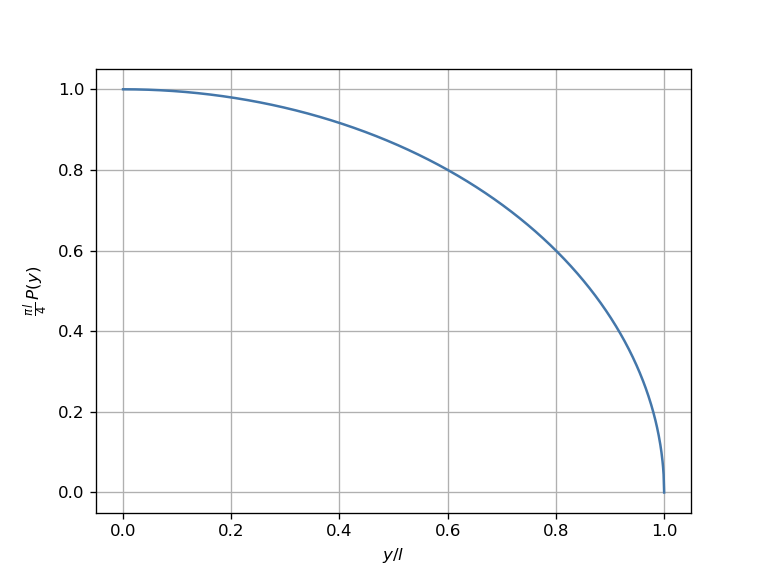

In [4]:
y_array = np.linspace(0, L, 1000)
load_array = (4 / (np.pi * L)) * np.sqrt(1 - (y_array / L)**2)
_, ax = plt.subplots()
ax.plot(y_array/L, load_array/(4/(np.pi*L)))
plt.xlabel("$y/l$")
plt.ylabel(r"$\frac{\pi\,l}{4}\,P(y)$")
plt.grid(True)
plt.show()

To mimic an aerodynamic load, we are going to apply half of this load distribution to the top skin and the other half to the bottom skin. In addition, for each $y$ coordinate along the box beam length, we are going to distribute the load equally over the nodes along the width of the two skins. In this way, we are going to have a load distribution that is constant along the width of the box beam and that varies along the length of the box beam. Of course this is a simplification of the real aerodynamic load distribution, and it doesn't account for any torsion, but for the moment it is enough for our purposes.

Since this type of load is different from what we applied in the previous analyses and optimizations of the CRM-like box beam, we need to perform a new mesh convergence study. In order to do that, we need a function that adds the appropriate `FORCE` cards to each node of the top and bottom skins given a certain mesh as input (which is defined in the `BDF` object in terms of `GRID` cards).

When we discretize our box beam into a mesh and we apply the forces to the nodes, the factor $4/\left(\pi l\right)$ does not ensure that the total applied load is equal to $1$ N, as the total applied load becomes a function of the number of nodes. For this reason, we need to change the factor $4/\left(\pi l\right)$ depending on the mesh that we use.

To achieve the above, we define the function `apply_distributed_non_follower_forces`, which performs the following operations:
- find the unique and sorted sequence of the y-coordinate of the nodes;
- find the correct scaling factor such that the total applied load is equal to $1$ N. This is done by finding the root of the function $f\left(n\right) = \sum_{i=1}^{n} P\left(y_i\right) - 1$, where $n$ is the number of $y$ stations along the length of the box beam and $P\left(y_i\right)$ is the load applied at the $i$-th station calculated with the formula of the elliptical load distribution introduced above;
- apply the appropriate `FORCE` cards to the nodes of the top and bottom skins.

In [5]:
from scipy.optimize import fsolve  # import fsolve from scipy library
from resources import pynastran_utils  # import pynastran_utils module from resources folder

FORCE_SET_ID = 11  # set id for force cards
NODE_TOLERANCE = 1e-3  # tolerance to find nodes at specific locations [mm]

def apply_distributed_non_follower_forces(bdf):
    # Create array of node ids and of node coordinates
    node_ids = []
    nodes_xyz_list = []
    for id in bdf.nodes.keys():  # loop over all node ids
        node_ids.append(id)
        nodes_xyz_list.append(bdf.nodes[id].xyz)
    node_ids = np.array(node_ids)
    nodes_xyz_array = np.vstack(nodes_xyz_list)
    
    # Create array with unique y-coordinates within tolerance
    y_coordinates = np.unique(nodes_xyz_array[:, 1].round(decimals=int(np.abs(np.log10(NODE_TOLERANCE)))))
    
    # Find the scaling factor that makes the total applied load equal to 1
    f = lambda x: np.sum(x * np.sqrt(1 - (y_coordinates / L)**2)) - 1  # function to be solved to find the correct scaling factor
    scaling_factor_guess = 4 / (np.pi * L)  # initial guess for the solver
    scaling_factor = fsolve(f, scaling_factor_guess)[0]  # find the root of the function to find the scaling factor
    
    # Apply distributed load over top and bottom skin
    local_forces = scaling_factor/2 * np.sqrt(1 - (y_coordinates / L)**2)  # compute local forces at each y-coordinate (scaling factor is divided by 2 because the force is applied over both top and bottom skin)
    for i, y in enumerate(y_coordinates):  # loop over unique y-coordinates
        force_magnitude = local_forces[i]
        top_skin_ids = node_ids[(np.abs(nodes_xyz_array[:, 1] - y) < NODE_TOLERANCE) & (np.abs(nodes_xyz_array[:, 2] - h/2) < NODE_TOLERANCE)]  # find id of nodes with y = y and z = h/2 (top skin nodes at current y-coordinate)
        pynastran_utils.add_uniform_force(
            bdf=bdf, nodes_ids=top_skin_ids, set_id=FORCE_SET_ID, direction_vector=[0, 0, 1], force_magnitude=force_magnitude)  # apply local force over top skin nodes of current y-coordinate
        bottom_skin_ids = node_ids[(np.abs(nodes_xyz_array[:, 1] - y) < NODE_TOLERANCE) & (np.abs(nodes_xyz_array[:, 2] + h/2) < NODE_TOLERANCE)]  # find id of nodes with y = y and z = -h/2 (bottom skin nodes at current y-coordinate)
        pynastran_utils.add_uniform_force(
            bdf=bdf, nodes_ids=bottom_skin_ids, set_id=FORCE_SET_ID, direction_vector=[0, 0, 1], force_magnitude=force_magnitude)  # apply local force over bottom skin nodes of current y-coordinate
    
    # Return array with unique y-coordinates and with local forces
    return y_coordinates, local_forces

### Mesh convergence study <a name="mesh-convergence"></a>

To run our mesh convergence study we define 10 different target lengths for the shell elements, ranging from half the height of the box beam to 1/8th of the height of the stiffeners. For each target length we create the mesh with the function `mesh_box_beam_reinforced_with_ribs_and_stiffeners` from the `box_beam_utils` module, create a `BDF` object with the function `create_base_bdf_input` from the same module, apply the load with the function `apply_distributed_non_follower_forces` and run a linear buckling analysis with the function `run_sol_105_buckling_analysis` from the `pynastran_utils` module. We monitor the linear buckling load and the number of degrees of freedom to check the convergence of the mesh.

In [6]:
from resources import box_beam_utils  # import box_beam_utils module from resources folder

# Define shell elements' lengths to be used for the mesh convergence study and print them to screen
shell_element_lengths = np.geomspace(h/2, stiffeners_height/8, 10) # [m]
shell_element_lengths = [shell_element_lengths[3]]  # uncomment to select converged element length
np.set_printoptions(precision=1, suppress=True)
print("Prescribed length of shell elements for mesh convergence study [mm]:")
print(shell_element_lengths)

# Initialize arrays with number of elements, number of degrees of freedom and linear buckling loads
no_elements = np.empty(np.shape(shell_element_lengths), dtype=int)
dofs = np.empty(np.shape(shell_element_lengths), dtype=int)
linear_buckling_loads = np.empty(np.shape(shell_element_lengths))

# Define function to adjust axes ticks and labels' position
def adjust_3d_plot(axes, colorbar=None):
    axes.locator_params(axis="x", nbins=3)  # set number of ticks of x-axis
    axes.locator_params(axis="z", nbins=2)  # set number of ticks of z-axis
    axes.tick_params(axis="y", which="major", pad=20)  # adjust position of ticks' label of y-axis
    axes.tick_params(axis="z", which="major", pad=6)  # adjust position of ticks' label of z-axis
    axes.yaxis.labelpad = 80  # adjust position of y-axis's label
    axes.zaxis.labelpad = 10  # adjust position of z-axis's label
    if colorbar is not None:
        colorbar.ax.set_position(colorbar.ax.get_position().shrunk(1.0, .66))  # decrease colorbar size
        colorbar.ax.set_position(colorbar.ax.get_position().translated(-.05, .14))  # move colorbar upwards

# Iterate through the different edge lengths
for count, element_length in enumerate(shell_element_lengths):
    # Generate base bdf input
    mesh = box_beam_utils.mesh_box_beam_reinforced_with_ribs_and_stiffeners(
        width=W, height=h, ribs_y_coordinates=ribs_y_locations, stiffeners_x_coordinates=stiffeners_x_locations,
        stiffeners_height=stiffeners_height, element_length=element_length)
    nodes_xyz_array = mesh.points
    nodes_connectivity_matrix = mesh.faces.reshape(-1, 5)[:, 1:]
    linear_buckling_bdf = box_beam_utils.create_base_bdf_input(
        young_modulus=E, poisson_ratio=nu, density=rho, shell_thickness=t0, nodes_xyz_array=nodes_xyz_array,
        nodes_connectivity_matrix=nodes_connectivity_matrix)
    
    # Apply distributed load
    apply_distributed_non_follower_forces(linear_buckling_bdf)
    
    # Store number of elements and number of degrees of freedom of current model
    no_elements[count] = len(linear_buckling_bdf.elements)
    constrained_nodes_ids = next(iter(linear_buckling_bdf.spcs.values()))[0].node_ids
    dofs[count] = (len(linear_buckling_bdf.nodes) - len(constrained_nodes_ids))*6
    
    # Run SOL 105 and return OP2 object
    input_name = f"sol_105_{no_elements[count]}_elements"
    sol_105_op2 = pynastran_utils.run_sol_105(
        bdf=linear_buckling_bdf, static_load_set_id=FORCE_SET_ID, analysis_directory_path=ANALYSIS_DIRECTORY_PATH,
        input_name=input_name, run_flag=False)
    
    # Find critical buckling load and print it
    print(f"""\n\033[1mResults of model with:
    - {element_length:.1f} mm prescribed element length
    - {no_elements[count]:d} elements
    - {dofs[count]:d} degrees of freedom\033[0m""")
    linear_buckling_loads[count] = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].eigr
    print(f"Buckling load: {linear_buckling_loads[count]:.0f} N")
    
    # Plot critical buckling mode
    # print("Buckling mode:")
    # _, ax, cbar = pynastran_utils.plot_buckling_mode(op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID,
    #                                                  displacement_component='tz', colormap='sunset',
    #                                                  length_unit='m', displacement_amplification_factor=2, unit_scale_factor=1e-3)
    # adjust_3d_plot(ax, cbar)
    # plt.show()

Prescribed length of shell elements for mesh convergence study [mm]:
[112.57468292119535]


subcase=0 already exists...skipping


Nastran job sol_105_33120_elements.bdf completed
Wall time: 21.0 s

Results of model with:
    - 112.6 mm prescribed element length
    - 33120 elements
    - 192348 degrees of freedom
Buckling load: 30438 N


Let's plot the linear buckling load as a function of the number of degrees of freedom for the different meshes. On the right axis we visualize the percentage difference with respect to the linear buckling load obtained with the finest mesh.

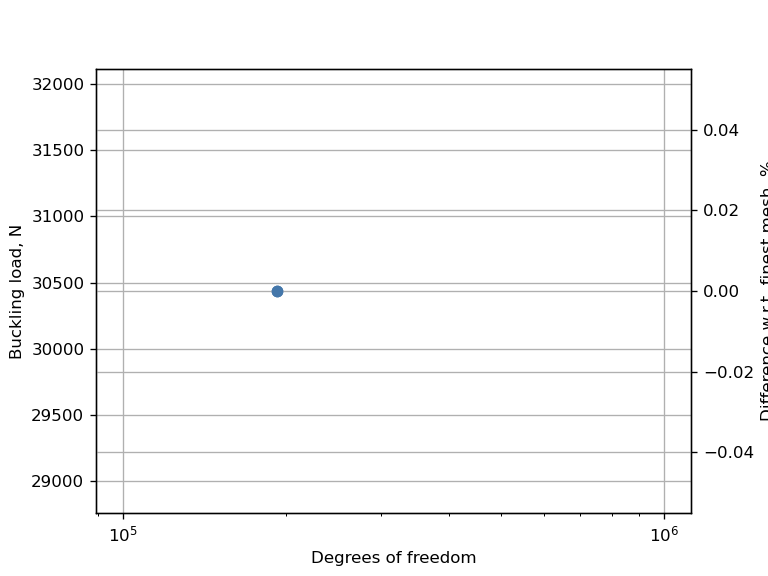

In [7]:
# Plot buckling loads vs degrees of freedom with a log scale along the x-axis
fig, ax1 = plt.subplots()  # create a figure and set of axes
buckling_load_line = ax1.semilogx(dofs, linear_buckling_loads, 'o-')

# Create a twin set of axes to plot percentage difference vs degrees of freedom
ax2 = ax1.twinx()
percentage_diff = (linear_buckling_loads/linear_buckling_loads[-1]-1)*100
percentage_diff_line = ax2.plot(dofs, percentage_diff, 'o-')

# Set plot appearance
ax1.set_xlabel('Degrees of freedom')
ax1.set_ylabel('Buckling load, N') #, color=buckling_load_line[0].get_color())
ax2.set_ylabel('Difference w.r.t. finest mesh, %') #, color=percentage_diff_line[0].get_color())
ax1.grid(True)
ax2.grid(True)
plt.show()

We see that the linear buckling load converges to a value just below 30500 N. We define the mesh to be converged when the linear buckling load is within 1% of the value obtained with the finest mesh.

In [8]:
converged_mesh_index = np.where(np.abs(percentage_diff) < 1)[0][0]  # find index corresponding to first percentage difference below 1
element_length_converged_mesh = np.round(shell_element_lengths[converged_mesh_index], 1)  # store shell length of converged mesh
no_elements_converged_mesh = no_elements[converged_mesh_index]  # store number of elements of converged mesh
sol_105_buckling_load = np.round(linear_buckling_loads[converged_mesh_index])  # store buckling load of converged mesh approximating to the nearest integer
print(f"""
The mesh is converged for a target shell element length of {element_length_converged_mesh:.1f} mm,
corresponidng to {no_elements_converged_mesh} elements, {dofs[converged_mesh_index]} degrees of freedom
and to a linear buckling load of {sol_105_buckling_load:.0f} N.""")


The mesh is converged for a target shell element length of 112.6 mm,
corresponidng to 33120 elements, 192348 degrees of freedom
and to a linear buckling load of 30438 N.


### Mesh convergence verification <a name="mesh-verification"></a>

Similarly to [notebook 18](18_Development_and_Nonlinear_Buckling_Analysis_of_a_CRM-like_Box_Beam_Model.ipynb), we want to verify the mesh convergence in the nonlinear region of the structural stability response. For this purpose, we run a nonlinear analysis using the converged mesh and another nonlinear analysis using a refined mesh obtained by halving the target element length. Ideally, the two analyses should result in approximately the same nonlinear structural stability response.

We start with the nonlinear analysis employing the converged mesh: we create the mesh and the `BDF` object, define the nonlinear analysis parameters to follow the equilibrium path with a fine resolution, apply twice the linear buckling load found in the mesh convergence study and run the nonlinear analysis calling the function `run_sol_106_with_kllrh_eigenvalues` from the `pynastran_utils` module. To assess the structural stability response we monitor the 20 smallest magnitude eigenvalues of the tangent stiffness matrix.

In [9]:
# Create mesh with converged target element length
original_mesh = box_beam_utils.mesh_box_beam_reinforced_with_ribs_and_stiffeners(
    width=W, height=h, ribs_y_coordinates=ribs_y_locations, stiffeners_x_coordinates=stiffeners_x_locations,
    stiffeners_height=stiffeners_height, element_length=element_length_converged_mesh)

# Create BDF obejct
nodes_xyz_array = original_mesh.points
nodes_connectivity_matrix = original_mesh.faces.reshape(-1, 5)[:, 1:]
original_mesh_bdf = box_beam_utils.create_base_bdf_input(
    E, nu, rho, t0, nodes_xyz_array, nodes_connectivity_matrix, parallel=True)

# Apply twice the linear buckling load
non_follower_forces_bdf = original_mesh_bdf.__deepcopy__({})
apply_distributed_non_follower_forces(non_follower_forces_bdf)  # add FORCE cards to define the elliptical load
LOAD_SET_ID = FORCE_SET_ID + 1  # id of load set
scale_factor = sol_105_buckling_load*2  # scale factor to apply to the load set
non_follower_forces_bdf.add_load(sid=LOAD_SET_ID, scale=1., scale_factors=[scale_factor], load_ids=[FORCE_SET_ID])  # add LOAD card
pynastran_utils.create_static_load_subcase(bdf=non_follower_forces_bdf, subcase_id=FIRST_SUBCASE_ID, load_set_id=LOAD_SET_ID)  # create subcase with static load

# Setup SOL 106 with arc-length method using parameters for fine resolution of equilibrium path
non_follower_forces_sol_106_bdf = non_follower_forces_bdf.__deepcopy__({})
pynastran_utils.set_up_arc_length_method(
    bdf=non_follower_forces_sol_106_bdf, max_iter=3, conv='PU', eps_u=1e-5, eps_p=1e-6, max_bisect=20, minalr=1e-5, desiter=4, maxinc=300)

# Run nonlinear analysis
METHOD_SET_ID = LOAD_SET_ID + 1  # id of method set used for the calculation of eigenvalues
NO_EIGENVALUES = 20  # number of eigenvalues to be calculated
UPPER_EIGENVALUE = 100.  # upper bound for eigenvalues [N/mm] - set to 10^5 N/m to avoid convergence issues of Lanczos solver
key = "original mesh"  # key to be used to store the results of the nonlinear analysis
input_name_dict = {key: f"sol_106_{no_elements_converged_mesh}_elements"}  # initialize dictionary with input names of nonlinear analyses
sol_106_op2_dict = {key: pynastran_utils.run_sol_106_with_kllrh_eigenvalues(
    bdf=non_follower_forces_sol_106_bdf, method_set_id=METHOD_SET_ID, no_eigenvalues=NO_EIGENVALUES,
    analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name_dict[key], upper_eig=UPPER_EIGENVALUE,
    run_flag=False)}

subcase=0 already exists...skipping


Nastran job sol_106_33120_elements.bdf completed
Wall time: 7694.0 s


Now we halve the target length of the shell elements to obtain the refined mesh and we run the same nonlinear analysis. Increase EPSP to 1e-5 for convergence.

In [10]:
# Create mesh with half of the converged target element length
refined_mesh = box_beam_utils.mesh_box_beam_reinforced_with_ribs_and_stiffeners(
    width=W, height=h, ribs_y_coordinates=ribs_y_locations, stiffeners_x_coordinates=stiffeners_x_locations,
    stiffeners_height=stiffeners_height, element_length=element_length_converged_mesh/2)

# Create BDF object
refined_mesh_bdf = box_beam_utils.create_base_bdf_input(
    E, nu, rho, t0, refined_mesh.points,  refined_mesh.faces.reshape(-1, 5)[:, 1:], parallel=True)

# Create static load subcase with twice the buckling load predicted by SOL 105
apply_distributed_non_follower_forces(refined_mesh_bdf)
refined_mesh_bdf.add_load(sid=LOAD_SET_ID, scale=1., scale_factors=[scale_factor], load_ids=[FORCE_SET_ID])
pynastran_utils.create_static_load_subcase(
    bdf=refined_mesh_bdf, subcase_id=FIRST_SUBCASE_ID, load_set_id=LOAD_SET_ID)

# Setup SOL 106 with arc-length method using parameters for fine resolution of equilibrium path
pynastran_utils.set_up_arc_length_method(
    bdf=refined_mesh_bdf, max_iter=3, conv='PU', eps_u=1e-5, eps_p=1e-5, max_bisect=20, minalr=1e-5, desiter=4, maxinc=300)

# Run analysis
no_elements_refined_mesh = len(refined_mesh_bdf.elements)
key = "refined mesh"
input_name_dict[key] = f"sol_106_{no_elements_refined_mesh}_elements"
sol_106_op2_dict[key] = pynastran_utils.run_sol_106_with_kllrh_eigenvalues(
    bdf=refined_mesh_bdf.__deepcopy__({}), method_set_id=METHOD_SET_ID, no_eigenvalues=NO_EIGENVALUES,
    analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name_dict["refined mesh"], upper_eig=UPPER_EIGENVALUE, run_flag=False)

subcase=0 already exists...skipping


Nastran job sol_106_108276_elements.bdf completed
Wall time: 104115.0 s


Analogously to [notebook 18](18_Development_and_Nonlinear_Buckling_Analysis_of_a_CRM-like_Box_Beam_Model.ipynb), we make the first comparison between the two analysis by plotting the eigenvalues of the tangent stiffness matrix against the nondimensional applied load.

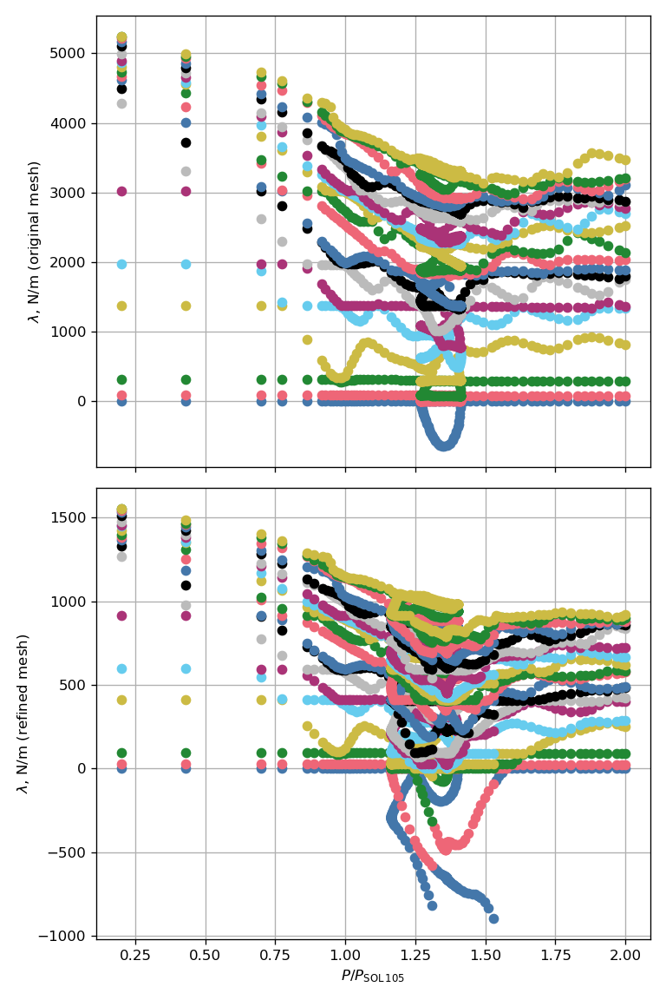

In [11]:
from resources import plot_utils

# Initialize dictionaries to store nondimensional applied loads and eigenvalues of tangent stiffness matrix
nondimensional_loads_dict = {}
eigenvalues_dict = {}

# Loop over the two models and read applied loads and eigenvalues
for key in sol_106_op2_dict:
    _, loads, _ = pynastran_utils.read_load_displacement_history_from_op2(op2=sol_106_op2_dict[key])  # read applied loads from OP2 object
    nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/sol_105_buckling_load  # nondimensionalize applied loads with buckling load of model with original mesh
    f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name_dict[key] + '.f06')  # path of f06 file
    eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)  # read eigenvalues from f06 file

# Plot the eigenvalue diagram for both models
fig, axes = plt.subplots(2, 1, sharex=True, figsize=(6.4, 4.8*2))  # create a figure with two axes
for count, key in enumerate(input_name_dict):  # iterate over the two models
    plot_utils.plot_eigenvalue_diagram(axes[count], nondimensional_loads_dict[key], eigenvalues_dict[key]*1e3)  # convert eigenvalues from N/mm to N/m
    axes[count].set_ylabel(f"$\lambda$, N/m ({key})")  # set y-axis label

# Finalize plot appearance
axes[count].set_xlabel("$P/P_\mathrm{SOL\/105}$")
plt.tight_layout()
plt.show()

In the eigenvalue plot of the original mesh we recognize the presence of two load limit points, one at approximately $P/P_\text{SOL 105}=1.41$, where one eigenvalue becomes negative, and the other at approximately $P/P_\text{SOL 105}=1.27$, where the same eigenvalue becomes positive again.

Also the refined mesh exhibits one load limit point where one eigenvalue becomes negative at approximately the same load of the original mesh, $P/P_\text{105}=1.40$, but the same eigenvalue does not become positive again and it remains negative for the rest of the analysis. This means that the analysis with the refined mesh describes an equilibrium path where the structure remains unstable after the first load limit point. In addition to this, we can find other eigenvalues that cross zero at different nondimensional loads, suggesting the presence of other limit points or bifurcation points.

To understand what is going on, we are going to plot a 3D load-displacement diagram. As usual, we are going to plot the applied load against a representation of the global and local displacements of the box beam. For the former we are going to use the vertical tip displacement, while for the latter we are going to use the vertical displacement of the node where the linear buckling analysis predicts the largest displacement of the critical buckling mode.

First we find the node associated to the tip of the box beam in both models.

In [12]:
tip_node_xyz = np.array([W/2, L, 0])  # tip node is taken at the center of the tip rib
tip_node_id_dict = {"original mesh": np.argmin(np.linalg.norm(original_mesh.points - tip_node_xyz, axis=1)) + 1,
                    "refined mesh": np.argmin(np.linalg.norm(refined_mesh.points - tip_node_xyz, axis=1)) + 1}

Then we find the node where the linear buckling analysis predicts the largest displacement of the critical buckling mode. For the model with the converged mesh we only need to read the op2 file of the analysis that we run during the mesh convergence study, while for the model with the refined mesh we need to run a new linear buckling analysis. In both cases, we plot the critical buckling mode highlighting the node of interest.

subcase=1 already exists...skipping


Nastran job sol_105_108276_elements.bdf completed
Wall time: 80.0 s
Critical buckling mode of original mesh


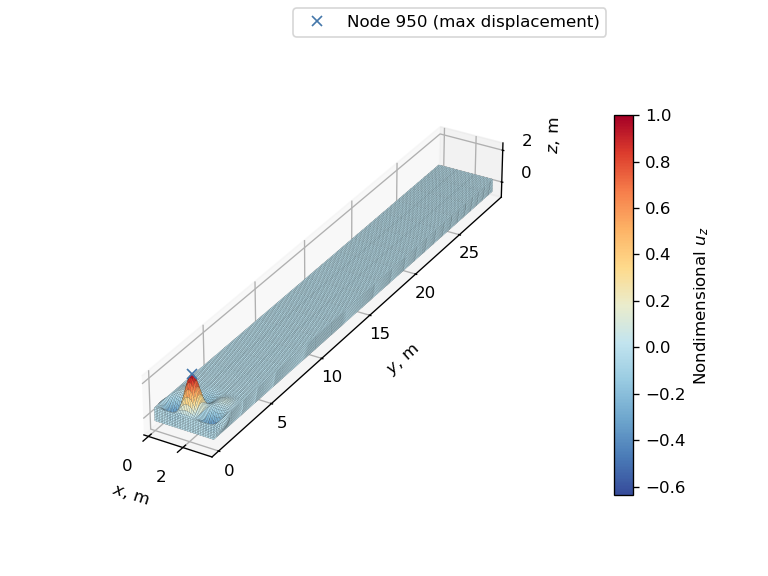

Critical buckling mode of refined mesh


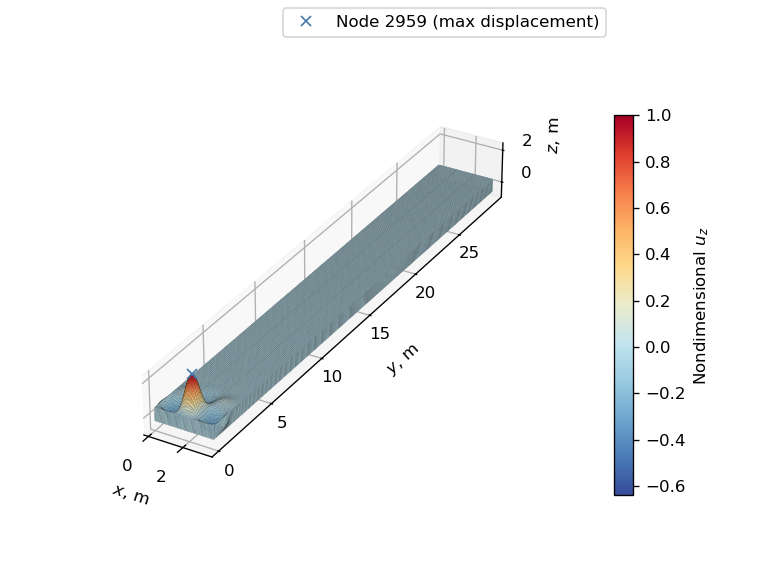

In [13]:
from pyNastran.op2.op2 import read_op2  # import function to read op2 file

# Read op2 file of SOL 105 analysis with original mesh#
key = "original mesh"
input_name = f"sol_105_{no_elements_converged_mesh}_elements"
sol_105_op2_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.op2')
sol_105_op2_dict = {key: read_op2(op2_filename=sol_105_op2_filepath, load_geometry=True, debug=None)}

# Run SOL 105 for model with refined mesh
key = "refined mesh"
input_name = f"sol_105_{no_elements_refined_mesh}_elements"
sol_105_op2_dict[key] = pynastran_utils.run_sol_105(
    bdf=refined_mesh_bdf, static_load_set_id=FORCE_SET_ID, analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name,
    run_flag=False)

# Loop over the two models to plot critical buckling mode and find node where maximum displacement occurs
amplification_factor = 2  # amplification factor for displacements
root_node_id_dict = {}  # initialize dictionary to store node id where max displacement occurs
for key in sol_105_op2_dict:
    
    # Plot critical buckling mode
    print(f"Critical buckling mode of {key}")
    _, ax, cbar = pynastran_utils.plot_buckling_mode(
        op2=sol_105_op2_dict[key], subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
        displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to m
    
    # Find node where max displacement occurs
    max_displacement_index = np.argmax(np.linalg.norm(sol_105_op2_dict[key].eigenvectors[SECOND_SUBCASE_ID].data[0, :, 0:3], axis=1))  # find index of max displacement magnitude
    root_node_id_dict[key] = sol_105_op2_dict[key].eigenvectors[SECOND_SUBCASE_ID].node_gridtype[max_displacement_index, 0]  # find id of node with max displacement magnitude
    
    # Plot node where max displacement occurs
    max_displacement_node_xyz = sol_105_op2_dict[key].nodes[root_node_id_dict[key]].xyz*1e-3 +\
        sol_105_op2_dict[key].eigenvectors[SECOND_SUBCASE_ID].data[0, max_displacement_index, 0:3]*amplification_factor  # add displacement to node position and convert to m
    ax.plot(max_displacement_node_xyz[0], max_displacement_node_xyz[1], max_displacement_node_xyz[2], "x",
            label=f"Node {root_node_id_dict[key]:d} (max displacement)", zorder=4)
    ax.legend()  # add legend
    adjust_3d_plot(ax, cbar)  # adjust plot appearance
    plt.show()  # show plot

Now we can read the displacement history at the two nodes for both analyses using the function `read_load_displacement_history_from_op2`.

In [14]:
# Initialize dictionary to store displacements
displacements = {}

# Read displacements of models with original and refined mesh
for key in sol_106_op2_dict:
    _, _, displacements[key] = pynastran_utils.read_load_displacement_history_from_op2(
        op2=sol_106_op2_dict[key], node_ids=[root_node_id_dict[key], tip_node_id_dict[key]])

Succesively, we nondimensionalize the local and tip displacements with the width and the length of the box beam, respectively.

In [15]:
# Initialize dictionary to store nondimensional displacements
nondimensional_displacements_dict = {}

# Iterate over the displacements of the two models and nondimensionalize with appropriate reference length
for key in displacements:
    nondimensional_displacements_dict[key] = {"root": displacements[key][root_node_id_dict[key]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
                                              "tip": displacements[key][tip_node_id_dict[key]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

Finally, we plot the 3D load-displacement diagram. We use the function `plot_3d_load_displacements_stability` from the `plot_utils` module to highlight the unstable segments of the equilibrium paths.

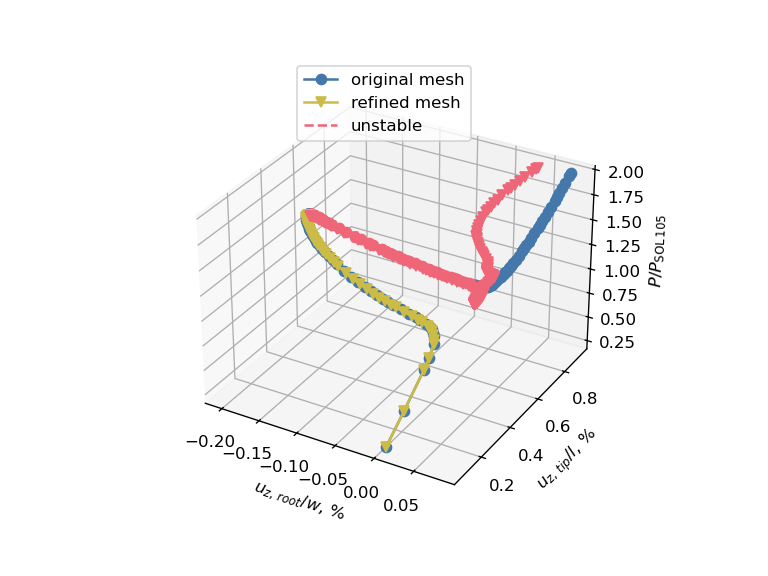

In [16]:
# Create 3D plot of equilibrium diagram
fig = plt.figure()  # create a figure
ax_3d = plt.axes(projection="3d")  # create 3D axes
stable_lines = []  # list to store proxy artists for the legend
for count, key in enumerate(nondimensional_displacements_dict):  # loop through the different meshes
    
    # Plot load-displacement curve
    plot_utils.plot_3d_load_displacements_stability(eigenvalues=eigenvalues_dict[key], axes=ax_3d,
                                                    displacements1=nondimensional_displacements_dict[key]["root"]*100,
                                                    displacements2=nondimensional_displacements_dict[key]["tip"]*100,
                                                    loads=nondimensional_loads_dict[key],
                                                    marker=MARKERS[count], color=COLORS[count])
    stable_lines.append(Line2D([0], [0], linestyle='-', marker=MARKERS[count], color=COLORS[count], label=key))  # create proxy artist for the legend

# Add proxy artist for unstable lines and create legend
unstable_line = Line2D([0], [0], linestyle='--', color=UNSTABLE_COLOR, label="unstable")
fig.legend(handles=stable_lines + [unstable_line], loc="upper center", bbox_to_anchor=(0.5, 0.9))

# Set plot appearance
ax_3d.set_xlabel("$u_{z,\,root}/w$, %")
ax_3d.set_ylabel("$u_{z,\,tip}/l$, %")
ax_3d.set_zlabel("$P/P_\mathrm{SOL\/105}$")
ax_3d.grid(visible=True)
plt.show()

Initially, we observe a clear overlap between the two equilibrium paths. However, as the equilibrium path of the original mesh regains stability, the equilibrium path of the refined mesh starts taking another trajectory. This trajectory appears relatively convoluted and zooming in we observe the presence of several local minima and maxima for both displacements and applied load.

What is happening to the model with the refined mesh? Both the eigenvalues and the load-displacement curves do not show any evident jump, so it is possible that we are looking at the natural equilibrium path all along the analysis. However, even if we cannot see any evident jump, a "small" jump migth still have occurred somewhere in the analysis, possibly to a complementary path that is very close to the natural path.

In general, it is known that the nonlinear behavior of structures found by numerical analyses can become more complex as the mesh is refined. Let's consider the example of the symmetric shallow cylindrical arch (images taken from the Nonlinear Structures and Structural Stability course of University of Bristol).

![Symmetric shallow cylindrical arch.](resources/21_ShallowArch.PNG "Symmetric shallow cylindrical arch.")

If we discretize this structure with only two beam elements and three nodes, the system will exhibit a snap-back behavior. However, if we refine the mesh enough, the system will show the more complex response shown in the image below.

![Response of the symmetric shallow cylindrical arch with a fine mesh.](resources/21_ShallowArchResponse.PNG "Response of the symmetric shallow cylindrical arch with a fine mesh.")

This more involved response is characterized by the presence of a number of "petals", where several displacement and load limit points can be found. Furthermore, this system also exhibits a symmetry breaking bifurcation along the dimension of the midpoint node rotation.

![Symmetry breaking bifurcation of the symmetric shallow cylindrical arch with a fine mesh.](resources/21_ShallowArchBifurcation.PNG "Symmetry breaking bifurcation of the symmetric shallow cylindrical arch with a fine mesh.")

This example shows that not only we can find a more complex response as the mesh is refined, but also that we can find new features in the response that were not present in the coarser mesh.

In the case of our CRM-like box beam, all possibilities are open:
- the unstable segment of the equilibrium path of the refined mesh could be the first part of a series of "petals" that eventually end with the recover of stability at an equilibrium point close to where the original mesh regains stability;
- the unstable segment occurs along a new bifurcation behavior that was not present in the original mesh;
- the unstable segment has jumped to a complementary path that is very close to the natural path.

In the attempt of gainining a clearer insight into the different structural stability response found for our CRM-like box beam, we are going to plot its structural deformation at a few points along the equilibrium paths. We start by defining the function `plot_load_displacement_comparison` to plot the applied load against the local displacement for both meshes. This time we use the function `plot_2d_load_displacements_stability` from the `plot_utils` module to plot the applied load against the local displacement and highlight the unstable segments.

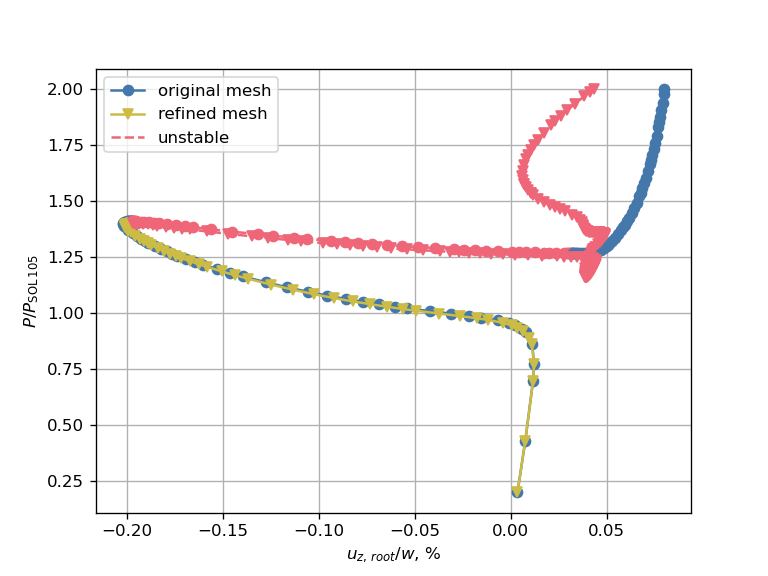

In [17]:
def plot_load_displacement_comparison(axes):
    stable_lines = []  # list to store proxy artists for the legend
    # Plot equilibrium path for original mesh using plot_2d_load_displacements_stability function
    for count, key in enumerate(nondimensional_displacements_dict):  # loop through the different meshes
        plot_utils.plot_2d_load_displacements_stability(eigenvalues=eigenvalues_dict[key], axes=axes,
                                                        displacements=nondimensional_displacements_dict[key]["root"]*100,
                                                        loads=nondimensional_loads_dict[key],
                                                        marker=MARKERS[count], color=COLORS[count])
        stable_lines.append(Line2D([0], [0], linestyle='-', marker=MARKERS[count], color=COLORS[count], label=key))  # create proxy artist for the legend
    # Add proxy artist for unstable lines and create legend
    unstable_line = Line2D([0], [0], linestyle='--', color=UNSTABLE_COLOR, label="unstable")
    axes.legend(handles=stable_lines + [unstable_line])
    # Set axes labels and grid
    axes.set_xlabel("$u_{z,\,root}/w$, %")
    axes.set_ylabel("$P/P_\mathrm{SOL\/105}$")
    axes.grid(visible=True)

# Plot applied load vs local displacement for original and refined meshes
fig, ax = plt.subplots()  # create a figure and set of axes
plot_load_displacement_comparison(ax)  # plot equilibrium path for original and refined meshes
plt.show()  # show plot

The first equilibrium points where we want to inspect the deformation of the box beam are the points where the two structures first become unstable. We highlight these points in the load-displacement diagram and we plot the corresponding deformations, zooming into the root region as it is the region where the buckling-like deformation occurs. We color the element faces according the the average rotation about the $x$-axis and we amplify the displacements by a factor of 70 to visualize more clearly the deformation.

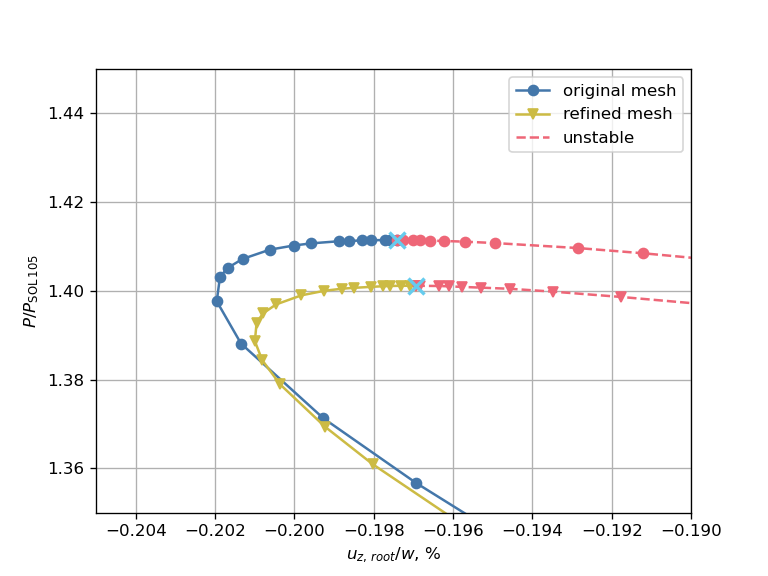

Deformation of original mesh:


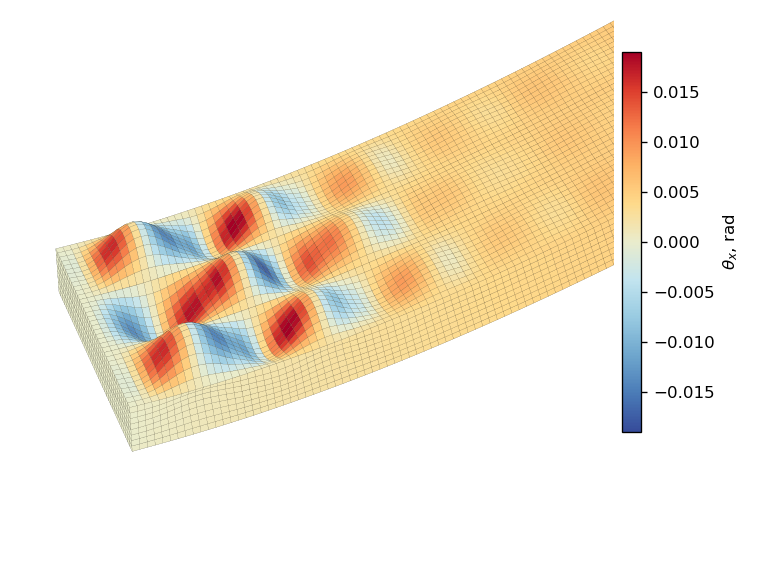

Deformation of refined mesh:


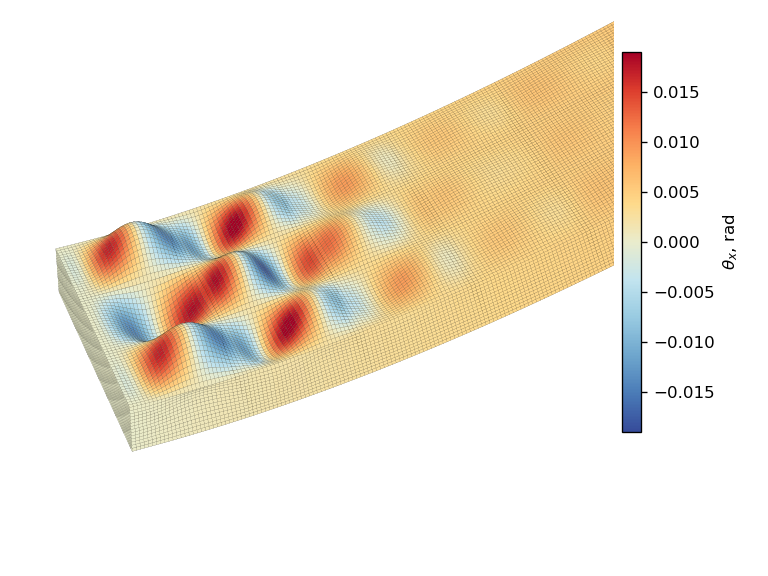

In [18]:
# Plot limit points on load-displacement diagram
first_negative_eigenvalue_index = {}  # initialize dictionary to store index of first negative eigenvalue
fig, ax = plt.subplots()  # create a figure and set of axes
plot_load_displacement_comparison(ax)  # plot equilibrium path for original and refined meshes
for key in input_name_dict:  # loop through the different meshes
    first_negative_eigenvalue_index[key] = np.where(eigenvalues_dict[key][0] < 0)[0][0]  # find index of first negative eigenvalue
    ax.plot(nondimensional_displacements_dict[key]["root"][first_negative_eigenvalue_index[key]]*100,
            nondimensional_loads_dict[key][first_negative_eigenvalue_index[key]], 'x', color=COLORS[2], mew=2, ms=10)  # plot limit point
ax.set_xlim(-.205, -.19)  # set x-axis limits
ax.set_ylim(1.35, 1.45)  # set y-axis limits
plt.show()  # show plot

# Define function to zoom deformation plot to root
def zoom_to_root(axes, colorbar):
    colorbar.ax.set_position(colorbar.ax.get_position().translated(.01, .11))  # move colorbar up and right
    axes.set_xlim(0, W*1e-3)  # set x-axis limits
    axes.set_ylim(0, 2*W*1e-3)  # set y-axis limits
    axes.set_zlim(-h/2*1e-3, h*1e-3)  # set z-axis limits
    axes.set_box_aspect([ub - lb for lb, ub in (getattr(ax, f"get_{a}lim")() for a in 'xyz')])  # set aspect ratio of axes
    plt.axis('off')  # turn off axes
    axes.view_init(40, -20)  # set view angle

# Plot deformed shape at limit point for original and refined meshes
amplification_factor = 70  # amplification factor for displacements
clim = [-.019, .019]  # color limits for deformation plot
for key in input_name_dict:  # loop through the different meshes
    print(f"Deformation of {key}:")
    fig, ax, cbar = pynastran_utils.plot_static_deformation(op2=sol_106_op2_dict[key], load_step=first_negative_eigenvalue_index[key] + 1,
                                                            displacement_component='rx', colormap='sunset', length_unit='m', unit_scale_factor=1e-3,
                                                            displacement_amplification_factor=amplification_factor, clim=clim)  # plot deformation converting from mm to m
    adjust_3d_plot(ax, cbar)
    zoom_to_root(ax, cbar)
    plt.show()

The two meshes present a very similar deformation, depicting one half wave in the first rib-stiffener bays and two half waves in the succeeding bays. This deformation is very similar to the one we obtained for the CRM-like box beam under a concentrated tip load.

Then we plot the deformation at the equilibrium point where the original mesh regains stability and for the refined mesh we choose the closest point to that of the original mesh. Again, we highlight these points in the load-displacement diagram and we plot the corresponding deformations.

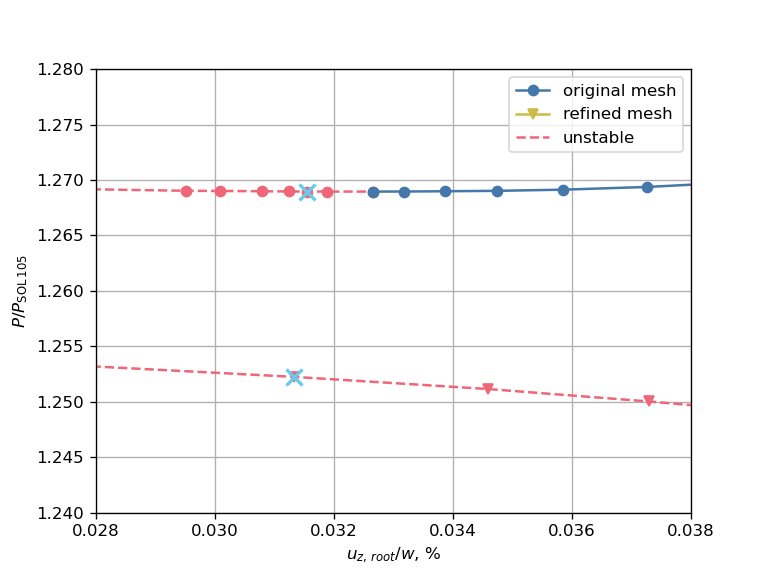

Deformation of original mesh:


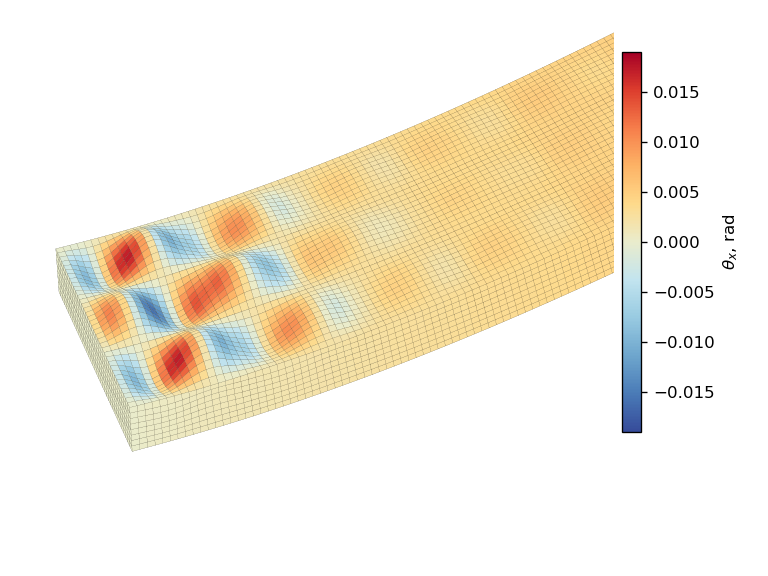

Deformation of refined mesh:


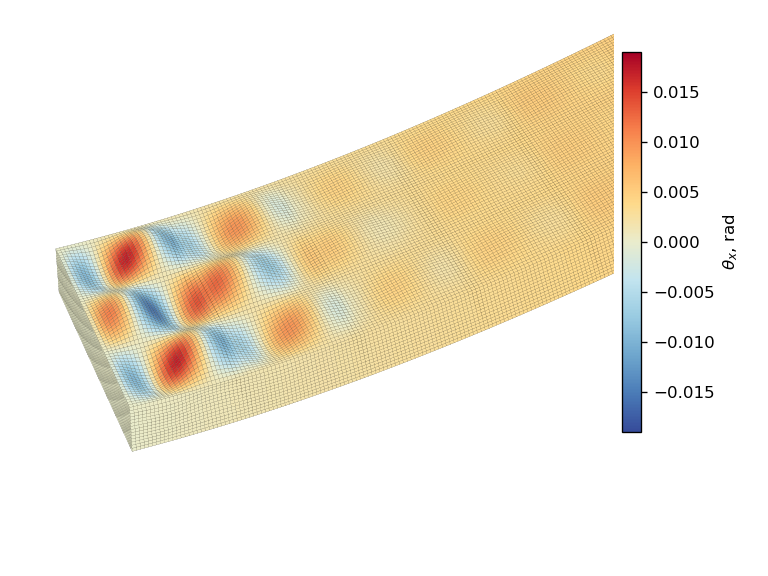

In [19]:
# Plot equilibrium points on load-displacement diagram
fig, ax = plt.subplots()  # create a figure and set of axes
plot_load_displacement_comparison(ax)  # plot equilibrium path for original and refined meshes
regained_stability_index = first_negative_eigenvalue_index["original mesh"] + np.where(
    eigenvalues_dict["original mesh"][0, first_negative_eigenvalue_index[key]:] > 0)[0][0]  # find index of regained stability
closest_displacement_index = np.argmin(np.abs(nondimensional_displacements_dict["original mesh"]["root"][regained_stability_index] -
    nondimensional_displacements_dict["refined mesh"]["root"][:regained_stability_index + 10]))  # find index of closest displacement
plot_indices = [regained_stability_index, closest_displacement_index]  # list of indices to plot
for count, key in enumerate(nondimensional_displacements_dict):  # loop through the different meshes
    ax.plot(nondimensional_displacements_dict[key]["root"][plot_indices[count]]*100,
            nondimensional_loads_dict[key][plot_indices[count]], 'x', color=COLORS[2], mew=2, ms=10)  # highlight equilibrium point in load-displacement diagram
ax.set_xlim(.028, .038)  # set x-axis limits
ax.set_ylim(1.24, 1.28)  # set y-axis limits
plt.show()  # show plot

# Plot deformation at selected equilibrium points for original and refined meshes
for count, key in enumerate(input_name_dict):
    print(f"Deformation of {key}:")
    _, ax, cbar = pynastran_utils.plot_static_deformation(
        op2=sol_106_op2_dict[key], load_step=plot_indices[count] + 1, displacement_component='rx', colormap='sunset', length_unit='m', unit_scale_factor=1e-3,
        displacement_amplification_factor=amplification_factor, clim=clim)  # plot deformation converting from mm to m
    adjust_3d_plot(ax, cbar)
    zoom_to_root(ax, cbar)
    plt.show()

Also in this case the two shapes are very similar, and we can observe that the single half wave in the first rib-stiffener bay has transformed into two half waves. This result is analogous to what we obtained for the CRM-like box beam under a concentrated tip load. The fact that the deformation of the refined mesh is very similar to the deformation of the original mesh and that it does not appear to exhibit any symmetry breaking shape suggests that probably the analysis with the refined mesh did not find any new bifurcation behavior, and that we might be looking at either the first part of a series of unstable "petals" or at a complementary path that is very close to the natural path.

However the symmetry breaking deformation at this equilibrium point might still be too small to be observed. For this reason, we investigate further the response of the refined mesh by plotting its deformation at a few points on the remainder of its equilibrium path. We select the points where the local displacement attains a local maximum and a local minimum, plus the last converged point of the equilibrium path, so that we can visualize the evolution of the deformation along the path.

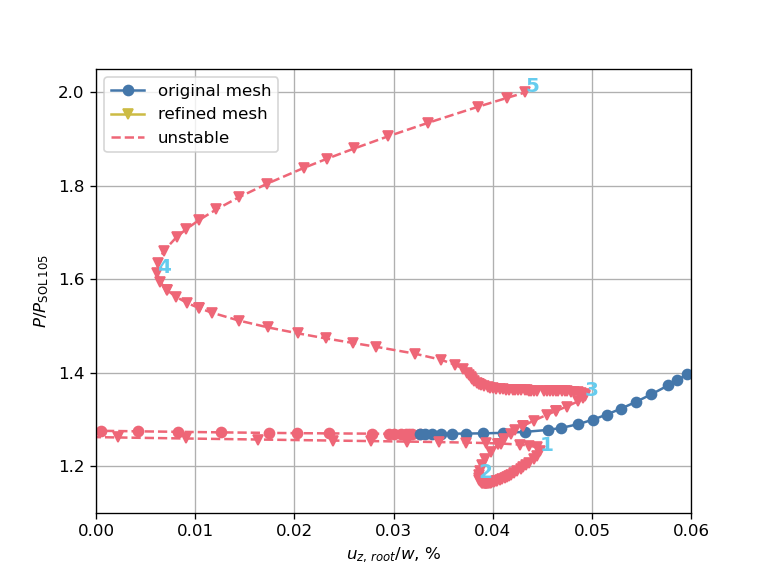

Deformation of point 1:


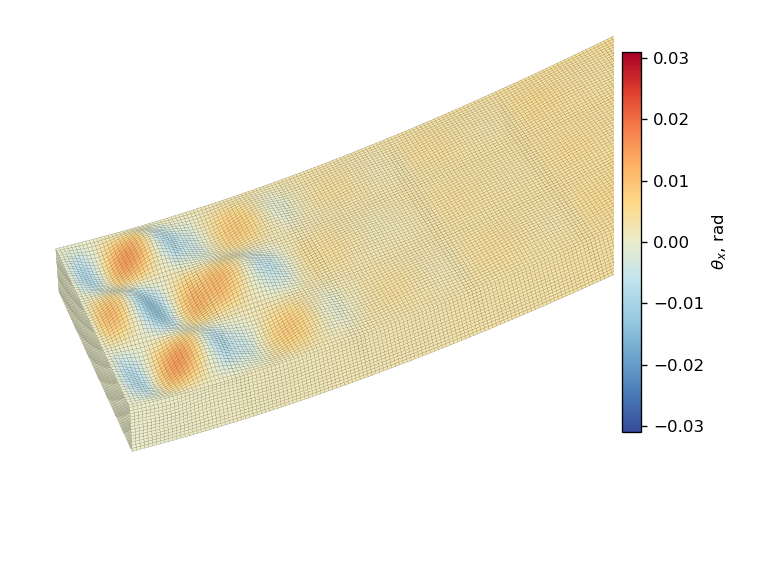

Deformation of point 2:


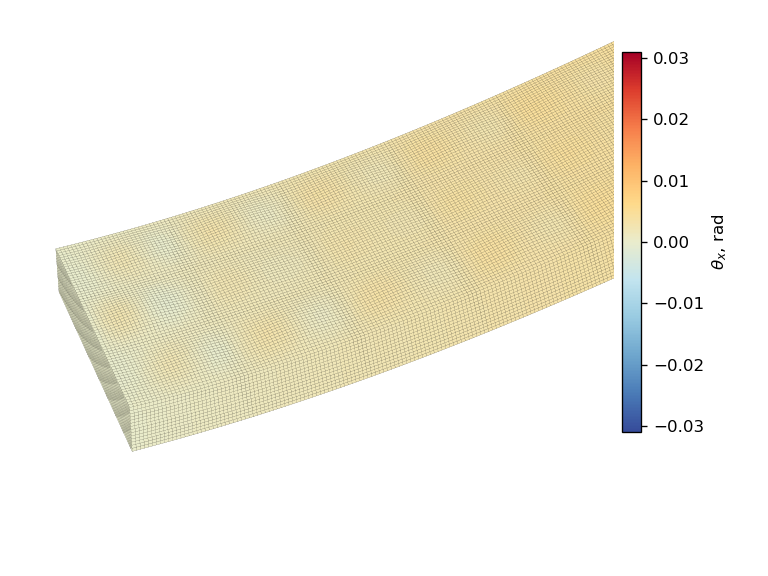

Deformation of point 3:


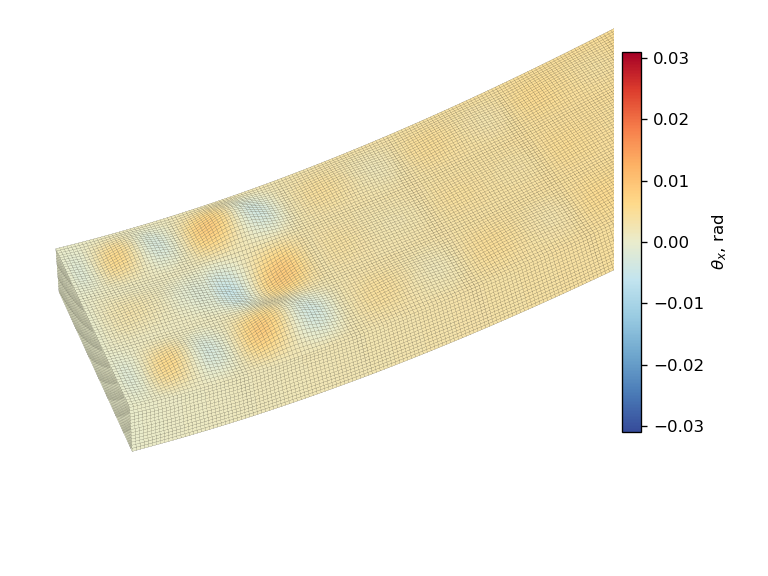

Deformation of point 4:


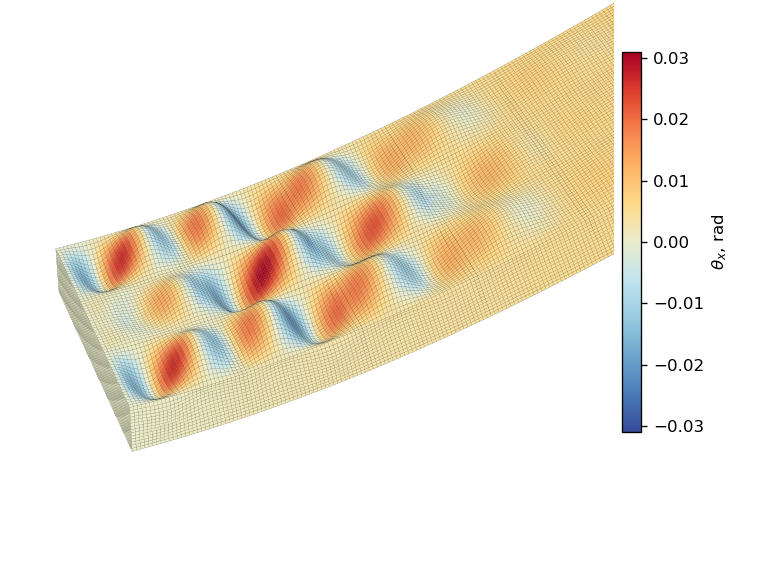

Deformation of point 5:


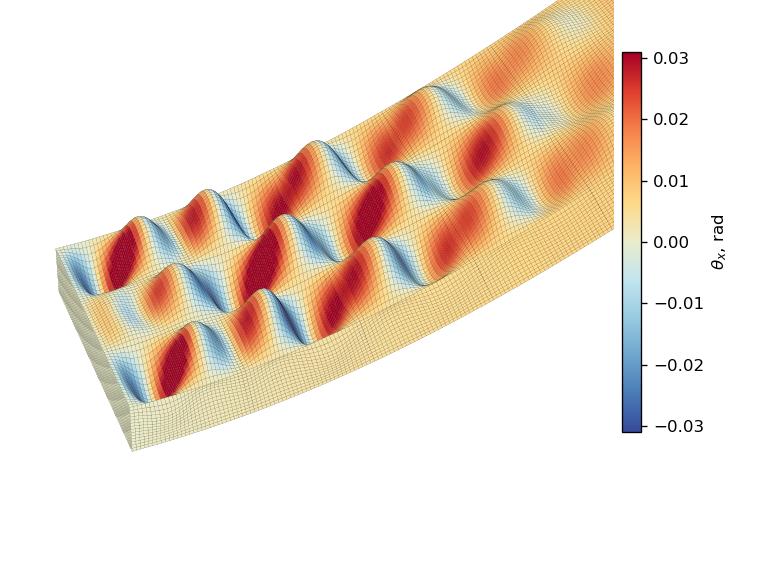

In [20]:
from scipy.signal import argrelextrema  # import function to find local maxima and minima

# Plot equilibrium points on load-displacement diagram
fig, ax = plt.subplots()  # create a figure and set of axes
plot_load_displacement_comparison(ax)  # plot equilibrium path for original and refined meshes
key = "refined mesh"
max_displacement_indices = argrelextrema(nondimensional_displacements_dict[key]["root"], np.greater)  # find indices of local maxima
min_dispalcement_indices = argrelextrema(nondimensional_displacements_dict[key]["root"], np.less)  # find indices of local minima
last_point_index = np.array([len(nondimensional_displacements_dict[key]["root"]) - 1])  # index of last equilibrium point
plot_indices = np.sort(np.hstack((max_displacement_indices[0][1:], min_dispalcement_indices[0][1:], last_point_index)))  # join and sort indices of local maxima and minima discarding the first index of each (they belong to the initial part of the equilibrium path) plus index of last equilibrium point
for count, index in enumerate(plot_indices):  # loop through the equilibrium points to plot
    ax.text(nondimensional_displacements_dict[key]["root"][index]*100,
            nondimensional_loads_dict[key][index],
            f"{count + 1}",
            color=COLORS[2], fontsize=12, weight='bold')  # highlight equilibrium point with a number
ax.set_xlim(0., .06)
ax.set_ylim(1.1, 2.05)
plt.show()  # show plot

# Plot deformation at selected equilibrium points for refined mesh
clim = [-.031, .031]  # color limits for deformed shape plots
for count, index in enumerate(plot_indices):  # loop through the equilibrium points to plot
    print(f"Deformation of point {count + 1}:")
    _, ax, cbar = pynastran_utils.plot_static_deformation(
        op2=sol_106_op2_dict[key], load_step=index + 1, displacement_component='rx', colormap='sunset', length_unit='m', unit_scale_factor=1e-3,
        displacement_amplification_factor=amplification_factor, clim=clim)  # plot deformation converting from mm to m
    adjust_3d_plot(ax, cbar)
    zoom_to_root(ax, cbar)
    plt.show()

The plots above show an initial flattening of the top skin shape and successively the emergence of a higher deformation mode in the central first rib-stiffener bay, where three half waves can be observed in the final deformation. This result confirms the absence of any apparent symmetry breaking behavior, and suggests that we might indeed be looking at the first part of a series of unstable "petals", given the gradual transition to a higher deformation mode.

At this point we could go on and investigate the behavior of the refined mesh further, for example continuing the analysis to verify whether, after a certain number of petals, the equilibrium path recovers stability close to a point where the original mesh does. Alternatively, another investigation aimed at verifying the presence of a higher order behavior could be based on employing quadratic shell elements in the original mesh to ascertain whether we can capture the same more involved behavior of the refined mesh.

However, from an optimization point of view, all we are interested in is the ability of the mesh to capture the first limit point, where the structure first becomes unstable. In fact, with the nonlinear structural stability constraint the optimizer has the goal of producing a structure that is completely stable up to the design load, and it does not allow the structure to go beyond the first limit point. Since the original mesh appears to capture well the nonlinear behavior up to the first limit point, we are not going to investigate the higher order behavior of the refined mesh further.

The last step of our mesh convergence verification study consists in calculating the percentage difference of the first limit point load of the original mesh with respect to that of the refined mesh.

In [21]:
# Print nondimensional applied load at limit point and percentage difference of original mesh w.r.t. refined mesh
print("Nondimensional applied load at first limit point:")
nondimensional_limit_point_load = {}
for key in nondimensional_loads_dict:
    nondimensional_limit_point_load[key] = nondimensional_loads_dict[key][first_negative_eigenvalue_index[key]]
    print(f"- {key}: {nondimensional_limit_point_load[key]:.2f}")
percentage_diff = (nondimensional_limit_point_load["original mesh"]/nondimensional_limit_point_load["refined mesh"] - 1)*100
print(f"\nPercentage difference of original mesh w.r.t. refined mesh: {percentage_diff:.1f} %")

Nondimensional applied load at first limit point:
- original mesh: 1.41
- refined mesh: 1.40

Percentage difference of original mesh w.r.t. refined mesh: 0.7 %


The limit point load of the original mesh is within 1% to that of the refined mesh, confirming that the original mesh is adequate for our optimization purposes.

### Linear buckling optimization <a name="non-follower-linear"></a>

We can now move on to the optimization with linear buckling constraints of the CRM-like box beam loaded with non-follower forces.

We start by creating the mesh using the target element lenght found in the mesh convergence study and we create our base `BDF` object.

In [22]:
non_follower_forces_bdf.case_control_deck.subcases[0].add_result_type('STRESS', 'ALL', ['PLOT'])  # store stress results of all elements in the op2 file


Analogously to our [last notebook](20_Two-variables_Optimization_of_the_CRM-like_Box_Beam.ipynb), we define the thickness to be constant over each rib and box segment (defined between two consecutive ribs), and we define a linear variation of the thickness between the root and the tip rib.

![Thickness patches of the CRM-like box beam.](resources/20_ThicknessPatches.svg "Thickness patches of the CRM-like box beam.")

To achieve this, we need to assign a different `PSHELL` card to each box segment and to each rib. We can do this by calling the function `define_property_patches` from the `box_beam_utils` module.

In [23]:
box_beam_utils.define_property_patches(
    bdf=non_follower_forces_bdf, ribs_y_locations=ribs_y_locations, stiffeners_x_locations=stiffeners_x_locations)

Analogously to our previous notebooks, we define the design load of the structure to be equal to its linear buckling load.

In [24]:
DESIGN_LOAD = sol_105_buckling_load  # assign design load as the linear buckling load of the converged mesh
non_follower_forces_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = DESIGN_LOAD  # scale load to design load

To define our optimization problem within the OpenMDAO framework we start by instantiating a `NastranGroup` object. This object creates the internal `NastranSolver` component, which receives the thickness distribution as input and runs the Nastran analysis to calculate the objective and the constraint functions. Then we set up the `BDF` object for the linear buckling analysis with SOL 105 calling the function `setup_sol_105` from the `pynastran_utils` module. Successively, we define the linear variation of the thickness between the root and the tip rib by means of a spline component, and we connect this to the appropriate input of the `NastranSolver` component. Finally, we instantiate a `Problem` object and we set up the optimization problem hierarchy, variables and connections. 

In [25]:
from resources import optimization_utils  # import optimization_utils module from resources folder
import openmdao.api as om  # make available the most common OpenMDAO classes and functions

# Define NastranGroup object
pynastran_utils.set_up_sol_105(
    bdf=non_follower_forces_bdf, static_load_set_id=LOAD_SET_ID, no_eigenvalues=NO_EIGENVALUES)  # set up SOL 105
input_name = "sol_105_non_follower_linear_opt_start"  # default name of input file
sol_105_group = optimization_utils.NastranGroup(bdf=non_follower_forces_bdf, sigma_y=SIGMA_Y,
                                                analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name,
                                                run_flag=False)  # create NastranGroup object

# Define spline component and connect it to the NastranSolver component
box_segments_eval_y_locations = ribs_y_locations[0:-1] + np.ediff1d(ribs_y_locations)/2  # y-coordinates of the thickness evaluation points for each box segment
x_interp = np.sort(np.concatenate((ribs_y_locations, box_segments_eval_y_locations)))  # combine and sort the y-coordinates of the control points of the stiffened box patches and the ribs
interp_comp = om.SplineComp(method='slinear', x_cp_val=np.array([0, L]), x_interp_val=x_interp)  # create linear spline component
interp_comp.add_spline(y_cp_name='t_cp', y_interp_name='t_val')  # add spline variables to the component
sol_105_group.add_subsystem('interp', interp_comp)  # add spline component to the group
sol_105_group.connect('interp.t_val', 'nastran_solver.t_val')  # connect spline component output to the NastranSolver component input

# Set up optimization problem
linear_problem = om.Problem(model=sol_105_group, name="sol_105_non_follower")
linear_problem.setup()

[IT076000:186594] mca_base_component_repository_open: unable to open mca_btl_openib: librdmacm.so.1: cannot open shared object file: No such file or directory (ignored)
subcase=1 already exists...skipping


Now we assign the initial thickness distribution (constant) and we run our model to record the objective and the constraint functions of the initial design.

In [26]:
# Run linear buckling analysis of initial structure
initial_thickness_vector = t0*np.ones(2)  # constant initial thickness
linear_problem.set_val('interp.t_cp', initial_thickness_vector)  # assign initial thickness vector to input of spline component
linear_problem.run_model()  # run the model

# Print initial values of objective and constraint functions
mass_0 = linear_problem['nastran_solver.mass'][0]
ks_buckling_0 = linear_problem['nastran_solver.ks_buckling'][0]
ks_stress_0 = linear_problem['nastran_solver.ks_stress'][0]
print(f"""Initial mass: {mass_0*1e3:.0f} kg
Initial thickness vector [mm]:""")
np.set_printoptions(precision=1, suppress=True)
print(initial_thickness_vector)
print(f"""Initial KS value for buckling load factor: {ks_buckling_0:.2f}
Initial KS value for stress: {ks_stress_0:.0f} MPa""")

Nastran job sol_105_non_follower_linear_opt_start.bdf completed
Wall time: 25.0 s
Initial mass: 6519 kg
Initial thickness vector [mm]:
[7.7 7.7]
Initial KS value for buckling load factor: 0.00
Initial KS value for stress: -395 MPa


We're almost ready to run the optimization! We define the default parameters for our `NastranGroup` object, choose COBYLA as optimization algorithm, add design variables, objective and constraints to the `Problem` object and add a recorder to the optimizer to store the optimization history. Finally, we run the optimization and we visualize the convergence history.

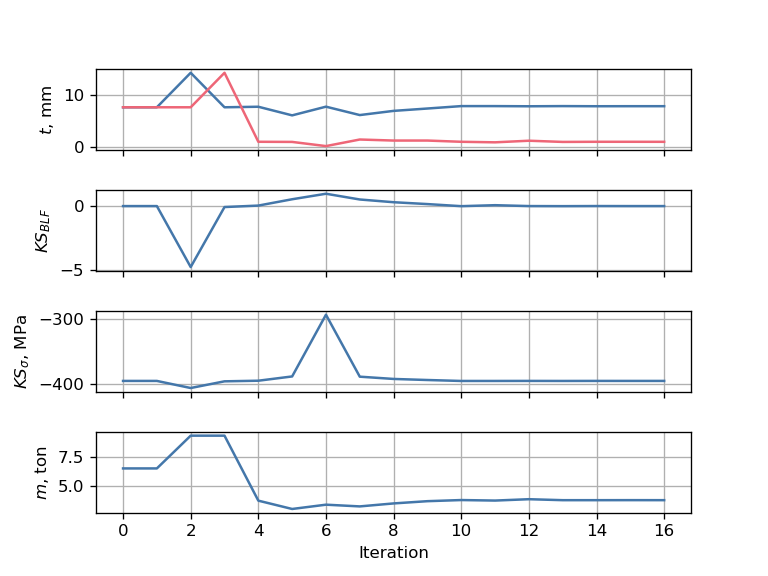

Final mass: 3770 kg
Mass variation: -42.17 %
Final thickness vector [mm]:
[7.9 1. ]
Final KS value of buckling load factor: 0.00
Final KS value for stress: -395.43 MPa


In [27]:
# Set default initial thickness vector and name of input file
linear_problem.model.set_input_defaults('interp.t_cp', initial_thickness_vector)
input_name = "sol_105_non_follower_linear_opt"  # default name of input file
linear_problem.model.options['input_name'] = input_name

# Choose optimizer
linear_problem.driver = om.ScipyOptimizeDriver()
linear_problem.driver.options['optimizer'] = 'COBYLA'
linear_problem.driver.options['tol'] = 1e-3

# Add design variable, objective and constraints
thickness_bounds = [1., 20.]  # [mm]
linear_problem.model.add_design_var('interp.t_cp', lower=thickness_bounds[0], upper=thickness_bounds[1],
                                    ref0=thickness_bounds[0], ref=t0)  # scale thickness so that the lower bound is 0 and initial value is 1
linear_problem.model.add_objective('nastran_solver.mass', ref0=mass_0/2, ref=mass_0)  # scale mass so that half of the initial mass is 0 and the initial mass is 1
linear_problem.model.add_constraint('nastran_solver.ks_buckling', upper=0.)  # KS function for buckling load factor is not scaled because buckling load factor is already a ratio
linear_problem.model.add_constraint('nastran_solver.ks_stress', upper=0., ref=np.abs(ks_stress_0))  # scale KS function for stresses so that the initial value is 1

# Add recorder to the driver
recorder_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.sql')
recorder = om.SqliteRecorder(recorder_filepath)  # create recorder
linear_problem.driver.add_recorder(recorder)  # attach recorder to the driver

# Run optimization
linear_problem.setup()  # re-setup problem before running optimization
linear_problem.set_solver_print(0)  # disable solver output
linear_problem.driver.options['debug_print'] = ['desvars','nl_cons','objs']  # print design variables, constraints and objectives
if False:  # set True or False to run optimization or not
    linear_problem.run_driver()  # run optimization
linear_problem.cleanup()  # clean up problem

# Plot optimization history and print results
histories = optimization_utils.plot_optimization_history(recorder_filepath)  # plot optimization history
mass_percentage_variation = (histories['nastran_solver.mass'][-1, 0]/mass_0 - 1)*100
print(f"""Final mass: {histories['nastran_solver.mass'][-1, 0]*1e3:.0f} kg
Mass variation: {mass_percentage_variation:.2f} %
Final thickness vector [mm]:""")
print(histories['interp.t_cp'][-1])
print(f"""Final KS value of buckling load factor: {histories['nastran_solver.ks_buckling'][-1, 0]:.2f}
Final KS value for stress: {histories['nastran_solver.ks_stress'][-1, 0]:.2f} MPa""")

Plot critical buckling mode of optimized structure.

/mnt/c/Users/qa21944/Github/phd-jupyter-notebooks/notebooks/resources/pynastran_utils.py:321: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


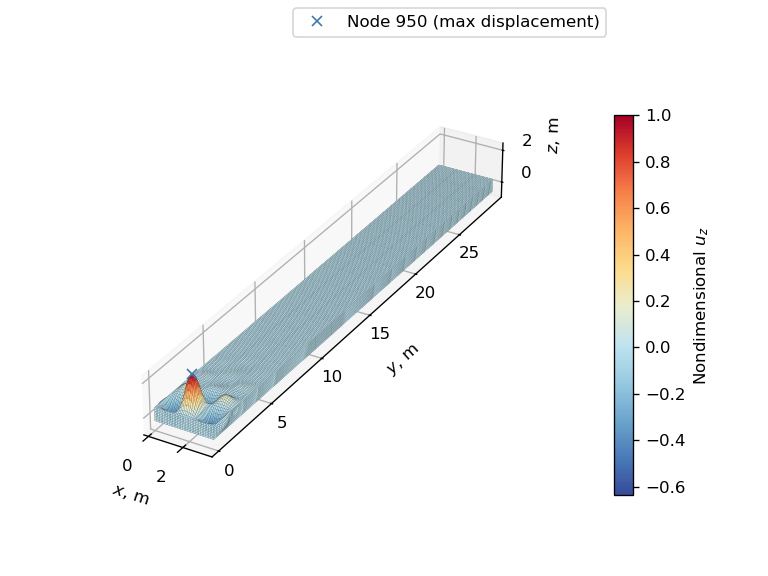

In [28]:
# Read op2 file of linear buckling analysis
sol_105_op2_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.op2')
sol_105_op2 = read_op2(op2_filename=sol_105_op2_filepath, load_geometry=True, debug=None)

# Find node where max displacement occurs
max_displacement_index = np.argmax(np.linalg.norm(sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].data[0, :, 0:3], axis=1))  # find index of max displacement magnitude
key = "linearly optimized structure"
max_displacement_node_id = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].node_gridtype[max_displacement_index, 0]

# Plot buckling mode
amplification_factor = 2  # amplification factor for displacements
_, ax, cbar = pynastran_utils.plot_buckling_mode(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
    displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to m

# Plot node
max_displacement_node_xyz = sol_105_op2.nodes[max_displacement_node_id].xyz*1e-3 + sol_105_op2.eigenvectors[
    SECOND_SUBCASE_ID].data[0, max_displacement_index, 0:3]*amplification_factor  # add displacement to node position and convert from mm to m
ax.plot(max_displacement_node_xyz[0], max_displacement_node_xyz[1], max_displacement_node_xyz[2], 'x',
        label=f"Node {max_displacement_node_id:d} (max displacement)", zorder=4)
ax.legend()

# Adjust plot and show
adjust_3d_plot(ax, cbar)
plt.show()

#### Nonlinear response of linearly optimized structure

Set up OpenMDAO problem with nonlinear analysis.

In [29]:
# Request nonlinear stress output in place of linear stresses
non_follower_forces_sol_106_bdf.case_control_deck.subcases[0].add_result_type('NLSTRESS', 'ALL', ['PLOT'])  # store nonlinear stress results of all elements in the op2 file

# Create NastranGroup object, connect spline and create Problem object
input_name = "sol_106_non_follower_linear_opt"
sol_106_group = optimization_utils.NastranGroup(bdf=non_follower_forces_sol_106_bdf, sigma_y=SIGMA_Y,
                                                analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name, 
                                                run_flag=False)  # create NastranGroup object
sol_106_group.add_subsystem('interp', interp_comp)  # add spline component to the group
sol_106_group.connect('interp.t_val', 'nastran_solver.t_val')  # connect spline component output to the SOL 105 component input
nonlinear_problem = om.Problem(model=sol_106_group, name="sol_106_non_follower")
nonlinear_problem.setup()

Applied twice the design load, assign thickness resulting from linear buckling optimization and run model.

In [30]:
non_follower_forces_sol_106_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = DESIGN_LOAD*2  # scale load to twice the design load
nonlinear_problem.set_val('interp.t_cp', histories['interp.t_cp'][-1])
nonlinear_problem.run_model()

Nastran job sol_106_non_follower_linear_opt.bdf completed
Wall time: 10300.0 s


Plot eigenvalues of tangent stiffness matrix.

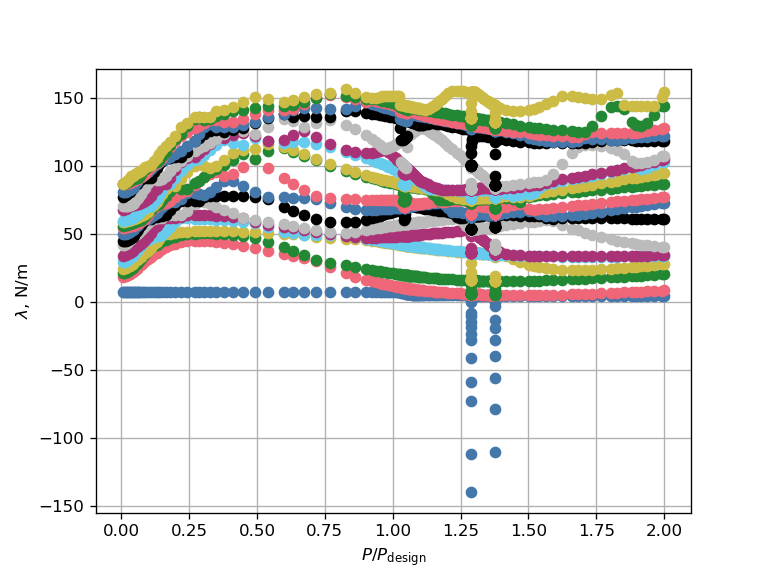

Nondimensional applied load at first limit point: 1.38


In [31]:
# Retrieve OP2 object of nonlinear analysis
sol_106_op2_dict[key] = nonlinear_problem['nastran_solver.op2']

# Read load and displacement history of benchmark analysis from op2 file
plot_nodes_ids = [root_node_id_dict["original mesh"], tip_node_id_dict["original mesh"]]  # list of node ids to plot for model with curved skins
_, loads, displacements = pynastran_utils.read_load_displacement_history_from_op2(
    op2=sol_106_op2_dict[key], node_ids=plot_nodes_ids)
nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/DESIGN_LOAD  # nondimensionalize loads

# Read eigenvalues of tangent stiffness matrix
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path to .f06 file
eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)

# Plot eigenvalues vs applied load
_, ax = plt.subplots()
plot_utils.plot_eigenvalue_diagram(ax, nondimensional_loads_dict[key], eigenvalues_dict[key]*1e3)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

# Print nondimensional applied load at limit point and percentage difference of original mesh w.r.t. refined mesh
nondimensional_limit_point_load = nondimensional_loads_dict[key][np.where(eigenvalues_dict[key][0] < 0)[0][0]]
print(f"Nondimensional applied load at first limit point: {nondimensional_limit_point_load:.2f}")

Plot load-displacement diagrams for initial and linearly optimized structure.

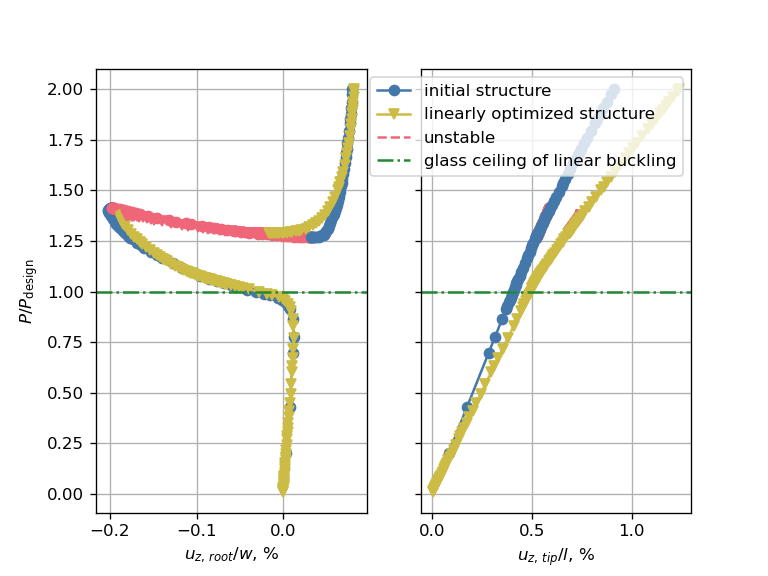

In [32]:
# Duplicate results of the original mesh into new ditionary key
nondimensional_loads_dict["initial structure"] = nondimensional_loads_dict["original mesh"]
nondimensional_displacements_dict["initial structure"] = nondimensional_displacements_dict["original mesh"]
eigenvalues_dict["initial structure"] = eigenvalues_dict["original mesh"]

# Nondimensionalize displacements of the linearly optimized structure
nondimensional_displacements_dict[key] = {
    "root": displacements[plot_nodes_ids[0]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
    "tip": displacements[plot_nodes_ids[1]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

# Plot load-displacement diagrams of the initial and linearly optimized structures
fig, axes = plt.subplots(1, 2, sharey=True)  # create a figure with two subplots
displacement_labels = ["root", "tip"]  # labels for the displacements
reference_lengths = ["w", "l"]  # reference lengths for the displacements
design_labels = ["initial structure", "linearly optimized structure"]  # labels for the designs
for ax_index, displacement_key in enumerate(displacement_labels):  # loop through the displacements
    stable_lines = []  # list to store proxy artists for the legend
    for color_index, design_key in enumerate(design_labels):  # loop through the designs
        plot_utils.plot_2d_load_displacements_stability(eigenvalues_dict[design_key], axes[ax_index],
                                                        nondimensional_displacements_dict[design_key][displacement_key]*100,
                                                        nondimensional_loads_dict[design_key], MARKERS[color_index], COLORS[color_index])  # plot load-displacement curve
        stable_lines.append(Line2D([0], [0], linestyle='-', marker=MARKERS[color_index], color=COLORS[color_index], label=design_key))  # create proxy artist for the legend
    axes[ax_index].axhline(y=1, color=GLASS_CEILING_COLOR, linestyle='-.')  # plot glass ceiling of linear buckling
    axes[ax_index].set_xlabel(f"$u_{{z,\,{displacement_key}}}/{reference_lengths[ax_index]}$, %")  # set x-axis label
    axes[ax_index].grid(visible=True)

# Add legend, y-axis label, and show plot
glass_ceiling_line = Line2D([0], [0], linestyle='-.', color=GLASS_CEILING_COLOR, label="glass ceiling of linear buckling")  # create proxy artist for the legend
axes[1].legend(handles=stable_lines + [unstable_line, glass_ceiling_line])
axes[0].set_ylabel("$P/P_\mathrm{design}$")
plt.show()

Compare deformation at design load.

Deformation at design load of initial structure:


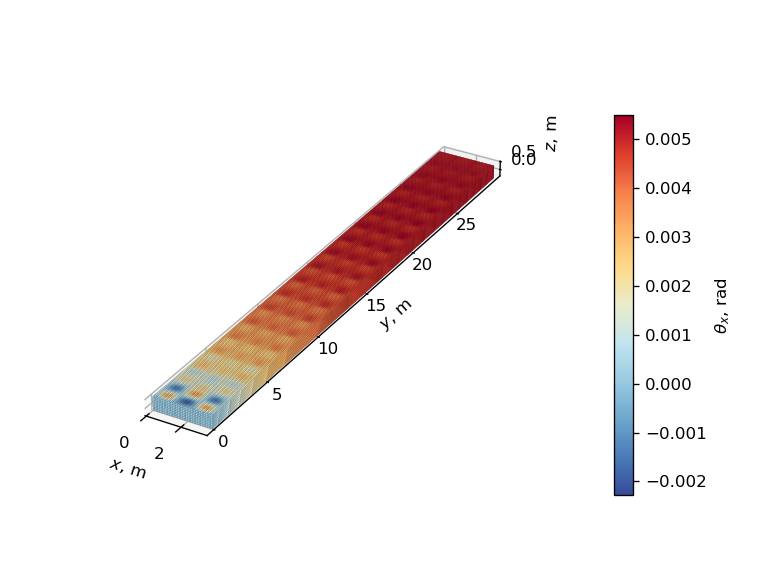

Deformation at design load of linearly optimized structure:


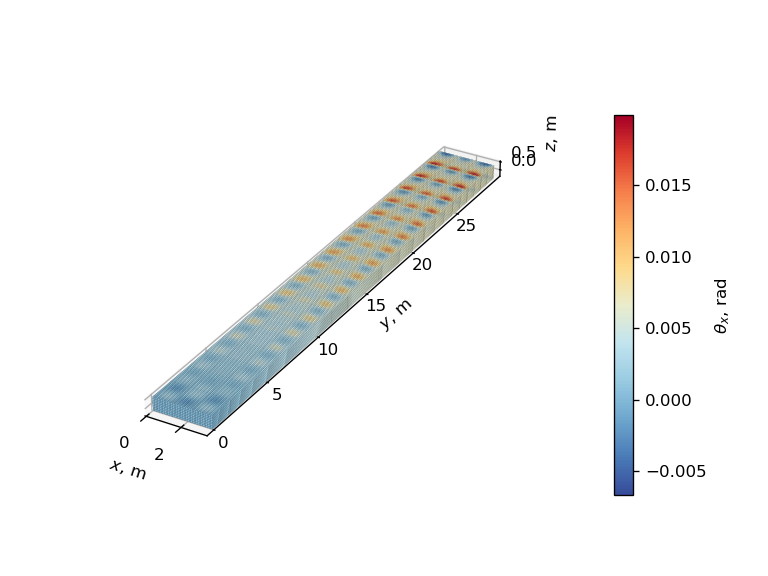

In [33]:
sol_106_op2_dict["initial structure"] = sol_106_op2_dict["original mesh"]  # duplicate results of the original mesh into new ditionary key
for key in ["initial structure", "linearly optimized structure"]:  # loop through the initial and linearly optimized structures
    print(f"Deformation at design load of {key}:")
    design_load_index = np.argmin(np.abs(nondimensional_loads_dict[key] - 1))  # find index of design load
    _, ax, cbar = pynastran_utils.plot_static_deformation(
        op2=sol_106_op2_dict[key], load_step=design_load_index + 1, displacement_component='rx', colormap='sunset', length_unit='m', unit_scale_factor=1e-3)  # plot deformation converting from mm to m
    adjust_3d_plot(ax, cbar)
    plt.show()

### Nonlinear structural stability optimization <a name="non-follower-nonlinear"></a>

Modify maximum number of increments, applied load and name of input file of existing OpenMDAO problem, and run model to record the objective and the constraint functions of the initial design.

In [34]:
# Modify input bdf and run model
non_follower_forces_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = DESIGN_LOAD  # scale load to design load
dmap_stop = non_follower_forces_bdf.executive_control_lines[1].replace("nobuckle", "stop")  # get include string for DMAP stopping the analysis after the first negative eigenvalue is found
non_follower_forces_bdf.executive_control_lines[1] = dmap_stop  # change DMAP command to store eigenvectors
nonlinear_problem.model.nastran_solver.options['input_name'] = "sol_106_non_follower_nonlinear_opt_start"
nonlinear_problem.run_model()

# Store and print results of initial design
mass_0 = nonlinear_problem['nastran_solver.mass'][0]
ks_stability_0 = nonlinear_problem["nastran_solver.ks_stability"][0]
ks_stress_0 = nonlinear_problem["nastran_solver.ks_stress"][0]
print(f"""Initial mass: {mass_0*1e3:.0f} kg
Initial KS value for stability: {ks_stability_0:.1f} N/m
Initial KS value for stress: {ks_stress_0:.0f} MPa""")

Nastran job sol_106_non_follower_nonlinear_opt_start.bdf completed
Wall time: 1428.0 s
Initial mass: 6699 kg
Initial KS value for stability: -7.3 N/m
Initial KS value for stress: -395 MPa


Set initial thickness distribution equal to that of the linearly optimized structure, run optimization and plot convergence history.

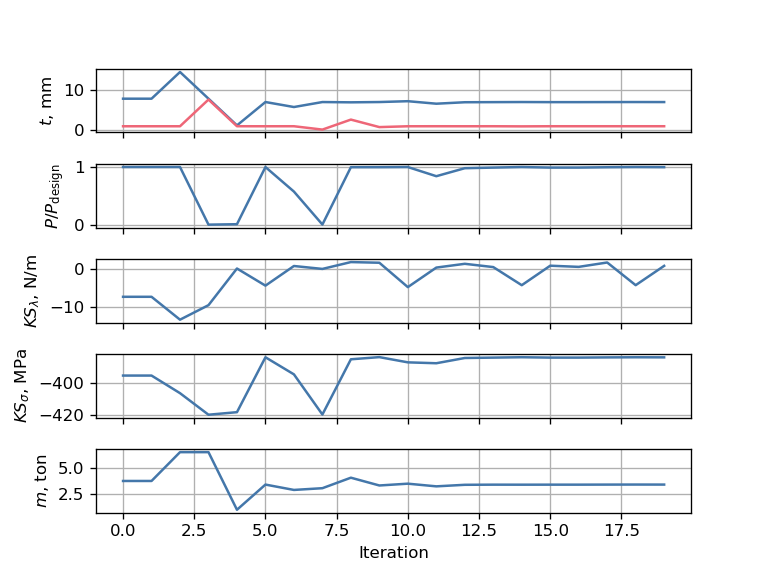

In [35]:
# Set default input values of sol_106 component
nonlinear_problem.model.set_input_defaults('interp.t_cp', histories['interp.t_cp'][-1])
input_name = "sol_106_non_follower_nonlinear_opt"
nonlinear_problem.model.options['input_name'] = input_name

# Choose optimizer
nonlinear_problem.driver = om.ScipyOptimizeDriver()
nonlinear_problem.driver.options['optimizer'] = 'COBYLA'
nonlinear_problem.driver.options['tol'] = 1e-3

# Add design variable, objective and constraints
nonlinear_problem.model.add_design_var('interp.t_cp', lower=thickness_bounds[0], upper=thickness_bounds[1], ref0=thickness_bounds[0], ref=t0)  # scale thickness so that the lower bound is 0 and initial value is 1
nonlinear_problem.model.add_objective('nastran_solver.mass', ref0=mass_0/2, ref=mass_0)  # scale mass so that half of the initial mass is 0 and the initial mass is 1
nonlinear_problem.model.add_constraint('nastran_solver.ks_stability', upper=0., ref=np.abs(ks_stability_0))  # scale KS function for nonlinear structural stability so that the initial value is 1
nonlinear_problem.model.add_constraint('nastran_solver.ks_stress', upper=0., ref=np.abs(ks_stress_0))  # scale KS function for stresses so that the initial value is 1
nonlinear_problem.model.add_constraint('nastran_solver.applied_load', lower=DESIGN_LOAD*.99, ref=DESIGN_LOAD)  # scale applied load so that design

# Add recorder
recorder_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.sql')
recorder = om.SqliteRecorder(recorder_filepath)  # create recorder
nonlinear_problem.driver.add_recorder(recorder)  # attach recorder to the driver

# Run optimization
nonlinear_problem.setup()  # re-setup problem
nonlinear_problem.set_solver_print(0)  # disable solver output
nonlinear_problem.driver.options['debug_print'] = ['desvars','nl_cons','objs']  # print design variables, constraints and objectives
if False:  # set True or False to run optimization or not
    nonlinear_problem.run_driver()  # run optimization
nonlinear_problem.cleanup()  # clean up problem

# Plot optimization history and print results
histories = optimization_utils.plot_optimization_history(recorder_filepath)  # plot optimization history

Find last feasible design and print results.

In [36]:
feasible_design_index = np.where(histories['nastran_solver.ks_stability'][:, 0] <= 0)[0][-1]
mass_percentage_variation = (histories['nastran_solver.mass'][feasible_design_index, 0]/mass_0 - 1)*100
print("Final thicknesses (mm):")
feasible_thickness_array = histories['interp.t_cp'][feasible_design_index, :]
print(feasible_thickness_array)
print(f"""Final KS value of nonlinear structural stability: {histories['nastran_solver.ks_stability'][feasible_design_index, 0]:.2f} N/m
Final KS value for stress: {histories['nastran_solver.ks_stress'][feasible_design_index, 0]:.0f} MPa
Final nondimensional applied load: {histories['nastran_solver.applied_load'][feasible_design_index, 0]:.2f}
Mass variation: {mass_percentage_variation:.1f} %""")

Final thicknesses (mm):
[7.1 1. ]
Final KS value of nonlinear structural stability: -4.25 N/m
Final KS value for stress: -384 MPa
Final nondimensional applied load: 1.00
Mass variation: -49.0 %


Run analysis of last feasible design and plot eigenvalues of tangent stiffness matrix.

Nastran job sol_106_non_follower_nonlinear_opt.bdf completed
Wall time: 4087.0 s


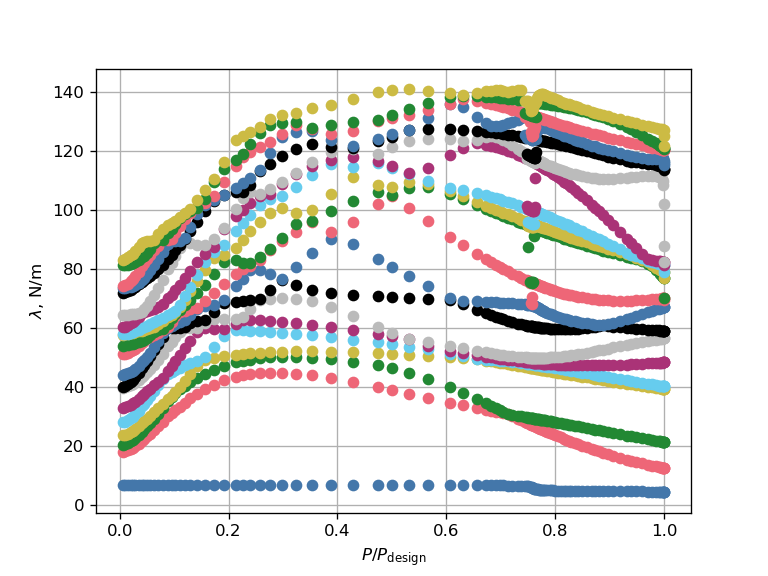

In [37]:
# Run analysis of last feasible design
key = "nonlinearly optimized structure"
nonlinear_problem.set_val('interp.t_cp', feasible_thickness_array)
nonlinear_problem.run_model()
sol_106_op2_dict[key] = nonlinear_problem['nastran_solver.op2']

# Read load and displacement history
_, loads, displacements = pynastran_utils.read_load_displacement_history_from_op2(
    op2=sol_106_op2_dict[key], node_ids=plot_nodes_ids)
nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/DESIGN_LOAD  # nondimensionalize loads

# Read eigenvalues of tangent stiffness matrix
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path to .f06 file
eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)

# Plot eigenvalues vs applied load
_, ax = plt.subplots()
plot_utils.plot_eigenvalue_diagram(ax, nondimensional_loads_dict[key], eigenvalues_dict[key]*1e3)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

Calculate linear buckling load for nonlinearly optimized structure.

Nastran job sol_105_non_follower_nonlinear_opt.bdf completed
Wall time: 41.0 s
P_SOL 105/P_design = 0.72
Critical buckling mode:


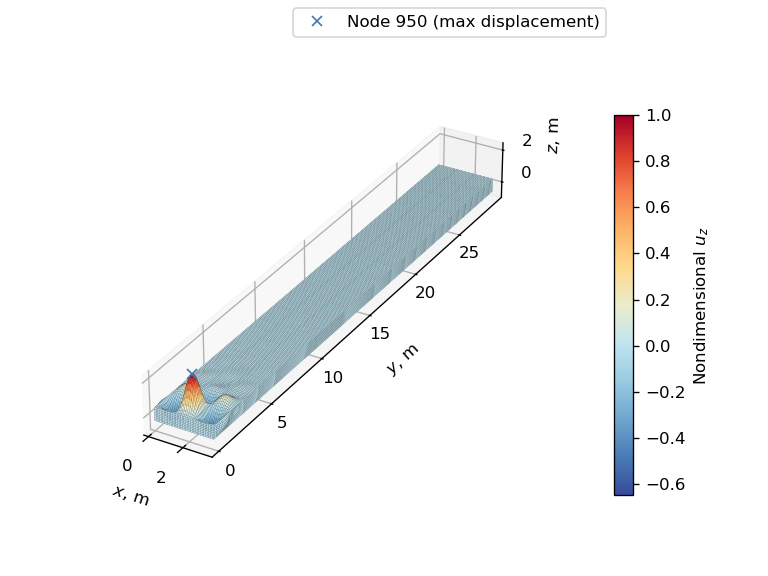

In [38]:
# Modify name of bdf file and input thicknesses and run analysis
linear_problem.model.options['input_name'] = "sol_105_non_follower_nonlinear_opt"
linear_problem.setup()
linear_problem.set_val('interp.t_cp', feasible_thickness_array)
linear_problem.run_model()

# Retrieve OP2 object of nonlinear analysis and print buckling load
sol_105_op2 = linear_problem['nastran_solver.op2']
buckling_load_factor = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].eigrs[0]
print(f"P_SOL 105/P_design = {buckling_load_factor:.2f}")

# Plot buckling mode
print("Critical buckling mode:")
amplification_factor = 2  # amplification factor for displacements
_, ax, cbar = pynastran_utils.plot_buckling_mode(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
    displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to m

# Find node where max displacement occurs
max_displacement_index = np.argmax(np.linalg.norm(sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].data[0, :, 0:3], axis=1))  # find index of max displacement magnitude
max_displacement_node_id = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].node_gridtype[max_displacement_index, 0]

# Plot node where max displacement occurs
max_displacement_node_xyz = sol_105_op2.nodes[max_displacement_node_id].xyz*1e-3 + sol_105_op2.eigenvectors[
    SECOND_SUBCASE_ID].data[0, max_displacement_index, 0:3]*amplification_factor  # add displacement to node position and convert to m
ax.plot(max_displacement_node_xyz[0], max_displacement_node_xyz[1], max_displacement_node_xyz[2], 'x',
        label=f"Node {max_displacement_node_id:d} (max displacement)", zorder=4)
ax.legend()

# Adjust plot and show
adjust_3d_plot(ax, cbar)
plt.show()

Plot load-displacement diagrams for linearly and nonlinearly optimized structure.

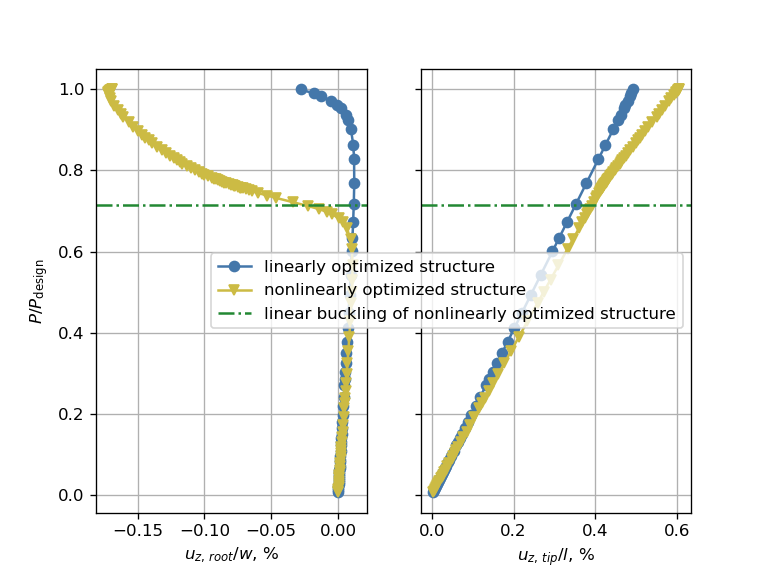

In [39]:
# Nondimensionalize displacements
nondimensional_displacements_dict[key] = {
    "root": displacements[plot_nodes_ids[0]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
    "tip": displacements[plot_nodes_ids[1]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

# Plot load-displacement diagrams of the initial and linearly optimized structures
fig, axes = plt.subplots(1, 2, sharey=True)  # create a figure with two subplots
design_labels = ["linearly optimized structure", "nonlinearly optimized structure"]  # labels for the designs
for ax_index, displacement_key in enumerate(displacement_labels):  # loop through the displacements
    stable_lines = []  # list to store proxy artists for the legend
    for color_index, design_key in enumerate(design_labels):  # loop through the designs
        plot_indices = nondimensional_loads_dict[design_key] <= 1  # limit plot to applied loads less than or equal to design load
        plot_utils.plot_2d_load_displacements_stability(eigenvalues_dict[design_key][:, plot_indices], axes[ax_index],
                                                        nondimensional_displacements_dict[design_key][displacement_key][plot_indices]*100,
                                                        nondimensional_loads_dict[design_key][plot_indices], MARKERS[color_index], COLORS[color_index])  # plot load-displacement curve
        stable_lines.append(Line2D([0], [0], linestyle='-', marker=MARKERS[color_index], color=COLORS[color_index], label=design_key))  # create proxy artist for the legend
    axes[ax_index].axhline(y=buckling_load_factor, color=GLASS_CEILING_COLOR, linestyle='-.')  # plot glass ceiling of linear buckling
    axes[ax_index].set_xlabel(f"$u_{{z,\,{displacement_key}}}/{reference_lengths[ax_index]}$, %")  # set x-axis label
    axes[ax_index].grid(visible=True)

# Add legend, y-axis label, and show plot
glass_ceiling_line = Line2D([0], [0], linestyle='-.', color=GLASS_CEILING_COLOR, label="linear buckling of nonlinearly optimized structure")  # create proxy artist for the legend
axes[1].legend(handles=stable_lines + [glass_ceiling_line])
axes[0].set_ylabel("$P/P_\mathrm{design}$")
plt.show()

Compare deformation at design load of linearly and nonlinearly optimized structures.

Deformation at design load of linearly optimized structure:


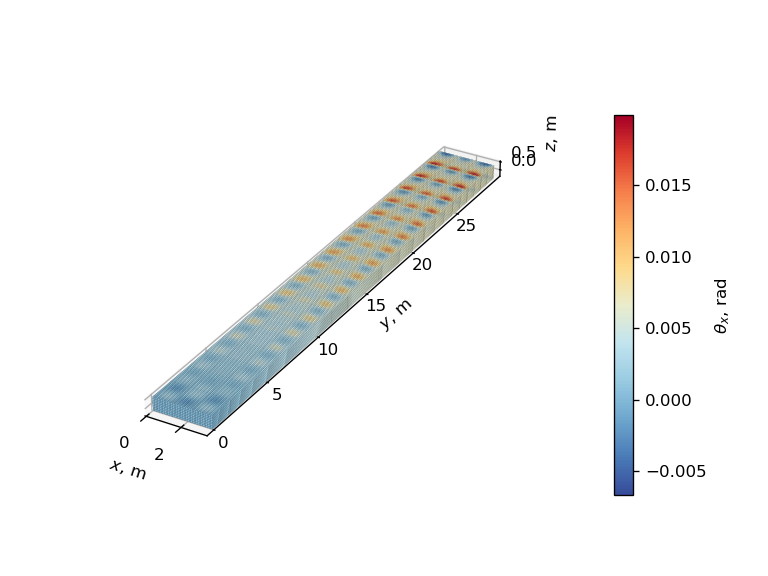

Deformation at design load of nonlinearly optimized structure:


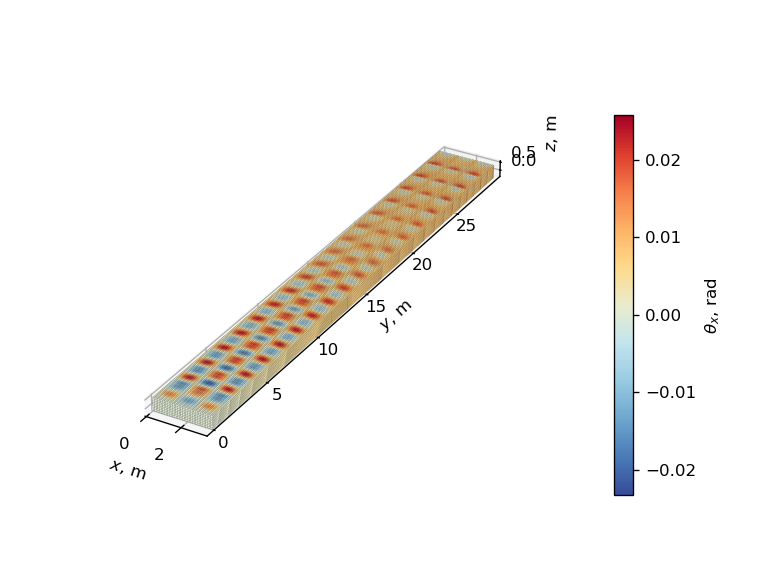

In [40]:
for key in design_labels:  # loop through the linearly and nonlinearly optimized structures
    print(f"Deformation at design load of {key}:")
    design_load_index = np.argmin(np.abs(nondimensional_loads_dict[key] - 1))  # find index of design load
    _, ax, cbar = pynastran_utils.plot_static_deformation(
        op2=sol_106_op2_dict[key], load_step=design_load_index + 1, displacement_component='rx', colormap='sunset', length_unit='m', unit_scale_factor=1e-3)  # plot deformation converting from mm to m
    adjust_3d_plot(ax, cbar)
    plt.show()

## Follower forces <a name="follower"></a>

***

Define function to apply elliptical load with follower forces using `PLOAD2` cards.

In [41]:
def apply_distributed_follower_forces(bdf):
    # Find list of node ids and array of node coordinates
    element_ids = []
    centroids_xyz_list = []
    for eid, element in bdf.elements.items():
        element_ids.append(eid)
        centroids_xyz_list.append(element.Centroid())
    element_ids = np.array(element_ids)  # convert list to array
    centroids_xyz_array = np.vstack(centroids_xyz_list)
    # Find unique y-coordinates within a tolerance of 1e-3 [mm]
    y_coordinates = np.unique(centroids_xyz_array[:, 1].round(decimals=int(np.abs(np.log10(NODE_TOLERANCE)))))
    y_coordinates = y_coordinates[np.all(np.abs(y_coordinates - ribs_y_locations[:, None]) >= NODE_TOLERANCE, axis=0)]  # remove ribs y-coordinates
    # Find the scaling factor that makes the total applied load equal to 1
    f = lambda x: np.sum(x * np.sqrt(1 - (y_coordinates / L)**2)) - 1  # function to be solved to find the correct scaling factor
    scaling_factor_guess = 4 / (np.pi * L)  # initial guess for the solver
    scaling_factor = fsolve(f, scaling_factor_guess)[0]  # find the root of the function to find the scaling factor
    # Apply distributed load over top and bottom skin
    for y in y_coordinates:  # loop over all y-coordinates
        top_skin_ids = element_ids[(np.abs(centroids_xyz_array[:, 1] - y) < NODE_TOLERANCE) & (np.abs(centroids_xyz_array[:, 2] - h/2) < NODE_TOLERANCE)]  # find id of elements with centroid at y = y and z = h/2 (top skin elements at current y-coordinate)
        local_force_magnitude = scaling_factor/2 * np.sqrt(1 - (y / L)**2)  # compute force magnitude at current y-coordinate (scaling factor is divided by 2 because the force is applied over both top and bottom skin)
        pynastran_utils.add_uniform_pressure(
            bdf=bdf, elements_ids=top_skin_ids, set_id=FORCE_SET_ID, force_magnitude=local_force_magnitude)  # apply pressure over top skin elements at current y-coordinate
        bottom_skin_ids = element_ids[(np.abs(centroids_xyz_array[:, 1] - y) < NODE_TOLERANCE) & (np.abs(centroids_xyz_array[:, 2] + h/2) < NODE_TOLERANCE)]  # find id of elements with centroid at y = y and z = -h/2 (bottom skin elements at current y-coordinate)
        pynastran_utils.add_uniform_pressure(
            bdf=bdf, elements_ids=bottom_skin_ids, set_id=FORCE_SET_ID, force_magnitude=-local_force_magnitude)  # apply pressure over bottom skin elements at current y-coordinate

Set up linear problem with OpenMDAO and calculate linear buckling load of initial structure (constant thickness).

In [42]:
# Apply distributed follower forces and define property patches
follower_forces_bdf = original_mesh_bdf.__deepcopy__({})
apply_distributed_follower_forces(follower_forces_bdf)  # apply distributed follower load
follower_forces_bdf.add_load(sid=LOAD_SET_ID, scale=1., scale_factors=[DESIGN_LOAD], load_ids=[FORCE_SET_ID])  # add LOAD card
box_beam_utils.define_property_patches(
    bdf=follower_forces_bdf, ribs_y_locations=ribs_y_locations, stiffeners_x_locations=stiffeners_x_locations)  # define property patches

# Set up linear buckling problem with OpenMDAO
sol_105_follower_forces_bdf = follower_forces_bdf.__deepcopy__({})
sol_105_follower_forces_bdf.case_control_deck.subcases[0].add_result_type('STRESS', 'ALL', ['PLOT'])  # store stress results of all elements in the op2 file
input_name = "sol_105_follower_linear_opt_start"
sol_105_group = optimization_utils.NastranGroup(bdf=sol_105_follower_forces_bdf, sigma_y=SIGMA_Y,
                                                analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name,
                                                run_flag=False)  # create NastranGroup object
pynastran_utils.set_up_sol_105(
    bdf=sol_105_follower_forces_bdf, static_load_set_id=LOAD_SET_ID, no_eigenvalues=NO_EIGENVALUES)  # set up SOL 105
sol_105_group.add_subsystem('interp', interp_comp)  # add spline component to the group
sol_105_group.connect('interp.t_val', 'nastran_solver.t_val')  # connect spline component output to the SOL 105 component input
linear_problem = om.Problem(model=sol_105_group, name="sol_105_follower")
linear_problem.setup()

# Set initial thickness distribution and analysis
linear_problem.set_val('interp.t_cp', initial_thickness_vector)
linear_problem.run_model()

Nastran job sol_105_follower_linear_opt_start.bdf completed
Wall time: 27.0 s


Print critical buckling load and plot corresponding buckling mode.

P_SOL 105/P_design = 1.00


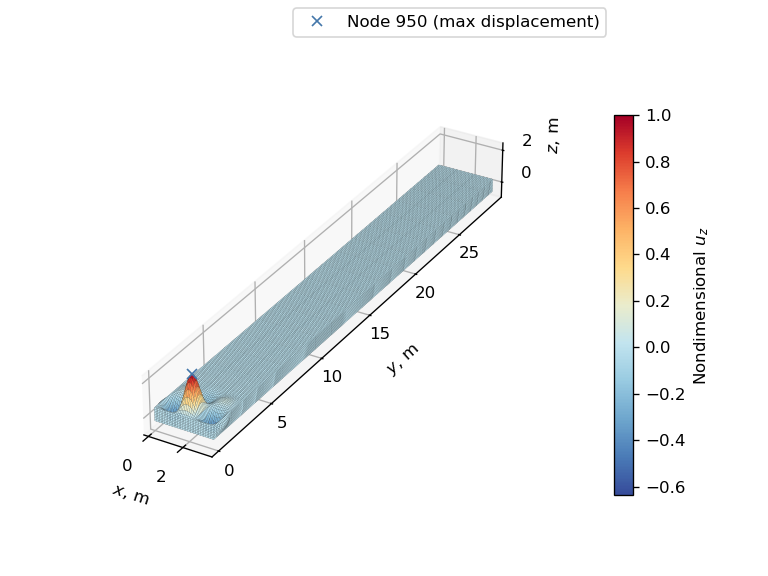

In [43]:
# Retrieve OP2 object of nonlinear analysis and print buckling load
sol_105_op2 = linear_problem['nastran_solver.op2']
buckling_load_factor = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].eigrs[0]
print(f"P_SOL 105/P_design = {buckling_load_factor:.2f}")

# Find node where max displacement occurs
max_displacement_index = np.argmax(np.linalg.norm(sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].data[0, :, 0:3], axis=1))  # find index of max displacement magnitude
key = "initial structure"
max_displacement_node_id = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].node_gridtype[max_displacement_index, 0]

# Plot buckling mode
amplification_factor = 2  # amplification factor for displacements
_, ax, cbar = pynastran_utils.plot_buckling_mode(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
    displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to m

# Plot node
max_displacement_node_xyz = sol_105_op2.nodes[max_displacement_node_id].xyz*1e-3 + sol_105_op2.eigenvectors[
    SECOND_SUBCASE_ID].data[0, max_displacement_index, 0:3]*amplification_factor  # add displacement to node position and convert to m
ax.plot(max_displacement_node_xyz[0], max_displacement_node_xyz[1], max_displacement_node_xyz[2], 'x',
        label=f"Node {max_displacement_node_id:d} (max displacement)", zorder=4)
ax.legend()

# Adjust plot and show
adjust_3d_plot(ax, cbar)
plt.show()

Set up nonlinear problem with OpenMDAO and run nonlinear analysis of initial structure.

In [44]:
# Request nonlinear stress output in place of linear stresses
follower_forces_bdf.case_control_deck.subcases[0].add_result_type('NLSTRESS', 'ALL', ['PLOT'])  # store nonlinear stress results of all elements in the op2 file

# Set up parameters for arc-length method
pynastran_utils.set_up_arc_length_method(
    bdf=follower_forces_bdf, max_iter=3, conv='PU', eps_u=1e-5, eps_p=1e-6, max_bisect=20, minalr=1e-5, desiter=4,
    maxinc=300)

# Apply twice the design load and create static load subcase
follower_forces_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = 2*DESIGN_LOAD  # scale load to twice the design load
pynastran_utils.create_static_load_subcase(
    bdf=follower_forces_bdf, subcase_id=FIRST_SUBCASE_ID, load_set_id=LOAD_SET_ID)

# Set up parameters for the calculation of the eigenvalues of the tangent stiffness matrix
pynastran_utils.set_up_sol_106_with_kllrh_eigenvalues(
    bdf=follower_forces_bdf, analysis_directory_path=ANALYSIS_DIRECTORY_PATH, method_set_id=METHOD_SET_ID,
    no_eigenvalues=NO_EIGENVALUES, upper_eig=UPPER_EIGENVALUE)

# Create OpenMDAO Problem and run nonlinear analysis
input_name = "sol_106_follower_linear_opt_start"
sol_106_group = optimization_utils.NastranGroup(bdf=follower_forces_bdf, sigma_y=SIGMA_Y,
                                                analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name,
                                                run_flag=False)  # create NastranGroup object
sol_106_group.add_subsystem('interp', interp_comp)  # add spline component to the group
sol_106_group.connect('interp.t_val', 'nastran_solver.t_val')  # connect spline component output to the SOL 105 component input
nonlinear_problem = om.Problem(model=sol_106_group, name="sol_106_follower")
nonlinear_problem.setup()
nonlinear_problem.set_val('interp.t_cp', initial_thickness_vector)
nonlinear_problem.run_model()

Nastran job sol_106_follower_linear_opt_start.bdf completed
Wall time: 9325.0 s


Plot eigenvalues of tangent stiffness matrix.

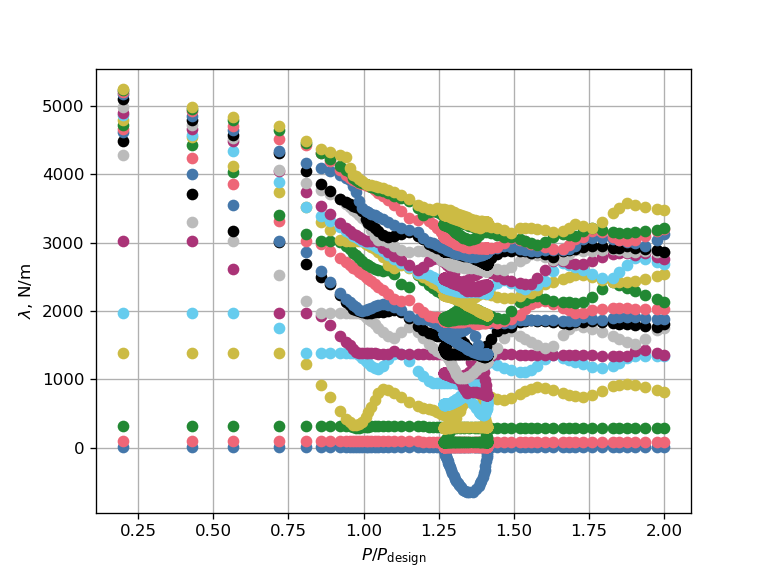

Nondimensional applied load at first limit point: 1.41


In [45]:
# Retrieve OP2 object of nonlinear analysis
key = "initial structure"
sol_106_op2_dict[key] = nonlinear_problem['nastran_solver.op2']

# Read load and displacement history of benchmark analysis from op2 file
_, loads, displacements = pynastran_utils.read_load_displacement_history_from_op2(
    op2=sol_106_op2_dict[key], node_ids=plot_nodes_ids)
nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/DESIGN_LOAD  # nondimensionalize loads

# Read eigenvalues of tangent stiffness matrix
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path to .f06 file
eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)

# Plot eigenvalues vs applied load
_, ax = plt.subplots()
plot_utils.plot_eigenvalue_diagram(ax, nondimensional_loads_dict[key], eigenvalues_dict[key]*1e3)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

# Print nondimensional applied load at limit point and percentage difference of original mesh w.r.t. refined mesh
nondimensional_limit_point_load = nondimensional_loads_dict[key][np.where(eigenvalues_dict[key][0] < 0)[0][0]]
print(f"Nondimensional applied load at first limit point: {nondimensional_limit_point_load:.2f}")

Plot 3D load-displacement diagram.

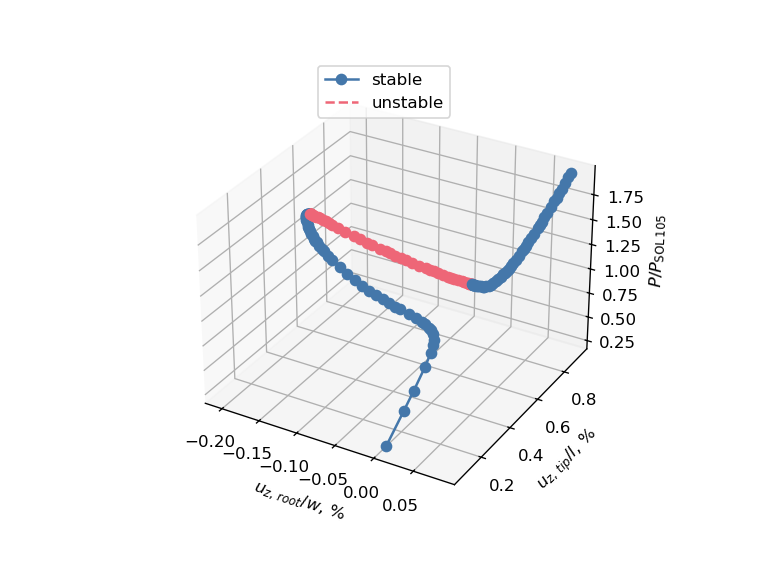

In [46]:
# Nondimensionalize displacements
nondimensional_displacements_dict[key] = {
    "root": displacements[plot_nodes_ids[0]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
    "tip": displacements[plot_nodes_ids[1]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

# Plot 3D load-displacement diagram
fig = plt.figure()  # create a figure
ax_3d = plt.axes(projection="3d")  # create 3D axes
plot_utils.plot_3d_load_displacements_stability(eigenvalues=eigenvalues_dict[key], axes=ax_3d,
                                                displacements1=nondimensional_displacements_dict[key]["root"]*100,
                                                displacements2=nondimensional_displacements_dict[key]["tip"]*100,
                                                loads=nondimensional_loads_dict[key],
                                                marker=MARKERS[0], color=COLORS[0])

# Add legend, axes labels and grid
stable_line = Line2D([0], [0], linestyle='-', marker=MARKERS[0], color=COLORS[0], label="stable")  # create proxy artist for the legend
fig.legend(handles=[stable_line, unstable_line], loc="upper center", bbox_to_anchor=(0.5, 0.9))
ax_3d.set_xlabel("$u_{z,\,root}/w$, %")
ax_3d.set_ylabel("$u_{z,\,tip}/l$, %")
ax_3d.set_zlabel("$P/P_\mathrm{SOL\/105}$")
ax_3d.grid(visible=True)
plt.show()

### Linear buckling optimization <a name="follower-linear"></a>

Record objective and constraint functions of initial design.

In [47]:
mass_0 = linear_problem['nastran_solver.mass'][0]
ks_buckling_0 = linear_problem['nastran_solver.ks_buckling'][0]
ks_stress_0 = linear_problem['nastran_solver.ks_stress'][0]
print(f"""Initial mass: {mass_0*1e3:.0f} kg
Initial thickness vector [mm]:""")
print(initial_thickness_vector)
print(f"""Initial KS value for buckling load factor: {ks_buckling_0:.2f}
Initial KS value for stress: {ks_stress_0:.0f} MPa""")

Initial mass: 6519 kg
Initial thickness vector [mm]:
[7.7 7.7]
Initial KS value for buckling load factor: 0.00
Initial KS value for stress: -395 MPa


Run optimization and plot optimization history.

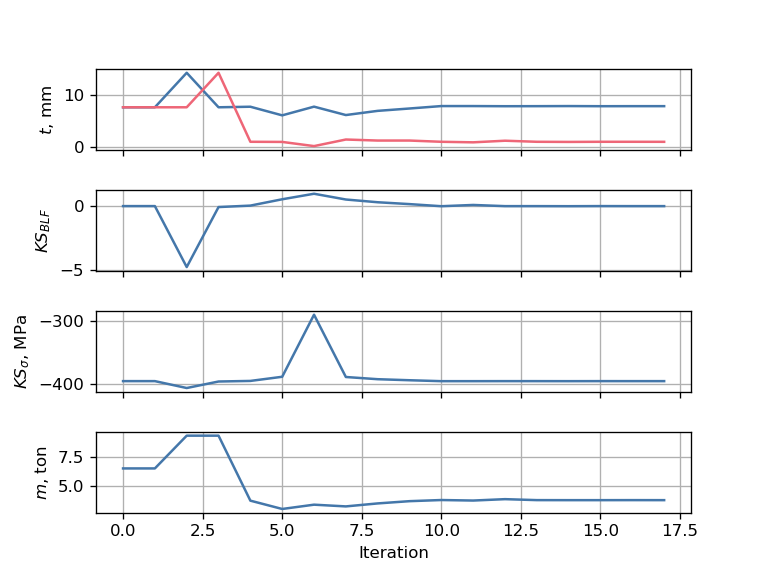

Final mass: 3773 kg
Mass variation: -42.13 %
Final thickness vector [mm]:
[7.9 1. ]
Final KS value of buckling load factor: 0.00
Final KS value for stress: -395.39 MPa


In [48]:
# Set default initial thickness vector and name of input file
linear_problem.model.set_input_defaults('interp.t_cp', initial_thickness_vector)
input_name = "sol_105_follower_linear_opt"  # default name of input file
linear_problem.model.options['input_name'] = input_name

# Choose optimizer
linear_problem.driver = om.ScipyOptimizeDriver()
linear_problem.driver.options['optimizer'] = 'COBYLA'
linear_problem.driver.options['tol'] = 1e-3

# Add design variable, objective and constraints
thickness_bounds = [1., 20.]  # [mm]
linear_problem.model.add_design_var('interp.t_cp', lower=thickness_bounds[0], upper=thickness_bounds[1], ref0=thickness_bounds[0], ref=t0)  # scale thickness so that the lower bound is 0 and initial value is 1
linear_problem.model.add_objective('nastran_solver.mass', ref0=mass_0/2, ref=mass_0)  # scale mass so that half of the initial mass is 0 and the initial mass is 1
linear_problem.model.add_constraint('nastran_solver.ks_buckling', upper=0.)  # KS function for buckling load factor is not scaled because buckling load factor is already a ratio
linear_problem.model.add_constraint('nastran_solver.ks_stress', upper=0., ref=np.abs(ks_stress_0))  # scale KS function for stresses so that the initial value is 1

# Add recorder to the driver
recorder_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.sql')
recorder = om.SqliteRecorder(recorder_filepath)  # create recorder
linear_problem.driver.add_recorder(recorder)  # attach recorder to the driver

# Run optimization
linear_problem.setup()  # re-setup problem before running optimization
linear_problem.set_solver_print(0)  # disable solver output
linear_problem.driver.options['debug_print'] = ['desvars','nl_cons','objs']  # print design variables, constraints and objectives
if False:  # set True or False to run optimization or not
    linear_problem.run_driver()  # run optimization
linear_problem.cleanup()  # clean up problem

# Plot optimization history and print results
histories = optimization_utils.plot_optimization_history(recorder_filepath)  # plot optimization history
mass_percentage_variation = (histories['nastran_solver.mass'][-1, 0]/mass_0 - 1)*100
print(f"""Final mass: {histories['nastran_solver.mass'][-1, 0]*1e3:.0f} kg
Mass variation: {mass_percentage_variation:.2f} %
Final thickness vector [mm]:""")
print(histories['interp.t_cp'][-1])
print(f"""Final KS value of buckling load factor: {histories['nastran_solver.ks_buckling'][-1, 0]:.2f}
Final KS value for stress: {histories['nastran_solver.ks_stress'][-1, 0]:.2f} MPa""")

Plot critical buckling mode of optimized structure.

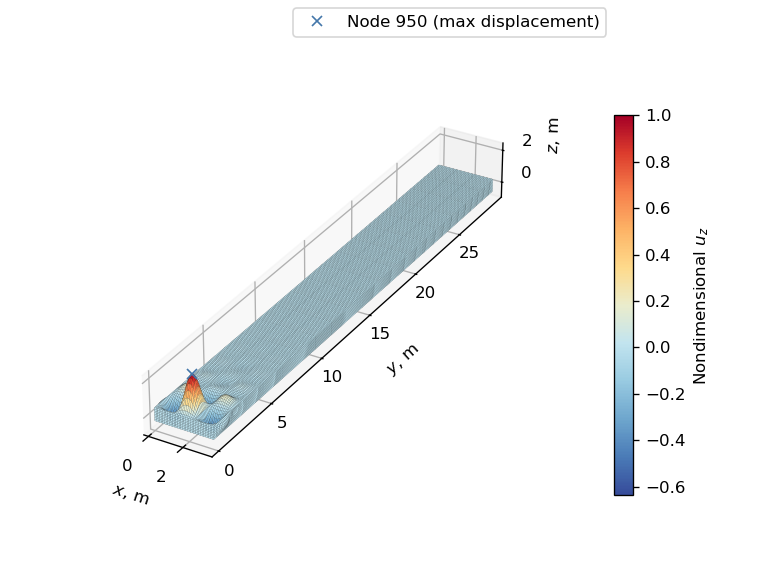

In [49]:
# Read op2 file of linear buckling analysis
sol_105_op2_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.op2')
sol_105_op2 = read_op2(op2_filename=sol_105_op2_filepath, load_geometry=True, debug=None)

# Plot buckling mode
amplification_factor = 2  # amplification factor for displacements
_, ax, cbar = pynastran_utils.plot_buckling_mode(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
    displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to m

# Find node where max displacement occurs
max_displacement_index = np.argmax(np.linalg.norm(sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].data[0, :, 0:3], axis=1))  # find index of max displacement magnitude
max_displacement_node_id = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].node_gridtype[max_displacement_index, 0]

# Plot node where max displacement occurs
max_displacement_node_xyz = sol_105_op2.nodes[max_displacement_node_id].xyz*1e-3 + sol_105_op2.eigenvectors[
    SECOND_SUBCASE_ID].data[0, max_displacement_index, 0:3]*amplification_factor  # add displacement to node position and convert to m
ax.plot(max_displacement_node_xyz[0], max_displacement_node_xyz[1], max_displacement_node_xyz[2], 'x',
        label=f"Node {max_displacement_node_id:d} (max displacement)", zorder=4)
ax.legend()

# Adjust plot and show
adjust_3d_plot(ax, cbar)
plt.show()

#### Nonlinear analysis of linearly optimized structure

Run nonlinear analysis of linearly optimized structure.

In [50]:
input_name = "sol_106_follower_linear_opt"
nonlinear_problem.model.options['input_name'] = input_name
nonlinear_problem.setup()
nonlinear_problem.set_val('interp.t_cp', histories['interp.t_cp'][-1])
nonlinear_problem.run_model()

Nastran job sol_106_follower_linear_opt.bdf completed
Wall time: 11548.0 s


Plot eigenvalues of tangent stiffness matrix.

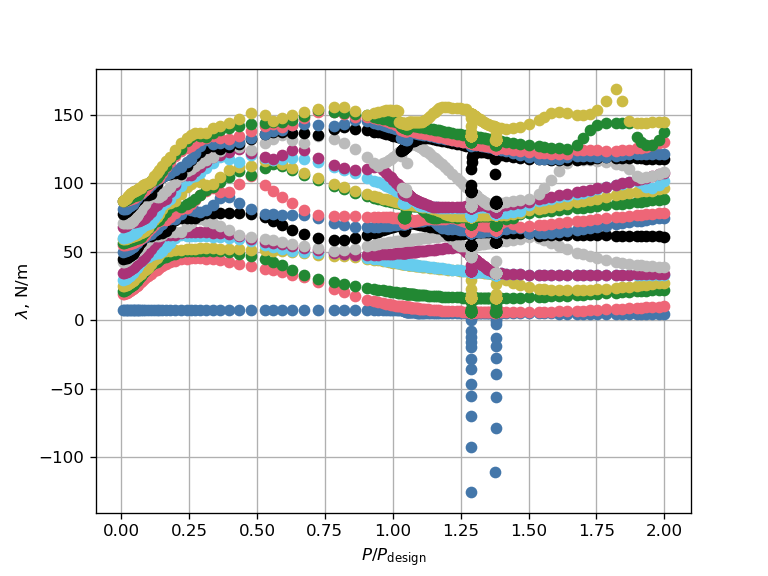

Nondimensional applied load at first limit point: 1.38


In [51]:
# Retrieve OP2 object of nonlinear analysis
key = "linearly optimized structure"
sol_106_op2_dict[key] = nonlinear_problem['nastran_solver.op2']

# Read load and displacement history of benchmark analysis from op2 file
plot_nodes_ids = [root_node_id_dict["original mesh"], tip_node_id_dict["original mesh"]]  # list of node ids to plot for model with curved skins
_, loads, displacements = pynastran_utils.read_load_displacement_history_from_op2(
    op2=sol_106_op2_dict[key], node_ids=plot_nodes_ids)
nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/DESIGN_LOAD  # nondimensionalize loads

# Read eigenvalues of tangent stiffness matrix
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path to .f06 file
eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)

# Plot eigenvalues vs applied load
_, ax = plt.subplots()
plot_utils.plot_eigenvalue_diagram(ax, nondimensional_loads_dict[key], eigenvalues_dict[key]*1e3)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

# Print nondimensional applied load at limit point and percentage difference of original mesh w.r.t. refined mesh
nondimensional_limit_point_load = nondimensional_loads_dict[key][np.where(eigenvalues_dict[key][0] < 0)[0][0]]
print(f"Nondimensional applied load at first limit point: {nondimensional_limit_point_load:.2f}")

Plot load-displacement diagrams for initial and linearly optimized structure.

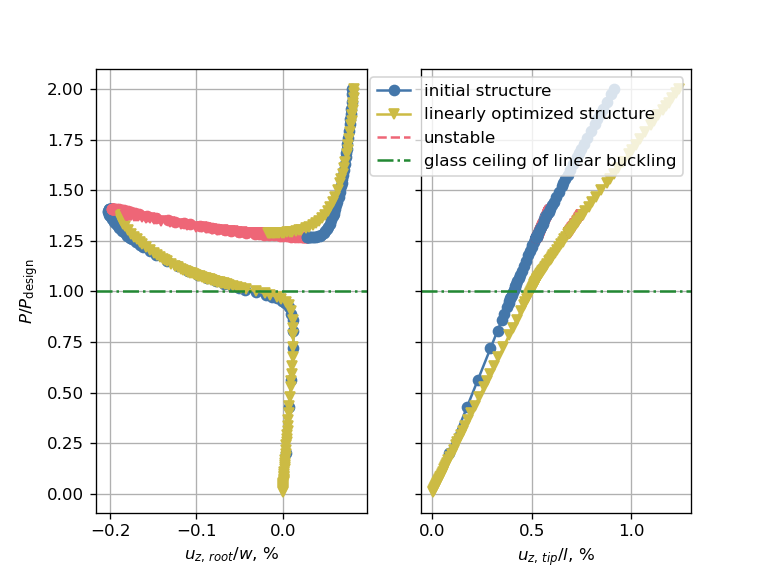

In [52]:
# Nondimensionalize displacements of the linearly optimized structure
nondimensional_displacements_dict[key] = {
    "root": displacements[plot_nodes_ids[0]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
    "tip": displacements[plot_nodes_ids[1]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

# Plot load-displacement diagrams of the initial and linearly optimized structures
fig, axes = plt.subplots(1, 2, sharey=True)  # create a figure with two subplots
design_labels = ["initial structure", "linearly optimized structure"]  # labels for the designs
for ax_index, displacement_key in enumerate(displacement_labels):  # loop through the displacements
    stable_lines = []  # list to store proxy artists for the legend
    for color_index, design_key in enumerate(design_labels):  # loop through the designs
        plot_utils.plot_2d_load_displacements_stability(eigenvalues_dict[design_key], axes[ax_index],
                                                        nondimensional_displacements_dict[design_key][displacement_key]*100,
                                                        nondimensional_loads_dict[design_key], MARKERS[color_index], COLORS[color_index])  # plot load-displacement curve
        stable_lines.append(Line2D([0], [0], linestyle='-', marker=MARKERS[color_index], color=COLORS[color_index], label=design_key))  # create proxy artist for the legend
    axes[ax_index].axhline(y=1, color=GLASS_CEILING_COLOR, linestyle='-.')  # plot glass ceiling of linear buckling
    axes[ax_index].set_xlabel(f"$u_{{z,\,{displacement_key}}}/{reference_lengths[ax_index]}$, %")  # set x-axis label
    axes[ax_index].grid(visible=True)

# Add legend, y-axis label, and show plot
glass_ceiling_line = Line2D([0], [0], linestyle='-.', color=GLASS_CEILING_COLOR, label="glass ceiling of linear buckling")  # create proxy artist for the legend
axes[1].legend(handles=stable_lines + [unstable_line, glass_ceiling_line])
axes[0].set_ylabel("$P/P_\mathrm{design}$")
plt.show()

Compare deformation at design load

Deformation at design load of initial structure:


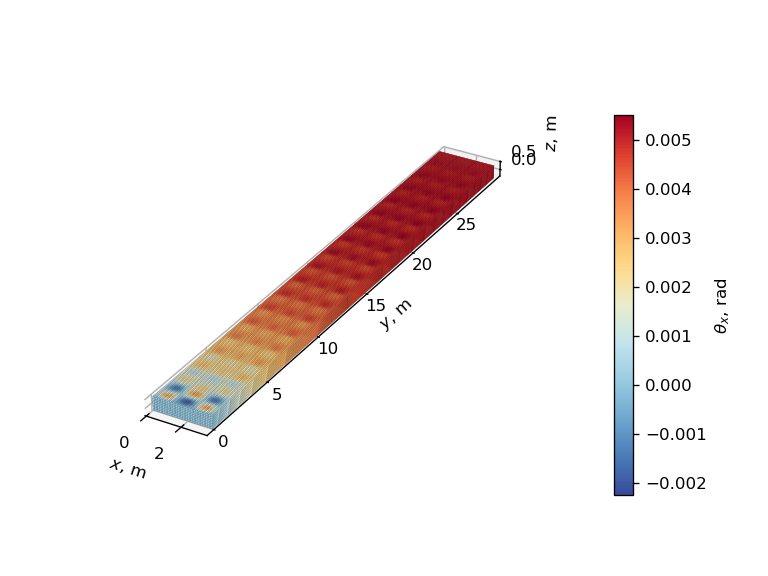

Deformation at design load of linearly optimized structure:


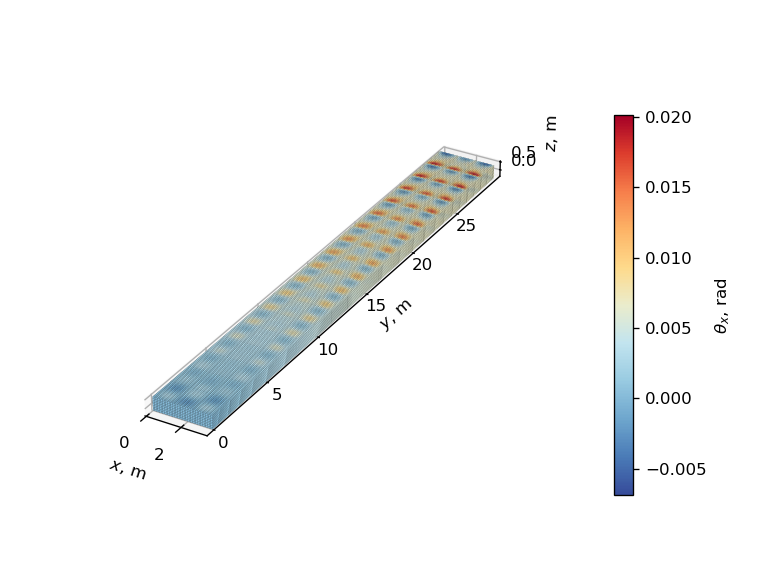

In [53]:
for key in design_labels:  # loop through the linearly and nonlinearly optimized structures
    print(f"Deformation at design load of {key}:")
    design_load_index = np.argmin(np.abs(nondimensional_loads_dict[key] - 1))  # find index of design load
    _, ax, cbar = pynastran_utils.plot_static_deformation(
        op2=sol_106_op2_dict[key], load_step=design_load_index + 1, displacement_component='rx', colormap='sunset', length_unit='m', unit_scale_factor=1e-3)  # plot deformation converting from mm to m
    adjust_3d_plot(ax, cbar)
    plt.show()

### Nonlinear structural stability optimization <a name="follower-nonlinear"></a>

Record objective and constraint functions of initial design.

In [54]:
# Modify input bdf and run model
follower_forces_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = DESIGN_LOAD  # scale load to design load
dmap_stop = follower_forces_bdf.executive_control_lines[1].replace("nobuckle", "stop")  # get include string for DMAP stopping the analysis after the first negative eigenvalue is found
follower_forces_bdf.executive_control_lines[1] = dmap_stop  # change DMAP command to store eigenvectors
nonlinear_problem.model.nastran_solver.options['input_name'] = "sol_106_follower_nonlinear_opt_start"
nonlinear_problem.run_model()

# Store and print results of initial design
mass_0 = nonlinear_problem['nastran_solver.mass'][0]
ks_stability_0 = nonlinear_problem["nastran_solver.ks_stability"][0]
ks_stress_0 = nonlinear_problem["nastran_solver.ks_stress"][0]
print(f"""Initial mass: {mass_0*1e3:.0f} kg
Initial KS value for stability: {ks_stability_0:.1f} N/m
Initial KS value for stress: {ks_stress_0:.0f} MPa""")

Nastran job sol_106_follower_nonlinear_opt_start.bdf completed
Wall time: 1568.0 s
Initial mass: 3761 kg
Initial KS value for stability: -7.3 N/m
Initial KS value for stress: -395 MPa


Run optimization and plot optimization history.

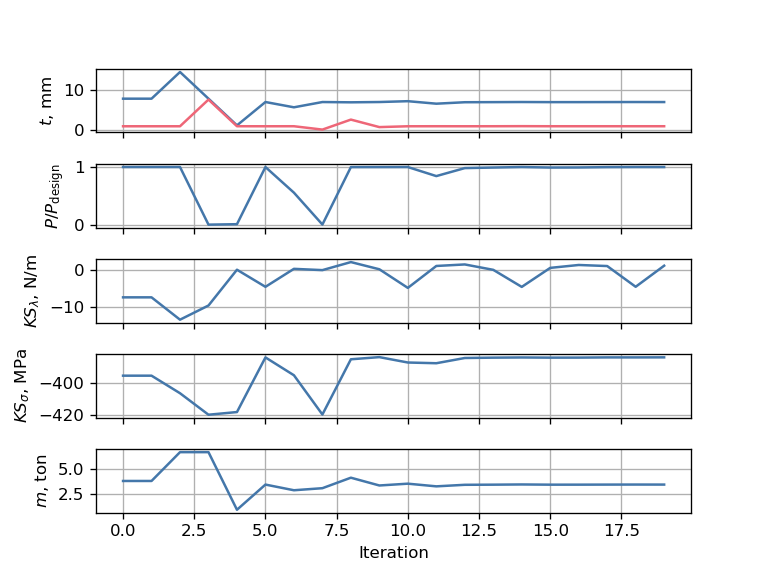

In [55]:
# Set default input values of sol_106 component
nonlinear_problem.model.set_input_defaults('interp.t_cp', histories['interp.t_cp'][-1])
input_name = "sol_106_follower_nonlinear_opt"
nonlinear_problem.model.options['input_name'] = input_name

# Choose optimizer
nonlinear_problem.driver = om.ScipyOptimizeDriver()
nonlinear_problem.driver.options['optimizer'] = 'COBYLA'
nonlinear_problem.driver.options['tol'] = 1e-3

# Add design variable, objective and constraints
nonlinear_problem.model.add_design_var('interp.t_cp', lower=thickness_bounds[0], upper=thickness_bounds[1], ref0=thickness_bounds[0], ref=t0)  # scale thickness so that the lower bound is 0 and initial value is 1
nonlinear_problem.model.add_objective('nastran_solver.mass', ref0=mass_0/2, ref=mass_0)  # scale mass so that half of the initial mass is 0 and the initial mass is 1
nonlinear_problem.model.add_constraint('nastran_solver.ks_stability', upper=0., ref=np.abs(ks_stability_0))  # scale KS function for nonlinear structural stability so that the initial value is 1
nonlinear_problem.model.add_constraint('nastran_solver.ks_stress', upper=0., ref=np.abs(ks_stress_0))  # scale KS function for stresses so that the initial value is 1
nonlinear_problem.model.add_constraint('nastran_solver.applied_load', lower=DESIGN_LOAD*.99, ref=DESIGN_LOAD)  # scale applied load so that design

# Add recorder
recorder_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.sql')
recorder = om.SqliteRecorder(recorder_filepath)  # create recorder
nonlinear_problem.driver.add_recorder(recorder)  # attach recorder to the driver

# Run optimization
nonlinear_problem.setup()  # re-setup problem
nonlinear_problem.set_solver_print(0)  # disable solver output
nonlinear_problem.driver.options['debug_print'] = ['desvars','nl_cons','objs']  # print design variables, constraints and objectives
if False:  # set True or False to run optimization or not
    nonlinear_problem.run_driver()  # run optimization
nonlinear_problem.cleanup()  # clean up problem

# Plot optimization history
histories = optimization_utils.plot_optimization_history(recorder_filepath)

Find last feasible design and print results.

In [56]:
feasible_design_index = np.where(histories['nastran_solver.ks_stability'][:, 0] <= 0)[0][-1]
mass_percentage_variation = (histories['nastran_solver.mass'][feasible_design_index, 0]/mass_0 - 1)*100
feasible_thickness_array = histories['interp.t_cp'][feasible_design_index, :]
print("Final thicknesses (mm):")
print(feasible_thickness_array)
print(f"""Final KS value of nonlinear structural stability: {histories['nastran_solver.ks_stability'][feasible_design_index, 0]:.2f} N/m
Final KS value for stress: {histories['nastran_solver.ks_stress'][feasible_design_index, 0]:.0f} MPa
Final nondimensional applied load: {histories['nastran_solver.applied_load'][feasible_design_index, 0]:.2f}
Mass variation: {mass_percentage_variation:.1f} %""")

Final thicknesses (mm):
[7.1 1. ]
Final KS value of nonlinear structural stability: -4.46 N/m
Final KS value for stress: -384 MPa
Final nondimensional applied load: 1.00
Mass variation: -9.1 %


Plot eigenvalues of tangent stiffness matrix.

Nastran job sol_106_follower_nonlinear_opt.bdf completed
Wall time: 3473.0 s


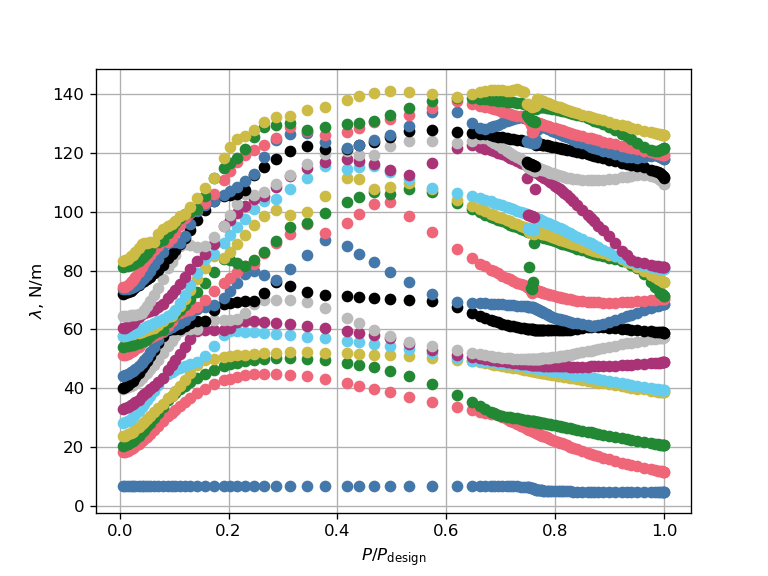

In [57]:
# Run analysis of last feasible design
key = "nonlinearly optimized structure"
nonlinear_problem.set_val('interp.t_cp', feasible_thickness_array)
nonlinear_problem.run_model()
sol_106_op2_dict[key] = nonlinear_problem['nastran_solver.op2']

# Read load and displacement history
_, loads, displacements = pynastran_utils.read_load_displacement_history_from_op2(
    op2=sol_106_op2_dict[key], node_ids=plot_nodes_ids)
nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/DESIGN_LOAD  # nondimensionalize loads

# Read eigenvalues of tangent stiffness matrix
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path to .f06 file
eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)

# Plot eigenvalues vs applied load
_, ax = plt.subplots()
plot_utils.plot_eigenvalue_diagram(ax, nondimensional_loads_dict[key], eigenvalues_dict[key]*1e3)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

Run linear buckling analysis of nonlinearly optimized structure.

Nastran job sol_105_follower_nonlinear_opt.bdf completed
Wall time: 31.0 s
P_SOL 105/P_design = 0.72
Critical buckling mode:


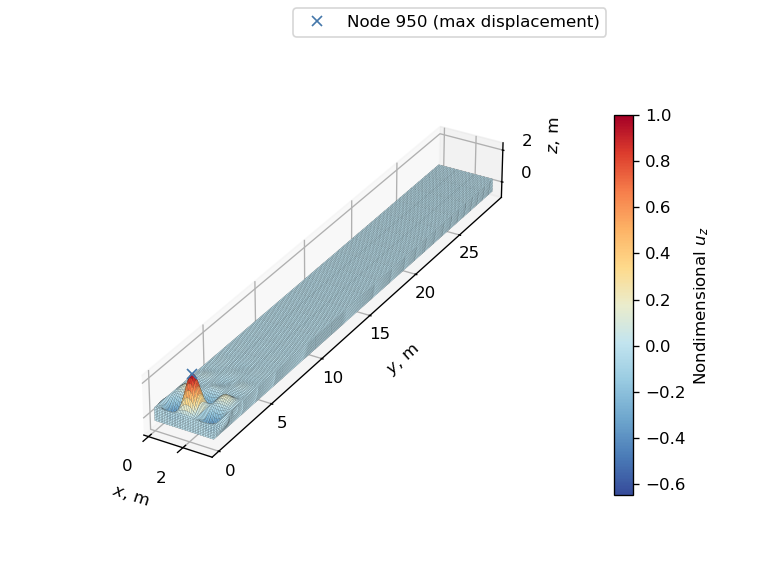

In [58]:
# Modify name of bdf file and input thicknesses and run analysis
linear_problem.model.options['input_name'] = "sol_105_follower_nonlinear_opt"
linear_problem.setup()
linear_problem.set_val('interp.t_cp', feasible_thickness_array)
linear_problem.run_model()

# Retrieve OP2 object of nonlinear analysis and print buckling load
sol_105_op2 = linear_problem['nastran_solver.op2']
buckling_load_factor = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].eigrs[0]
print(f"P_SOL 105/P_design = {buckling_load_factor:.2f}")

# Plot buckling mode
print("Critical buckling mode:")
amplification_factor = 2  # amplification factor for displacements
_, ax, cbar = pynastran_utils.plot_buckling_mode(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
    displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to m

# Find node where max displacement occurs
max_displacement_index = np.argmax(np.linalg.norm(sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].data[0, :, 0:3], axis=1))  # find index of max displacement magnitude
max_displacement_node_id = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].node_gridtype[max_displacement_index, 0]

# Plot node where max displacement occurs
max_displacement_node_xyz = sol_105_op2.nodes[max_displacement_node_id].xyz*1e-3 + sol_105_op2.eigenvectors[
    SECOND_SUBCASE_ID].data[0, max_displacement_index, 0:3]*amplification_factor  # add displacement to node position and convert to m
ax.plot(max_displacement_node_xyz[0], max_displacement_node_xyz[1], max_displacement_node_xyz[2], 'x',
        label=f"Node {max_displacement_node_id:d} (max displacement)", zorder=4)
ax.legend()

# Adjust plot and show
adjust_3d_plot(ax, cbar)
plt.show()

Plot load-displacement diagrams for linearly and nonlinearly optimized structure.

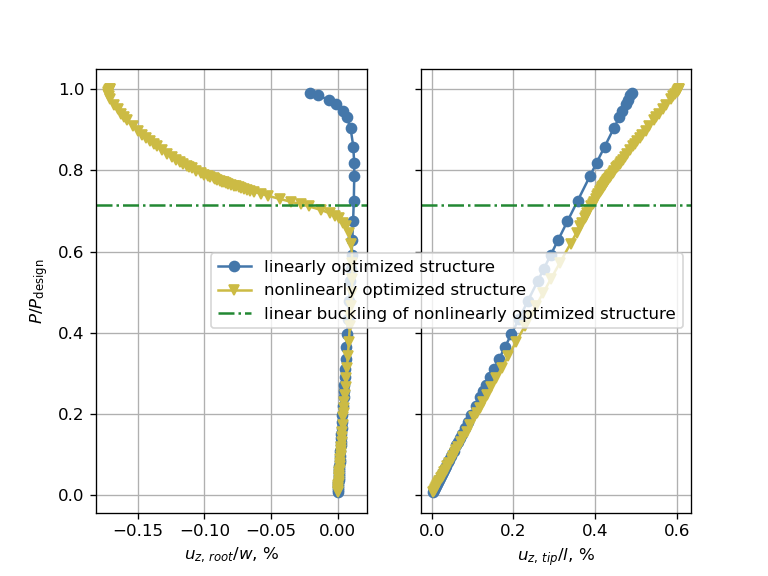

In [59]:
# Nondimensionalize displacements
nondimensional_displacements_dict[key] = {
    "root": displacements[plot_nodes_ids[0]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
    "tip": displacements[plot_nodes_ids[1]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

# Plot load-displacement diagrams of the initial and linearly optimized structures
fig, axes = plt.subplots(1, 2, sharey=True)  # create a figure with two subplots
design_labels = ["linearly optimized structure", "nonlinearly optimized structure"]  # labels for the designs
for ax_index, displacement_key in enumerate(displacement_labels):  # loop through the displacements
    stable_lines = []  # list to store proxy artists for the legend
    for color_index, design_key in enumerate(design_labels):  # loop through the designs
        plot_indices = nondimensional_loads_dict[design_key] <= 1  # limit plot to applied loads less than or equal to design load
        plot_utils.plot_2d_load_displacements_stability(eigenvalues_dict[design_key][:, plot_indices], axes[ax_index],
                                                        nondimensional_displacements_dict[design_key][displacement_key][plot_indices]*100,
                                                        nondimensional_loads_dict[design_key][plot_indices], MARKERS[color_index], COLORS[color_index])  # plot load-displacement curve
        stable_lines.append(Line2D([0], [0], linestyle='-', marker=MARKERS[color_index], color=COLORS[color_index], label=design_key))  # create proxy artist for the legend
    axes[ax_index].axhline(y=buckling_load_factor, color=GLASS_CEILING_COLOR, linestyle='-.')  # plot glass ceiling of linear buckling
    axes[ax_index].set_xlabel(f"$u_{{z,\,{displacement_key}}}/{reference_lengths[ax_index]}$, %")  # set x-axis label
    axes[ax_index].grid(visible=True)

# Add legend, y-axis label, and show plot
glass_ceiling_line = Line2D([0], [0], linestyle='-.', color=GLASS_CEILING_COLOR, label="linear buckling of nonlinearly optimized structure")  # create proxy artist for the legend
axes[1].legend(handles=stable_lines + [glass_ceiling_line])
axes[0].set_ylabel("$P/P_\mathrm{design}$")
plt.show()

Compare deformation at design load

Deformation at design load of linearly optimized structure:


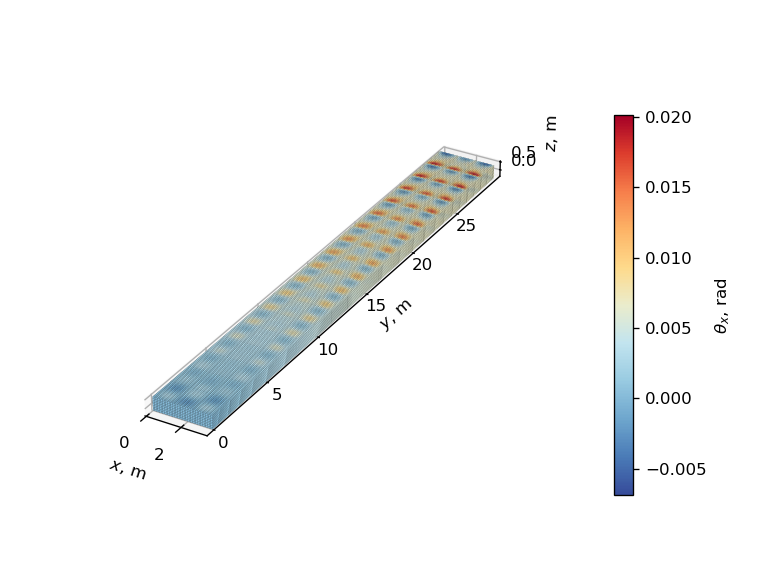

Deformation at design load of nonlinearly optimized structure:


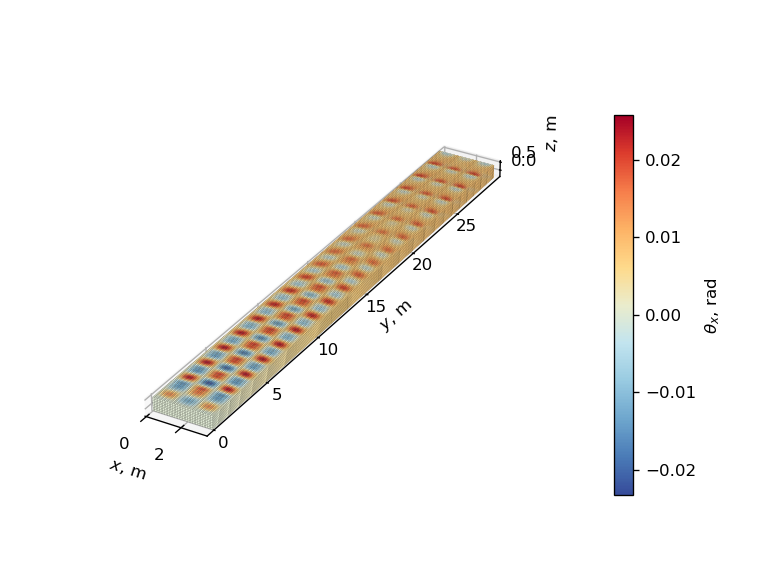

In [60]:
for key in design_labels:  # loop through the linearly and nonlinearly optimized structures
    print(f"Deformation at design load of {key}:")
    design_load_index = np.argmin(np.abs(nondimensional_loads_dict[key] - 1))  # find index of design load
    _, ax, cbar = pynastran_utils.plot_static_deformation(
        op2=sol_106_op2_dict[key], load_step=design_load_index + 1, displacement_component='rx', colormap='sunset', length_unit='m', unit_scale_factor=1e-3)  # plot deformation converting from mm to m
    adjust_3d_plot(ax, cbar)
    plt.show()

## Non-follower forces applied on load reference axis <a name="lra"></a>

***

Define load reference axis and find displacements predicted by linear buckling analysis for distributed non-follower forces.

In [61]:
# Initialize array of coordinates and ids of LRA nodes
lra_bdf = original_mesh_bdf.__deepcopy__({})
lra_xyz_array = np.empty((len(ribs_y_locations), 3))
lra_node_ids = np.empty(len(ribs_y_locations), dtype=int)

# Loop over the y-coordinates of the ribs
for i, y in enumerate(ribs_y_locations):
    # Add master node at the center of the rib section
    lra_node_ids[i] = len(lra_bdf.nodes) + 1
    lra_xyz_array[i, :] = np.array([W/2, y, 0])
    lra_bdf.add_grid(lra_node_ids[i], lra_xyz_array[i, :])
    
    # Find id of the nodes on the edge of the current rib
    rib_edge_nodes_ids = [nid for nid in lra_bdf.nodes if (
        np.abs(lra_bdf.nodes[nid].xyz[1] - y) < NODE_TOLERANCE) &  # find nodes on the rib
        (np.abs((lra_bdf.nodes[nid].xyz[0]) < NODE_TOLERANCE) |       # find nodes on the front spar
        (np.abs(lra_bdf.nodes[nid].xyz[0] - W) < NODE_TOLERANCE) |    # find nodes on the rear spar
        (np.abs(lra_bdf.nodes[nid].xyz[2] - h/2) < NODE_TOLERANCE) |  # find nodes on the top skin
        (np.abs(lra_bdf.nodes[nid].xyz[2] + h/2) < NODE_TOLERANCE))]  # find nodes on the bottom skin
    
    # Add RBE3 to connect master node with edge nodes of tip rib
    rbe3_eid = len(lra_bdf.elements) + len(lra_bdf.rigid_elements) + 1
    lra_bdf.add_rbe3(
        eid=rbe3_eid, refgrid=lra_node_ids[i], refc='123456', weights=[1.], comps=['123456'], Gijs=[rib_edge_nodes_ids])

Apply distributed non-follower forces and run linear buckling analysis.

In [62]:
# Apply distributed load
lra_displacements_bdf = lra_bdf.__deepcopy__({})
force_y_coordinates, force_magnitudes = apply_distributed_non_follower_forces(lra_displacements_bdf)
lra_displacements_bdf.add_load(sid=LOAD_SET_ID, scale=1., scale_factors=[DESIGN_LOAD], load_ids=[FORCE_SET_ID])  # add LOAD card

# Run SOL 105 and return OP2 object
input_name = "sol_105_lra_displacements"
sol_105_op2 = pynastran_utils.run_sol_105(
    bdf=lra_displacements_bdf, static_load_set_id=FORCE_SET_ID, analysis_directory_path=ANALYSIS_DIRECTORY_PATH,
    input_name=input_name, run_flag=False)

Nastran job sol_105_lra_displacements.bdf completed
Wall time: 16.0 s


Find displacements of nodes of load reference axis and forces on nodes of the box beam mesh.

In [63]:
# Find displacements of nodes of load reference axis
lra_disp_array = np.zeros_like(lra_xyz_array)
for i, nid in enumerate(lra_node_ids):
    node_index = np.where(sol_105_op2.displacements[FIRST_SUBCASE_ID].node_gridtype[:, 0] == nid)[0][0]
    lra_disp_array[i, :] = sol_105_op2.displacements[FIRST_SUBCASE_ID].data[0, node_index, :3]
    
# Create array of applied loads on the nodes of the mesh
box_beam_load_array = np.zeros_like(nodes_xyz_array)
top_skin_points_indices = np.flatnonzero(np.char.find(original_mesh.point_data['tags'], "top skin")!=-1)  # find indices of top skin points by looking for "top skin" tag
bottom_skin_points_indices = np.flatnonzero(np.char.find(original_mesh.point_data['tags'], "bottom skin")!=-1)  # find indices of bottom skin points by looking for "bottom skin" tag

for i, y in enumerate(force_y_coordinates):
    # Find indices where y-coordinates match the current y-station
    top_indices = np.where(np.abs(nodes_xyz_array[top_skin_points_indices, 1] - y) < NODE_TOLERANCE)[0]
    bottom_indices = np.where(np.abs(nodes_xyz_array[bottom_skin_points_indices, 1] - y) < NODE_TOLERANCE)[0]

    # Assign forces to z-components for nodes at this y-coordinate
    local_force_magnitude = force_magnitudes[i]
    box_beam_load_array[top_skin_points_indices[top_indices], 2] = local_force_magnitude/len(top_indices)
    box_beam_load_array[bottom_skin_points_indices[bottom_indices], 2] = local_force_magnitude/len(top_indices)
    
box_beam_load_array *= DESIGN_LOAD  # scale applied loads to design load

Transfer displacement and loads.

In [64]:
from mpi4py import MPI
from funtofem import FUNtoFEMmodel, Body, Scenario, TransferSettings

# --------------------------------------------------------------#
# Setup CAPS Problem and FUNtoFEM model
# --------------------------------------------------------------#
comm = MPI.COMM_WORLD
f2f_model = FUNtoFEMmodel("box_beam")
box_beam_body = Body.aeroelastic(
    "box_beam"
)  # says aeroelastic but not coupled, only used for load and displacement transfer

# Register the funtofem Body to the model
box_beam_body.register_to(f2f_model)

# make the scenario(s)
box_beam_scenario = Scenario.steady("box_beam", steps=1)
box_beam_scenario.register_to(f2f_model)

# collect nodes' coordiantes of the box beam into the box_beam_X array, [x1,y1,z1,x2,y2,z2,...]
box_beam_X = nodes_xyz_array.flatten()
aero_id = np.arange(1, nodes_xyz_array.shape[0] + 1)
box_beam_body.initialize_aero_nodes(box_beam_X, aero_id)

# collect nodes' coordiantes of the load reference axis into the lra_X array, [x1,y1,z1,x2,y2,z2,...]
lra_X = lra_xyz_array.flatten()
struct_id = np.arange(1, lra_xyz_array.shape[0] + 1)
box_beam_body.initialize_struct_nodes(lra_X, struct_id)

# verify aero mesh
print(f"box beam X, shape {box_beam_X.shape} = {box_beam_body.aero_X}")
# verify struct mesh
print(f"lra X, shape {lra_X.shape} = {box_beam_body.struct_X}")

# Transfer scheme settings, using "meld" method with symmetry about the Y-axis
transfer_settings = TransferSettings(
    elastic_scheme="linearized meld",
    beta=0.5,
    npts=200,
)

# Initialize transfer scheme
box_beam_body.initialize_transfer(
    comm,
    struct_comm=comm,
    struct_root=0,
    aero_comm=comm,
    aero_root=0,
    transfer_settings=transfer_settings,
)
box_beam_body.initialize_variables(box_beam_scenario)

# Set displacement to transfer into body
box_beam_body.struct_disps[box_beam_scenario.id] = lra_disp_array.flatten()

# Set loads to transfer into body
box_beam_body.aero_loads[box_beam_scenario.id] = box_beam_load_array.flatten()

# Perform the load transfer
box_beam_body.transfer_disps(box_beam_scenario, time_index=0)
box_beam_body.transfer_loads(box_beam_scenario, time_index=0)

# Retrieve the transferred displacements
aero_disps = box_beam_body.get_aero_disps(box_beam_scenario, time_index=0)
print("Aero disps after transfer:", aero_disps)

# Retrieve the transferred loads on the load reference axis
lra_loads = box_beam_body.get_struct_loads(box_beam_scenario, time_index=0)  # [fx, fy, fz, ...] for each node on LRA

# Optionally, for visualization or verification
print("Structural loads after transfer:", lra_loads)

box beam X, shape (97197,) = [3410.              1632.2222222222222 -385.              ...
    0.              1530.2083333333333  288.75           ]
lra X, shape (57,) = [ 1705.                  0.                  0.
  1705.               1632.2222222222222     0.
  1705.               3264.4444444444443     0.
  1705.               4896.666666666666      0.
  1705.               6528.888888888889      0.
  1705.               8161.111111111111      0.
  1705.               9793.333333333332      0.
  1705.              11425.555555555555      0.
  1705.              13057.777777777777      0.
  1705.              14690.                  0.
  1705.              16322.222222222223      0.
  1705.              17954.444444444445      0.
  1705.              19586.666666666664      0.
  1705.              21218.888888888887      0.
  1705.              22851.11111111111       0.
  1705.              24483.333333333332      0.
  1705.              26115.555555555555      0.
  1705.      

Add force cards to nodes of LRA.

In [65]:
lra_loads_array = lra_loads.reshape(-1, 3)
for i, node_id in enumerate(lra_node_ids):
    pynastran_utils.add_uniform_force(
        bdf=lra_bdf, nodes_ids=[node_id], set_id=FORCE_SET_ID, direction_vector=[0, 0, 1], force_magnitude=lra_loads_array[i, 2])


Run linear buckling analysis of initial structure.

In [66]:
box_beam_utils.define_property_patches(
    bdf=lra_bdf, ribs_y_locations=ribs_y_locations, stiffeners_x_locations=stiffeners_x_locations)
sol_105_lra_bdf = lra_bdf.__deepcopy__({})
pynastran_utils.set_up_sol_105(bdf=sol_105_lra_bdf, static_load_set_id=FORCE_SET_ID, no_eigenvalues=NO_EIGENVALUES)  # set up SOL 105
sol_105_lra_bdf.case_control_deck.subcases[0].add_result_type('STRESS', 'ALL', ['PLOT'])  # store stress results of all elements in the op2 file
input_name = "sol_105_lra_linear_opt_start"
sol_105_group = optimization_utils.NastranGroup(bdf=sol_105_lra_bdf, sigma_y=SIGMA_Y,
                                                analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name, run_flag=False)  # create NastranGroup object
sol_105_group.add_subsystem('interp', interp_comp)  # add spline component to the group
sol_105_group.connect('interp.t_val', 'nastran_solver.t_val')  # connect spline component output to the SOL 105 component input
linear_problem = om.Problem(model=sol_105_group, name="sol_105_lra")
linear_problem.setup()
linear_problem.set_val('interp.t_cp', initial_thickness_vector)
linear_problem.run_model()

Nastran job sol_105_lra_linear_opt_start.bdf completed
Wall time: 24.0 s


Find critical buckling load and plot corresponding buckling mode.

P_SOL 105/P_design = 0.996
Critical buckling mode


/home/fmamitrotta/anaconda3/envs/meld_demo/lib/python3.9/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)


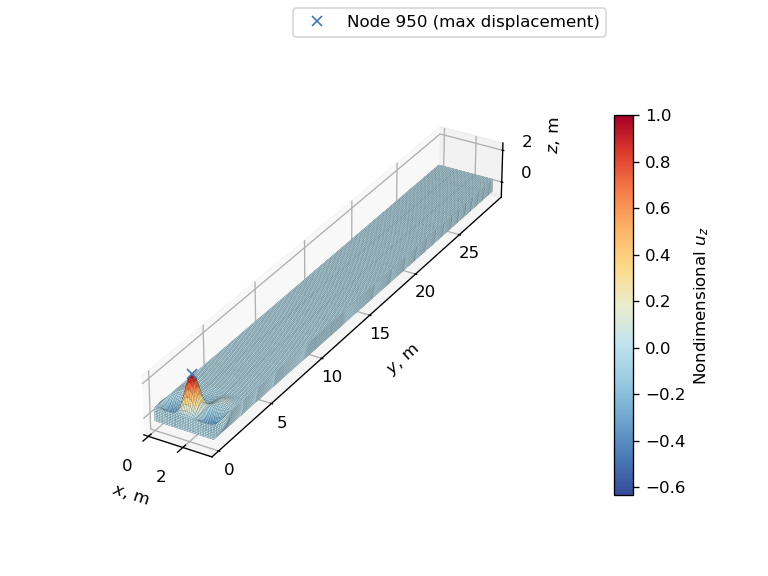

In [67]:
# Retrieve OP2 object of nonlinear analysis and print buckling load
sol_105_op2 = linear_problem['nastran_solver.op2']
buckling_load_factor = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].eigrs[0]
print(f"P_SOL 105/P_design = {buckling_load_factor:.3f}")

# Plot buckling mode
print("Critical buckling mode")
amplification_factor = 2  # amplification factor for displacements
_, ax, cbar = pynastran_utils.plot_buckling_mode(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
    displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to m

# Find node where max displacement occurs
max_displacement_index = np.argmax(np.linalg.norm(sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].data[0, :, 0:3], axis=1))  # find index of max displacement magnitude
max_displacement_node_id = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].node_gridtype[max_displacement_index, 0]

# Plot node where max displacement occurs
max_displacement_node_xyz = sol_105_op2.nodes[max_displacement_node_id].xyz*1e-3 + sol_105_op2.eigenvectors[
    SECOND_SUBCASE_ID].data[0, max_displacement_index, 0:3]*amplification_factor  # add displacement to node position and convert to m
ax.plot(max_displacement_node_xyz[0], max_displacement_node_xyz[1], max_displacement_node_xyz[2], 'x',
        label=f"Node {max_displacement_node_id:d} (max displacement)", zorder=4)
ax.legend()

# Adjust plot and show
adjust_3d_plot(ax, cbar)
plt.show()

Set up nonlinear problem with OpenMDAO and run nonlinear analysis of initial structure.

In [68]:
# Set up BDF object for nonlinear analysis
sol_106_lra_bdf = lra_bdf.__deepcopy__({})
sol_106_lra_bdf.case_control_deck.subcases[0].add_result_type('NLSTRESS', 'ALL', ['PLOT'])  # storen nonlinear stress results of all elements in the op2 file
pynastran_utils.set_up_arc_length_method(
    bdf=sol_106_lra_bdf, max_iter=3, conv='PU', eps_u=1e-5, eps_p=1e-6, max_bisect=20, minalr=1e-5, desiter=4, maxinc=300)
sol_106_lra_bdf.add_load(sid=LOAD_SET_ID, scale=1., scale_factors=[2.], load_ids=[FORCE_SET_ID])  # add LOAD card to apply twice the design load
pynastran_utils.create_static_load_subcase(bdf=sol_106_lra_bdf, subcase_id=FIRST_SUBCASE_ID, load_set_id=LOAD_SET_ID)
pynastran_utils.set_up_sol_106_with_kllrh_eigenvalues(
    bdf=sol_106_lra_bdf, analysis_directory_path=ANALYSIS_DIRECTORY_PATH, method_set_id=METHOD_SET_ID, no_eigenvalues=NO_EIGENVALUES,
    upper_eig=UPPER_EIGENVALUE)

# Set up OpenMDAO problem
input_name = "sol_106_lra_linear_opt_start"
sol_106_group = optimization_utils.NastranGroup(
    bdf=sol_106_lra_bdf, sigma_y=SIGMA_Y, analysis_directory_path=ANALYSIS_DIRECTORY_PATH, input_name=input_name, run_flag=False)  # create NastranGroup object
sol_106_group.add_subsystem('interp', interp_comp)  # add spline component to the group
sol_106_group.connect('interp.t_val', 'nastran_solver.t_val')  # connect spline component output to the SOL 105 component input
nonlinear_problem = om.Problem(model=sol_106_group, name="sol_106_lra")
nonlinear_problem.setup()

# Set initial thickness distribution and run model
nonlinear_problem.set_val('interp.t_cp', initial_thickness_vector)
nonlinear_problem.run_model()

Nastran job sol_106_lra_linear_opt_start.bdf completed
Wall time: 9152.0 s


Plot eigenvalues of tangent stiffness matrix.

<>:17: DeprecationWarning: invalid escape sequence \l
<>:18: DeprecationWarning: invalid escape sequence \m
<>:17: DeprecationWarning: invalid escape sequence \l
<>:18: DeprecationWarning: invalid escape sequence \m
/tmp/ipykernel_186594/1944318833.py:17: DeprecationWarning: invalid escape sequence \l
  ax.set_ylabel("$\lambda$, N/m")
/tmp/ipykernel_186594/1944318833.py:18: DeprecationWarning: invalid escape sequence \m
  ax.set_xlabel("$P/P_\mathrm{design}$")


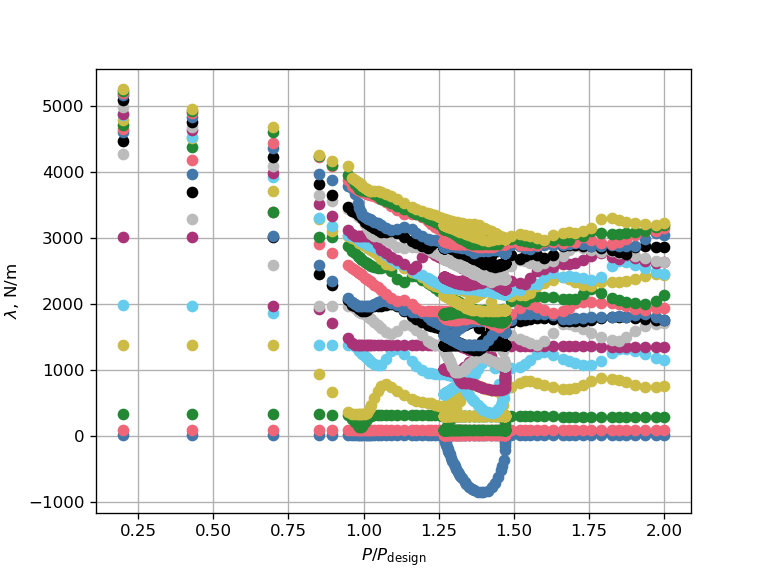

Nondimensional applied load at first limit point: 1.47


In [69]:
# Retrieve OP2 object of nonlinear analysis
key = "initial structure"
sol_106_op2_dict[key] = nonlinear_problem['nastran_solver.op2']

# Read load and displacement history of benchmark analysis from op2 file
_, loads, displacements = pynastran_utils.read_load_displacement_history_from_op2(
    op2=sol_106_op2_dict[key], node_ids=plot_nodes_ids)
nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/DESIGN_LOAD  # nondimensionalize loads

# Read eigenvalues of tangent stiffness matrix
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path to .f06 file
eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)

# Plot eigenvalues vs applied load
_, ax = plt.subplots()
plot_utils.plot_eigenvalue_diagram(ax, nondimensional_loads_dict[key], eigenvalues_dict[key]*1e3)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

# Print nondimensional applied load at limit point and percentage difference of original mesh w.r.t. refined mesh
nondimensional_limit_point_load = nondimensional_loads_dict[key][np.where(eigenvalues_dict[key][0] < 0)[0][0]]
print(f"Nondimensional applied load at first limit point: {nondimensional_limit_point_load:.2f}")

Plot 3D load-displacement diagram.

<>:18: DeprecationWarning: invalid escape sequence \,
<>:19: DeprecationWarning: invalid escape sequence \,
<>:20: DeprecationWarning: invalid escape sequence \m
<>:18: DeprecationWarning: invalid escape sequence \,
<>:19: DeprecationWarning: invalid escape sequence \,
<>:20: DeprecationWarning: invalid escape sequence \m
/tmp/ipykernel_186594/2058940293.py:18: DeprecationWarning: invalid escape sequence \,
  ax_3d.set_xlabel("$u_{z,\,root}/w$, %")
/tmp/ipykernel_186594/2058940293.py:19: DeprecationWarning: invalid escape sequence \,
  ax_3d.set_ylabel("$u_{z,\,tip}/l$, %")
/tmp/ipykernel_186594/2058940293.py:20: DeprecationWarning: invalid escape sequence \m
  ax_3d.set_zlabel("$P/P_\mathrm{SOL\/105}$")


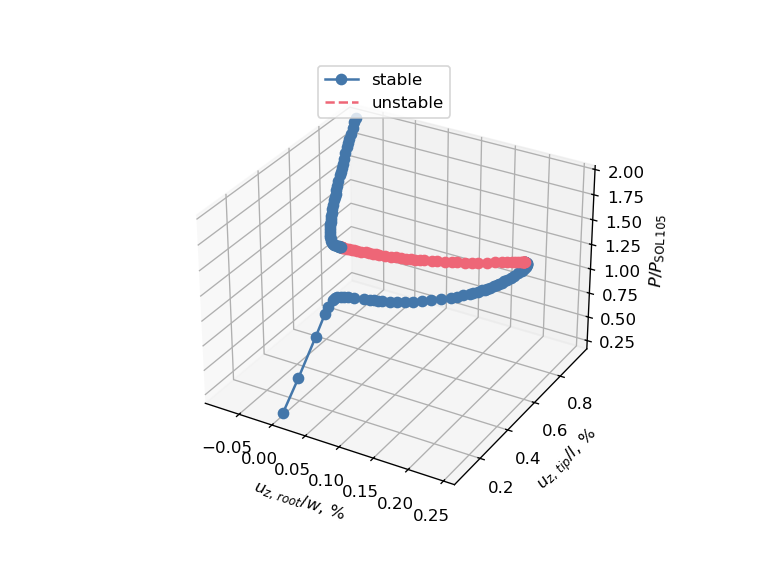

In [70]:
# Nondimensionalize displacements
nondimensional_displacements_dict[key] = {
    "root": displacements[plot_nodes_ids[0]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
    "tip": displacements[plot_nodes_ids[1]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

# Plot 3D load-displacement diagram
fig = plt.figure()  # create a figure
ax_3d = plt.axes(projection="3d")  # create 3D axes
plot_utils.plot_3d_load_displacements_stability(eigenvalues=eigenvalues_dict[key], axes=ax_3d,
                                                displacements1=nondimensional_displacements_dict[key]["root"]*100,
                                                displacements2=nondimensional_displacements_dict[key]["tip"]*100,
                                                loads=nondimensional_loads_dict[key],
                                                marker=MARKERS[0], color=COLORS[0])

# Add legend, axes labels and grid
stable_line = Line2D([0], [0], linestyle='-', marker=MARKERS[0], color=COLORS[0], label="stable")  # create proxy artist for the legend
fig.legend(handles=[stable_line, unstable_line], loc="upper center", bbox_to_anchor=(0.5, 0.9))
ax_3d.set_xlabel("$u_{z,\,root}/w$, %")
ax_3d.set_ylabel("$u_{z,\,tip}/l$, %")
ax_3d.set_zlabel("$P/P_\mathrm{SOL\/105}$")
ax_3d.grid(visible=True)
plt.show()

### Linear buckling optimization <a name="lra-linear"></a>

Record objective and constraint functions of initial design.

In [71]:
mass_0 = linear_problem['nastran_solver.mass'][0]
ks_buckling_0 = linear_problem['nastran_solver.ks_buckling'][0]
ks_stress_0 = linear_problem['nastran_solver.ks_stress'][0]
print(f"""Initial mass: {mass_0*1e3:.0f} kg
Initial thickness vector [mm]:""")
print(initial_thickness_vector)
print(f"""Initial KS value for buckling load factor: {ks_buckling_0:.2f}
Initial KS value for stress: {ks_stress_0:.0f} MPa""")

Initial mass: 6519 kg
Initial thickness vector [mm]:
[7.7 7.7]
Initial KS value for buckling load factor: 0.00
Initial KS value for stress: -396 MPa


Run optimization and plot optimization history.

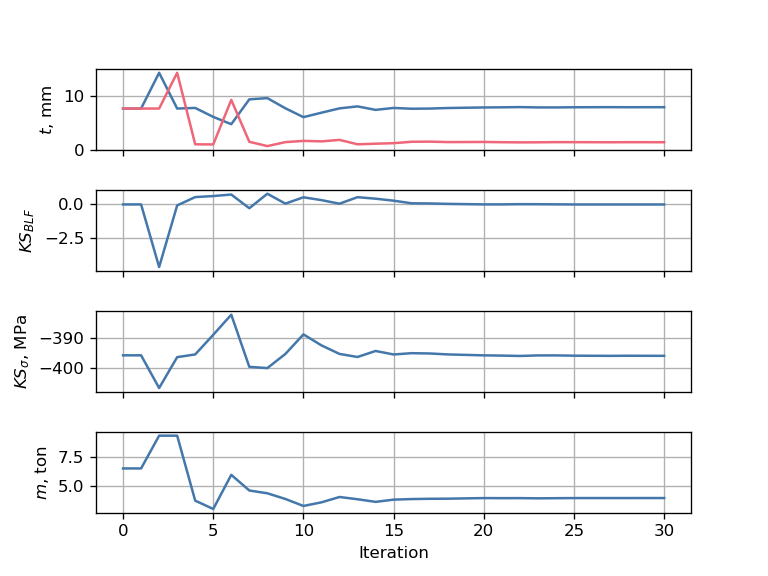

Final mass: 3955 kg
Mass variation: -39.33 %
Final thickness vector [mm]:
[7.954470769539543 1.388063287165326]
Final KS value of buckling load factor: 0.00
Final KS value for stress: -395.84 MPa


In [72]:
# Set default initial thickness vector and name of input file
linear_problem.model.set_input_defaults('interp.t_cp', initial_thickness_vector)
input_name = "sol_105_lra_linear_opt"  # default name of input file
linear_problem.model.options['input_name'] = input_name

# Choose optimizer
linear_problem.driver = om.ScipyOptimizeDriver()
linear_problem.driver.options['optimizer'] = 'COBYLA'
linear_problem.driver.options['tol'] = 1e-3

# Add design variable, objective and constraints
thickness_bounds = [1., 20.]  # [mm]
linear_problem.model.add_design_var('interp.t_cp', lower=thickness_bounds[0], upper=thickness_bounds[1], ref0=thickness_bounds[0], ref=t0)  # scale thickness so that the lower bound is 0 and initial value is 1
linear_problem.model.add_objective('nastran_solver.mass', ref0=mass_0/2, ref=mass_0)  # scale mass so that half of the initial mass is 0 and the initial mass is 1
linear_problem.model.add_constraint('nastran_solver.ks_buckling', upper=0.)  # KS function for buckling load factor is not scaled because buckling load factor is already a ratio
linear_problem.model.add_constraint('nastran_solver.ks_stress', upper=0., ref=np.abs(ks_stress_0))  # scale KS function for stresses so that the initial value is 1

# Add recorder to the driver
recorder_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.sql')
recorder = om.SqliteRecorder(recorder_filepath)  # create recorder
linear_problem.driver.add_recorder(recorder)  # attach recorder to the driver

# Run optimization
linear_problem.setup()  # re-setup problem before running optimization
linear_problem.set_solver_print(0)  # disable solver output
linear_problem.driver.options['debug_print'] = ['desvars','nl_cons','objs']  # print design variables, constraints and objectives
if False:  # set True or False to run optimization or not
    linear_problem.run_driver()  # run optimization
linear_problem.cleanup()  # clean up problem

# Plot optimization history and print results
histories = optimization_utils.plot_optimization_history(recorder_filepath)  # plot optimization history
mass_percentage_variation = (histories['nastran_solver.mass'][-1, 0]/mass_0 - 1)*100
print(f"""Final mass: {histories['nastran_solver.mass'][-1, 0]*1e3:.0f} kg
Mass variation: {mass_percentage_variation:.2f} %
Final thickness vector [mm]:""")
print(histories['interp.t_cp'][-1])
print(f"""Final KS value of buckling load factor: {histories['nastran_solver.ks_buckling'][-1, 0]:.2f}
Final KS value for stress: {histories['nastran_solver.ks_stress'][-1, 0]:.2f} MPa""")

Plot critical buckling mode of optimized structure.

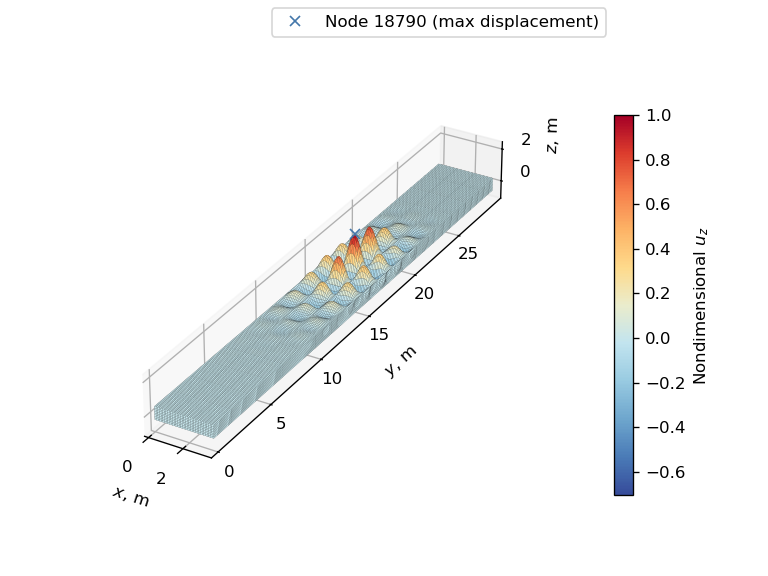

In [73]:
# Read op2 file of linear buckling analysis
sol_105_op2_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.op2')
sol_105_op2 = read_op2(op2_filename=sol_105_op2_filepath, load_geometry=True, debug=None)

# Plot buckling mode
amplification_factor = 2  # amplification factor for displacements
_, ax, cbar = pynastran_utils.plot_buckling_mode(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
    displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to m

# Find node where max displacement occurs
max_displacement_index = np.argmax(np.linalg.norm(sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].data[0, :, 0:3], axis=1))  # find index of max displacement magnitude
max_displacement_node_id = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].node_gridtype[max_displacement_index, 0]

# Plot node where max displacement occurs
max_displacement_node_xyz = sol_105_op2.nodes[max_displacement_node_id].xyz*1e-3 + sol_105_op2.eigenvectors[
    SECOND_SUBCASE_ID].data[0, max_displacement_index, 0:3]*amplification_factor  # add displacement to node position and convert to m
ax.plot(max_displacement_node_xyz[0], max_displacement_node_xyz[1], max_displacement_node_xyz[2], 'x',
        label=f"Node {max_displacement_node_id:d} (max displacement)", zorder=4)
ax.legend()

# Adjust plot and show
adjust_3d_plot(ax, cbar)
plt.show()

#### Nonlinear response of linearly optimized structure

Run nonlinear analysis of linearly optimized structure.

In [74]:
input_name = "sol_106_lra_linear_opt"
nonlinear_problem.model.options['input_name'] = input_name
nonlinear_problem.setup()
nonlinear_problem.set_val('interp.t_cp', histories['interp.t_cp'][-1])
nonlinear_problem.run_model()

Nastran job sol_106_lra_linear_opt.bdf completed
Wall time: 22606.0 s


Plot eigenvalues of tangent stiffness matrix.

<>:17: DeprecationWarning: invalid escape sequence \l
<>:18: DeprecationWarning: invalid escape sequence \m
<>:17: DeprecationWarning: invalid escape sequence \l
<>:18: DeprecationWarning: invalid escape sequence \m
/tmp/ipykernel_186594/2216248110.py:17: DeprecationWarning: invalid escape sequence \l
  ax.set_ylabel("$\lambda$, N/m")
/tmp/ipykernel_186594/2216248110.py:18: DeprecationWarning: invalid escape sequence \m
  ax.set_xlabel("$P/P_\mathrm{design}$")


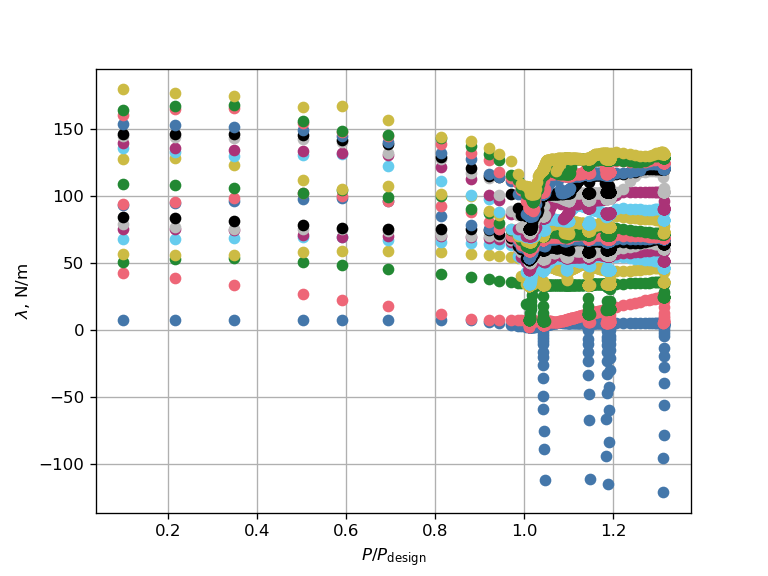

Nondimensional applied load at first limit point: 1.19


In [75]:
# Retrieve OP2 object of nonlinear analysis
key = "linearly optimized structure"
sol_106_op2_dict[key] = nonlinear_problem['nastran_solver.op2']

# Read load and displacement history of benchmark analysis from op2 file
_, loads, displacements = pynastran_utils.read_load_displacement_history_from_op2(
    op2=sol_106_op2_dict[key], node_ids=plot_nodes_ids)
nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/DESIGN_LOAD  # nondimensionalize loads

# Read eigenvalues of tangent stiffness matrix
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path to .f06 file
eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)

# Plot eigenvalues vs applied load
_, ax = plt.subplots()
plot_utils.plot_eigenvalue_diagram(ax, nondimensional_loads_dict[key], eigenvalues_dict[key]*1e3)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

# Print nondimensional applied load at limit point and percentage difference of original mesh w.r.t. refined mesh
nondimensional_limit_point_load = nondimensional_loads_dict[key][np.where(eigenvalues_dict[key][0] < 0)[0][0]]
print(f"Nondimensional applied load at first limit point: {nondimensional_limit_point_load:.2f}")

Plot load-displacement diagrams for initial and linearly optimized structure.

<>:17: DeprecationWarning: invalid escape sequence \,
<>:23: DeprecationWarning: invalid escape sequence \m
<>:17: DeprecationWarning: invalid escape sequence \,
<>:23: DeprecationWarning: invalid escape sequence \m
/tmp/ipykernel_186594/1078765021.py:17: DeprecationWarning: invalid escape sequence \,
  axes[ax_index].set_xlabel(f"$u_{{z,\,{displacement_key}}}/{reference_lengths[ax_index]}$, %")  # set x-axis label
/tmp/ipykernel_186594/1078765021.py:23: DeprecationWarning: invalid escape sequence \m
  axes[0].set_ylabel("$P/P_\mathrm{design}$")


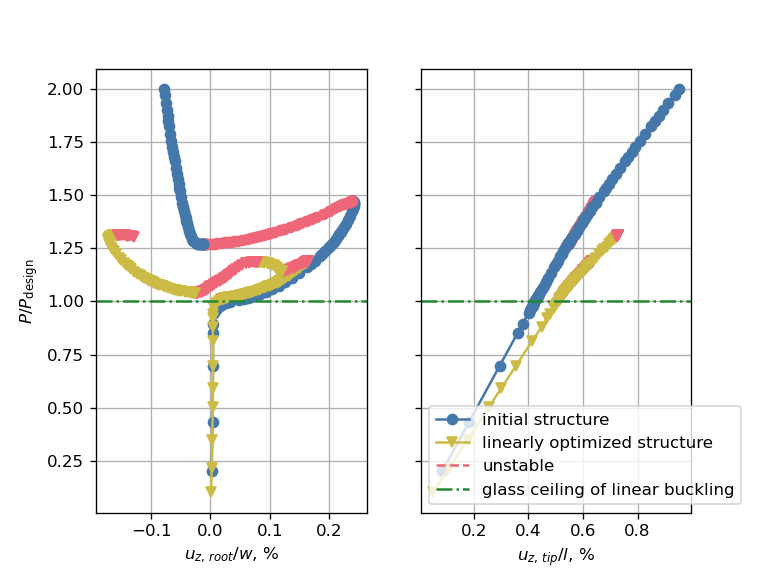

In [76]:
# Nondimensionalize displacements of the linearly optimized structure
nondimensional_displacements_dict[key] = {
    "root": displacements[plot_nodes_ids[0]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
    "tip": displacements[plot_nodes_ids[1]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

# Plot load-displacement diagrams of the initial and linearly optimized structures
fig, axes = plt.subplots(1, 2, sharey=True)  # create a figure with two subplots
design_labels = ["initial structure", "linearly optimized structure"]  # labels for the designs
for ax_index, displacement_key in enumerate(displacement_labels):  # loop through the displacements
    stable_lines = []  # list to store proxy artists for the legend
    for color_index, design_key in enumerate(design_labels):  # loop through the designs
        plot_utils.plot_2d_load_displacements_stability(eigenvalues_dict[design_key], axes[ax_index],
                                                        nondimensional_displacements_dict[design_key][displacement_key]*100,
                                                        nondimensional_loads_dict[design_key], MARKERS[color_index], COLORS[color_index])  # plot load-displacement curve
        stable_lines.append(Line2D([0], [0], linestyle='-', marker=MARKERS[color_index], color=COLORS[color_index], label=design_key))  # create proxy artist for the legend
    axes[ax_index].axhline(y=1, color=GLASS_CEILING_COLOR, linestyle='-.')  # plot glass ceiling of linear buckling
    axes[ax_index].set_xlabel(f"$u_{{z,\,{displacement_key}}}/{reference_lengths[ax_index]}$, %")  # set x-axis label
    axes[ax_index].grid(visible=True)

# Add legend, y-axis label, and show plot
glass_ceiling_line = Line2D([0], [0], linestyle='-.', color=GLASS_CEILING_COLOR, label="glass ceiling of linear buckling")  # create proxy artist for the legend
axes[1].legend(handles=stable_lines + [unstable_line, glass_ceiling_line])
axes[0].set_ylabel("$P/P_\mathrm{design}$")
plt.show()

Compare deformation at design load

Deformation at design load of initial structure:


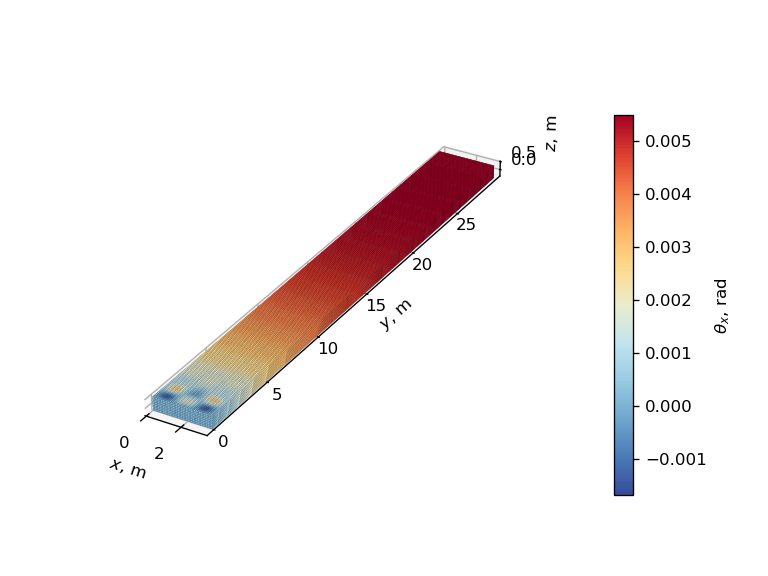

Deformation at design load of linearly optimized structure:


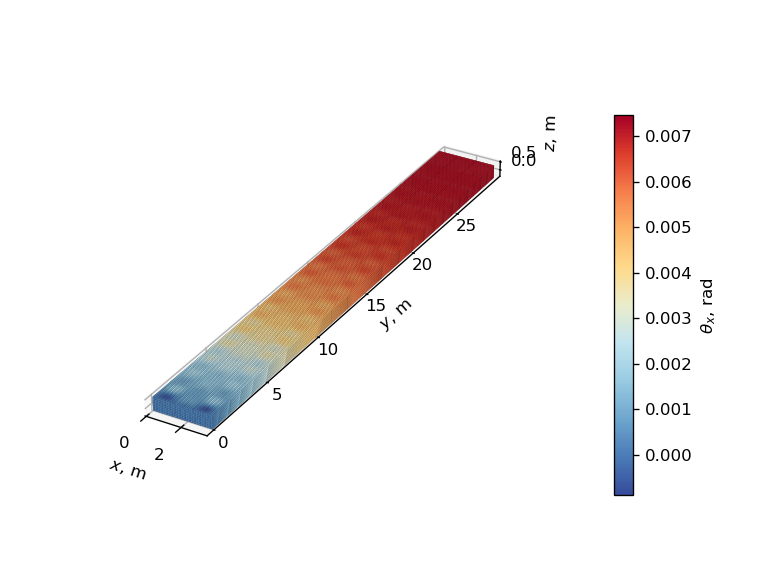

In [77]:
for key in design_labels:  # loop through the linearly and nonlinearly optimized structures
    print(f"Deformation at design load of {key}:")
    design_load_index = np.argmin(np.abs(nondimensional_loads_dict[key] - 1))  # find index of design load
    _, ax, cbar = pynastran_utils.plot_static_deformation(
        op2=sol_106_op2_dict[key], load_step=design_load_index + 1, displacement_component='rx', colormap='sunset', length_unit='m', unit_scale_factor=1e-3)  # plot deformation converting from mm to m
    adjust_3d_plot(ax, cbar)
    plt.show()

### Nonlinear structural stability optimization <a name="lra-nonlinear"></a>

Record objective and constraint functions of initial design.

In [79]:
# Modify BDF object and run analysis of linearly optimized structure under design load
sol_106_lra_bdf.load_combinations[LOAD_SET_ID][0].scale_factors[0] = 1.  # scale load to design load
dmap_stop = sol_106_lra_bdf.executive_control_lines[1].replace("nobuckle", "stop")  # get include string for DMAP stopping the analysis after the first negative eigenvalue is found
sol_106_lra_bdf.executive_control_lines[1] = dmap_stop  # change DMAP command to store eigenvectors
nonlinear_problem.model.nastran_solver.options['input_name'] = "sol_106_lra_nonlinear_opt_start"
nonlinear_problem.run_model()

# Store and print results
mass_0 = nonlinear_problem['nastran_solver.mass'][0]
ks_stability_0 = nonlinear_problem["nastran_solver.ks_stability"][0]
ks_stress_0 = nonlinear_problem["nastran_solver.ks_stress"][0]
print(f"""Initial mass: {mass_0*1e3:.0f} kg
Initial KS value for stability: {ks_stability_0:.1f} N/m
Initial KS value for stress: {ks_stress_0:.0f} MPa""")

Nastran job sol_106_lra_nonlinear_opt_start.bdf completed
Wall time: 1110.0 s
Initial mass: 3944 kg
Initial KS value for stability: -2.6 N/m
Initial KS value for stress: -396 MPa


Run optimization and plot optimization history.

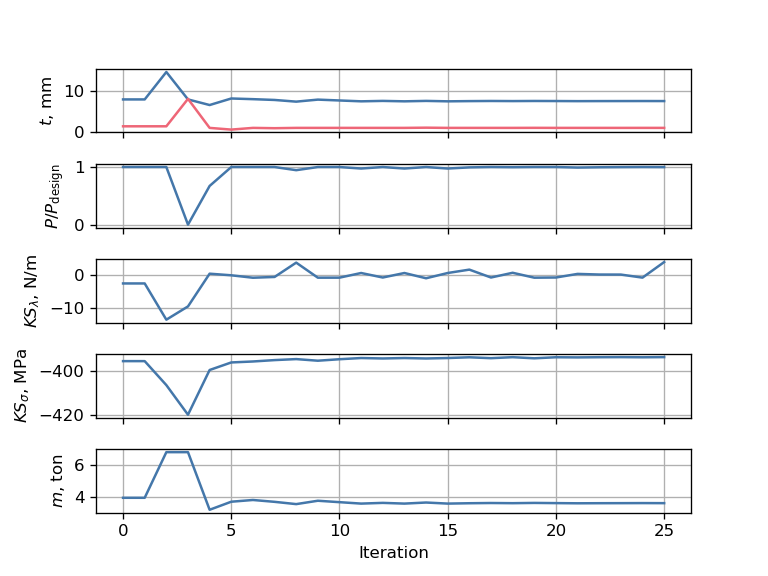

In [80]:
# Set default input values of sol_106 component
nonlinear_problem.model.set_input_defaults('interp.t_cp', histories['interp.t_cp'][-1])
input_name = "sol_106_lra_nonlinear_opt"
nonlinear_problem.model.options['input_name'] = input_name

# Choose optimizer
nonlinear_problem.driver = om.ScipyOptimizeDriver()
nonlinear_problem.driver.options['optimizer'] = 'COBYLA'
nonlinear_problem.driver.options['tol'] = 1e-3

# Add design variable, objective and constraints
nonlinear_problem.model.add_design_var('interp.t_cp', lower=thickness_bounds[0], upper=thickness_bounds[1], ref0=thickness_bounds[0], ref=t0)  # scale thickness so that the lower bound is 0 and initial value is 1
nonlinear_problem.model.add_objective('nastran_solver.mass', ref0=mass_0/2, ref=mass_0)  # scale mass so that half of the initial mass is 0 and the initial mass is 1
nonlinear_problem.model.add_constraint('nastran_solver.ks_stability', upper=0., ref=np.abs(ks_stability_0))  # scale KS function for nonlinear structural stability so that the initial value is 1
nonlinear_problem.model.add_constraint('nastran_solver.ks_stress', upper=0., ref=np.abs(ks_stress_0))  # scale KS function for stresses so that the initial value is 1
nonlinear_problem.model.add_constraint('nastran_solver.applied_load', lower=DESIGN_LOAD*.99, ref=DESIGN_LOAD)  # scale applied load so that design

# Add recorder
recorder_filepath = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.sql')
recorder = om.SqliteRecorder(recorder_filepath)  # create recorder
nonlinear_problem.driver.add_recorder(recorder)  # attach recorder to the driver

# Run optimization
nonlinear_problem.setup()  # re-setup problem
nonlinear_problem.set_solver_print(0)  # disable solver output
nonlinear_problem.driver.options['debug_print'] = ['desvars','nl_cons','objs']  # print design variables, constraints and objectives
if False:  # set True or False to run optimization or not
    nonlinear_problem.run_driver()  # run optimization
nonlinear_problem.cleanup()  # clean up problem

# Plot optimization history
histories = optimization_utils.plot_optimization_history(recorder_filepath)  # plot optimization history

Print results considering last iteration with satisfied stability constraints.

In [81]:
stability_constraint_satisfied = histories['nastran_solver.ks_stability'][:, 0] <= 0
feasible_design_index = np.where(stability_constraint_satisfied)[0][-1]
mass_percentage_variation = (histories['nastran_solver.mass'][feasible_design_index, 0]/mass_0 - 1)*100
feasible_thickness_array = histories['interp.t_cp'][feasible_design_index]
print(f"""Final mass: {histories['nastran_solver.mass'][-1, 0]*1e3:.0f} kg
Mass variation: {mass_percentage_variation:.2f} %
Final thickness vector [mm]:""")
print(feasible_thickness_array)
print(f"""Final KS value of nonlinear structural stability: {histories["nastran_solver.ks_stability"][feasible_design_index, 0]:.2f} N/m
Final KS value for stress: {histories['nastran_solver.ks_stress'][feasible_design_index, 0]:.0f} MPa""")

Final mass: 3621 kg
Mass variation: -8.10 %
Final thickness vector [mm]:
[7.559555775866425 1.00335          ]
Final KS value of nonlinear structural stability: -0.89 N/m
Final KS value for stress: -394 MPa


Plot eigenvalues of tangent stiffness matrix.

<>:19: DeprecationWarning: invalid escape sequence \l
<>:20: DeprecationWarning: invalid escape sequence \m
<>:19: DeprecationWarning: invalid escape sequence \l
<>:20: DeprecationWarning: invalid escape sequence \m
/tmp/ipykernel_186594/1137348082.py:19: DeprecationWarning: invalid escape sequence \l
  ax.set_ylabel("$\lambda$, N/m")
/tmp/ipykernel_186594/1137348082.py:20: DeprecationWarning: invalid escape sequence \m
  ax.set_xlabel("$P/P_\mathrm{design}$")


Nastran job sol_106_lra_nonlinear_opt.bdf completed
Wall time: 6013.0 s


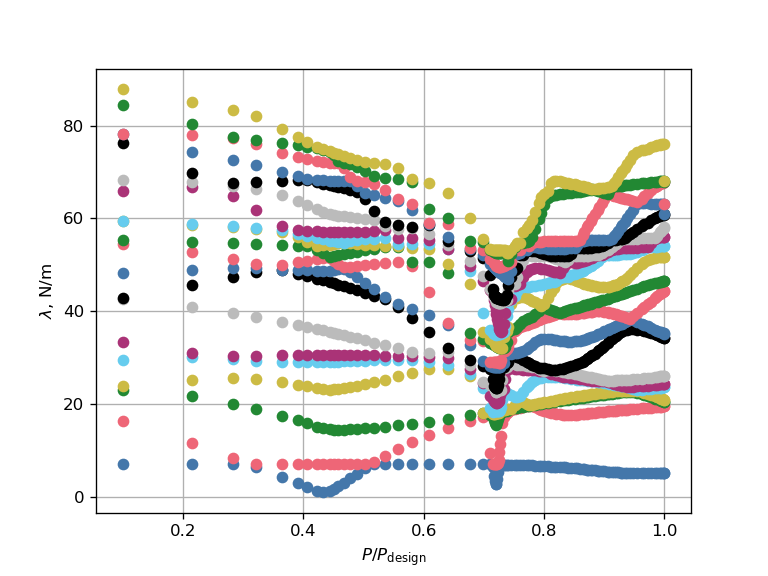

In [82]:
# Run analysis of last feasible design
key = "nonlinearly optimized structure"
nonlinear_problem.set_val('interp.t_cp', feasible_thickness_array)
nonlinear_problem.run_model()
sol_106_op2_dict[key] = nonlinear_problem['nastran_solver.op2']

# Read load and displacement history
_, loads, displacements = pynastran_utils.read_load_displacement_history_from_op2(
    op2=sol_106_op2_dict[key], node_ids=plot_nodes_ids)
nondimensional_loads_dict[key] = loads[FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/DESIGN_LOAD  # nondimensionalize loads

# Read eigenvalues of tangent stiffness matrix
f06_path = os.path.join(ANALYSIS_DIRECTORY_PATH, input_name + '.f06')  # path to .f06 file
eigenvalues_dict[key] = pynastran_utils.read_kllrh_lowest_eigenvalues_from_f06(f06_path)

# Plot eigenvalues vs applied load
_, ax = plt.subplots()
plot_utils.plot_eigenvalue_diagram(ax, nondimensional_loads_dict[key], eigenvalues_dict[key]*1e3)
ax.set_ylabel("$\lambda$, N/m")
ax.set_xlabel("$P/P_\mathrm{design}$")
ax.grid(visible=True)
plt.show()

Calculate linear buckling load of nonlinearly optimized structure.

Nastran job sol_105_follower_nonlinear_opt.bdf completed
Wall time: 31.0 s
P_SOL 105/P_design = 0.72
Critical buckling mode:


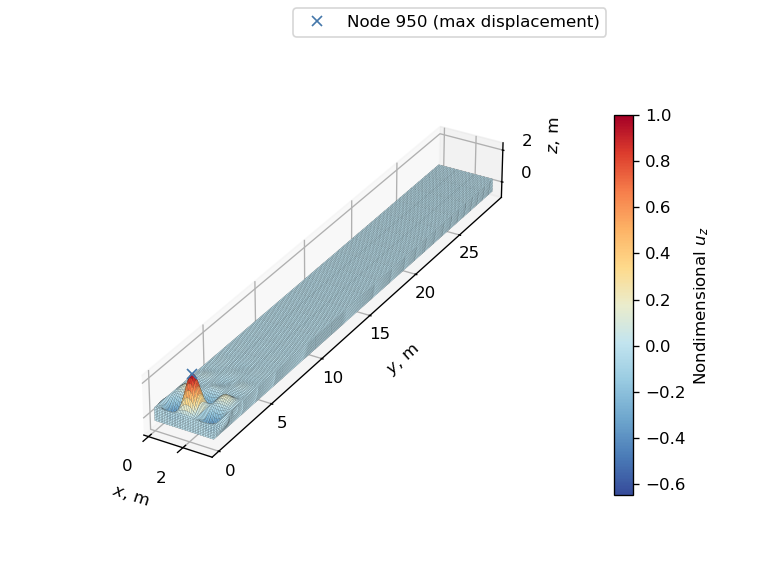

In [84]:
# Modify name of bdf file and input thicknesses and run analysis
linear_problem.model.options['input_name'] = "sol_105_follower_nonlinear_opt"
linear_problem.setup()
linear_problem.set_val('interp.t_cp', feasible_thickness_array)
linear_problem.run_model()

# Retrieve OP2 object of nonlinear analysis and print buckling load
sol_105_op2 = linear_problem['nastran_solver.op2']
buckling_load_factor = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].eigrs[0]
print(f"P_SOL 105/P_design = {buckling_load_factor:.2f}")

# Plot buckling mode
print("Critical buckling mode:")
amplification_factor = 2  # amplification factor for displacements
_, ax, cbar = pynastran_utils.plot_buckling_mode(
    op2=sol_105_op2, subcase_id=SECOND_SUBCASE_ID, displacement_component='tz', colormap='sunset', length_unit='m',
    displacement_amplification_factor=amplification_factor, unit_scale_factor=1e-3)  # plot buckling mode converting from mm to m

# Find node where max displacement occurs
max_displacement_index = np.argmax(np.linalg.norm(sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].data[0, :, 0:3], axis=1))  # find index of max displacement magnitude
max_displacement_node_id = sol_105_op2.eigenvectors[SECOND_SUBCASE_ID].node_gridtype[max_displacement_index, 0]

# Plot node where max displacement occurs
max_displacement_node_xyz = sol_105_op2.nodes[max_displacement_node_id].xyz*1e-3 + sol_105_op2.eigenvectors[
    SECOND_SUBCASE_ID].data[0, max_displacement_index, 0:3]*amplification_factor  # add displacement to node position and convert to m
ax.plot(max_displacement_node_xyz[0], max_displacement_node_xyz[1], max_displacement_node_xyz[2], 'x',
        label=f"Node {max_displacement_node_id:d} (max displacement)", zorder=4)
ax.legend()

# Adjust plot and show
adjust_3d_plot(ax, cbar)
plt.show()

Plot load-displacement diagrams for linearly and nonlinearly optimized structure.

<>:18: DeprecationWarning: invalid escape sequence \,
<>:24: DeprecationWarning: invalid escape sequence \m
<>:18: DeprecationWarning: invalid escape sequence \,
<>:24: DeprecationWarning: invalid escape sequence \m
/tmp/ipykernel_186594/1951980891.py:18: DeprecationWarning: invalid escape sequence \,
  axes[ax_index].set_xlabel(f"$u_{{z,\,{displacement_key}}}/{reference_lengths[ax_index]}$, %")  # set x-axis label
/tmp/ipykernel_186594/1951980891.py:24: DeprecationWarning: invalid escape sequence \m
  axes[0].set_ylabel("$P/P_\mathrm{design}$")
/home/fmamitrotta/anaconda3/envs/meld_demo/lib/python3.9/site-packages/ipywidgets/widgets/widget.py:503: DeprecationWarning: Passing unrecognized arguments to super(Toolbar).__init__().
__init__() missing 1 required positional argument: 'canvas'
This is deprecated in traitlets 4.2.This error will be raised in a future release of traitlets.
  super().__init__(**kwargs)


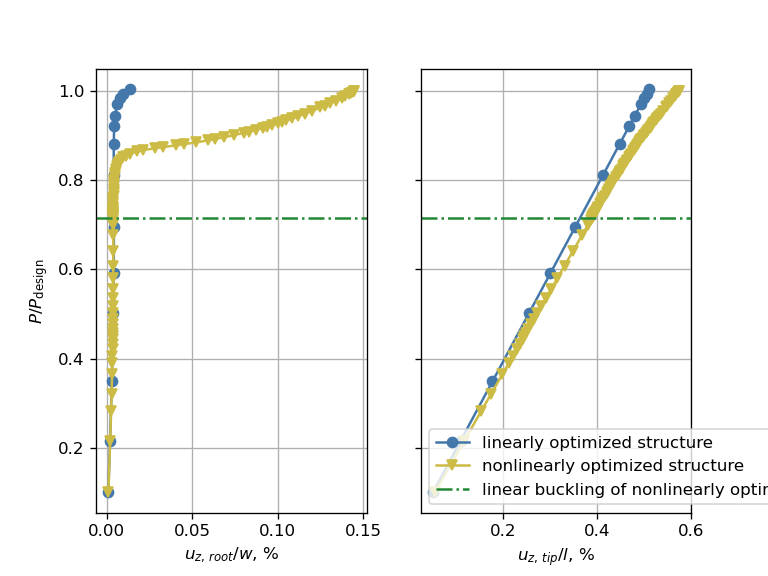

In [87]:
# Nondimensionalize displacements
nondimensional_displacements_dict[key] = {
    "root": displacements[plot_nodes_ids[0]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/W,
    "tip": displacements[plot_nodes_ids[1]][FIRST_SUBCASE_ID][:, Z_COMPONENT_INDEX]/L}

# Plot load-displacement diagrams of the initial and linearly optimized structures
fig, axes = plt.subplots(1, 2, sharey=True)  # create a figure with two subplots
design_labels = ["linearly optimized structure", "nonlinearly optimized structure"]  # labels for the designs
for ax_index, displacement_key in enumerate(displacement_labels):  # loop through the displacements
    stable_lines = []  # list to store proxy artists for the legend
    for color_index, design_key in enumerate(design_labels):  # loop through the designs
        last_plot_index = np.argmax(nondimensional_loads_dict[design_key] > 1) + 1  # limit plot to applied loads less than or equal to design load
        plot_utils.plot_2d_load_displacements_stability(eigenvalues_dict[design_key][:, :last_plot_index], axes[ax_index],
                                                        nondimensional_displacements_dict[design_key][displacement_key][:last_plot_index]*100,
                                                        nondimensional_loads_dict[design_key][:last_plot_index], MARKERS[color_index], COLORS[color_index])  # plot load-displacement curve
        stable_lines.append(Line2D([0], [0], linestyle='-', marker=MARKERS[color_index], color=COLORS[color_index], label=design_key))  # create proxy artist for the legend
    axes[ax_index].axhline(y=buckling_load_factor, color=GLASS_CEILING_COLOR, linestyle='-.')  # plot glass ceiling of linear buckling
    axes[ax_index].set_xlabel(f"$u_{{z,\,{displacement_key}}}/{reference_lengths[ax_index]}$, %")  # set x-axis label
    axes[ax_index].grid(visible=True)

# Add legend, y-axis label, and show plot
glass_ceiling_line = Line2D([0], [0], linestyle='-.', color=GLASS_CEILING_COLOR, label="linear buckling of nonlinearly optimized structure")  # create proxy artist for the legend
axes[1].legend(handles=stable_lines + [glass_ceiling_line])
axes[0].set_ylabel("$P/P_\mathrm{design}$")
plt.show()

Compare deformation at design load

Deformation at design load of linearly optimized structure:


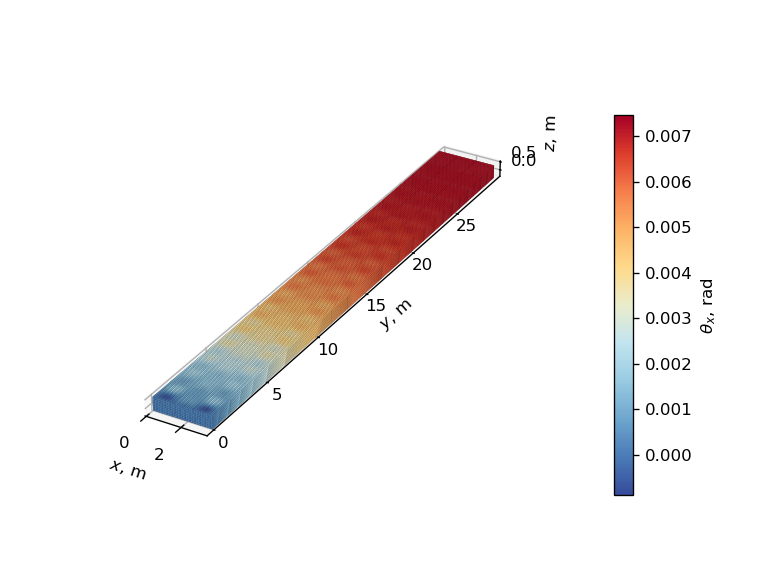

Deformation at design load of nonlinearly optimized structure:


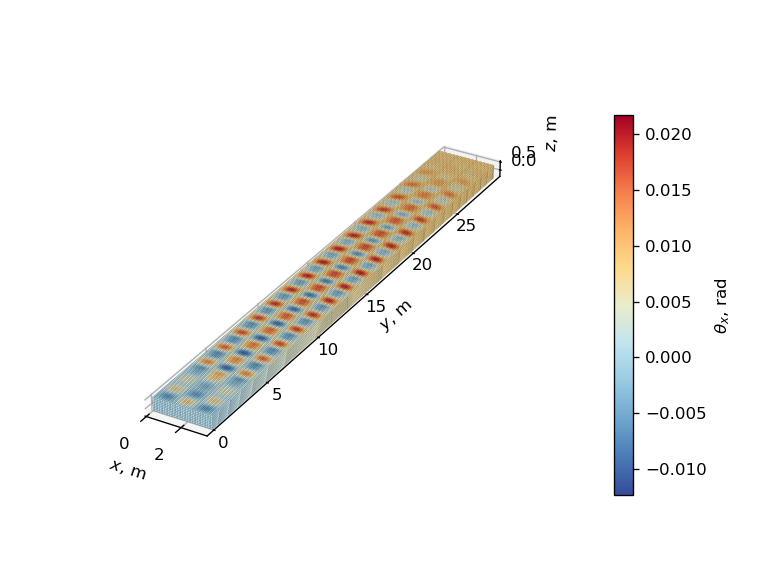

In [88]:
for key in design_labels:  # loop through the linearly and nonlinearly optimized structures
    print(f"Deformation at design load of {key}:")
    design_load_index = np.argmin(np.abs(nondimensional_loads_dict[key] - 1))  # find index of design load
    _, ax, cbar = pynastran_utils.plot_static_deformation(
        op2=sol_106_op2_dict[key], load_step=design_load_index + 1, displacement_component='rx', colormap='sunset', length_unit='m', unit_scale_factor=1e-3)  # plot deformation converting from mm to m
    adjust_3d_plot(ax, cbar)
    plt.show()